In [1]:
#Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sys

In [ ]:
#                                                                                SAMSUNG

In [2]:
#Load company financial dataset
data = pd.read_excel("C:/Users/kmate/Desktop/Praca licencjacka/dane/Azja/samsung_dataset.xlsx")

#Wkradła mi sie niepotrzena kopia jednej kolumny, usuwam ją
data['Rok'] = data['Kwartał'].str[-4:].astype(int)  # Extract last 4 characters as year
data['Q'] = data['Kwartał'].str[1:2].astype(int)  # Extract 2nd character as quarter

import datetime

def quarter_end_date(row):
    year = row['Rok']
    quarter = row['Q']
    month = 3 * quarter
    
    # Calculate the last day of the quarter
    if month == 12:
        quarter_end = datetime.date(year, month, 31)
    else:
        next_month = month + 1
        next_month_start = datetime.date(year, next_month, 1)
        quarter_end = next_month_start - datetime.timedelta(days=1)
    
    return quarter_end
    
data["Date"] = data[["Rok", "Q"]].apply(quarter_end_date, axis=1) 
data = data.set_index('Date')
data['Zysk brutto ze sprzedaży'] = pd.to_numeric(data['Zysk brutto ze sprzedaży'], errors='coerce')
data['EBITDA'] = pd.to_numeric(data['EBITDA'], errors='coerce')
data['Długoterminowe kredyty i pożyczki'] = pd.to_numeric(data['Długoterminowe kredyty i pożyczki'], errors='coerce')
data['Pożyczki krótkoterminowe'] = pd.to_numeric(data['Pożyczki krótkoterminowe'], errors='coerce')
#data['Wynik finansowy (zysk / strata)'] = pd.to_numeric(data['Wynik finansowy (zysk / strata)'], errors='coerce')


data_numeric = data.select_dtypes(include=[np.number])
data_numeric = data_numeric.apply(lambda x: x.fillna(x.mean()), axis=0)
data[data_numeric.columns] = data_numeric
#Show dataset information
print("Samsung")
print(data.info())

Samsung
<class 'pandas.core.frame.DataFrame'>
Index: 116 entries, 1995-03-31 to 2023-12-31
Data columns (total 19 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Indeks                             116 non-null    int64  
 1   Kwartał                            116 non-null    object 
 2   Przychody ogółem                   116 non-null    float64
 3   Zysk brutto ze sprzedaży           116 non-null    float64
 4   Zysk z działalności operacyjnej    116 non-null    float64
 5   EBITDA                             116 non-null    float64
 6   Przychody finansowe                116 non-null    float64
 7   Wydatki finansowe                  116 non-null    float64
 8   Zysk brutto                        116 non-null    float64
 9   Aktywa trwałe                      116 non-null    float64
 10  Aktywa obrotowe                    116 non-null    float64
 11  Kapitał własny ogółem              116 

In [4]:
describe = data.corr(numeric_only=True)
#describe.to_excel("corr_Samsung.xlsx")
describe

,Indeks,Przychody ogółem,Zysk brutto ze sprzedaży,Zysk z działalności operacyjnej,EBITDA,Przychody finansowe,Wydatki finansowe,Zysk brutto,Aktywa trwałe,Aktywa obrotowe,Kapitał własny ogółem,Kapitał własny spółki dominującej,Zobowiązania długoterminowe,Długoterminowe kredyty i pożyczki,Zobowiązania krótkoterminowe,Pożyczki krótkoterminowe,Rok,Q
Indeks,1.000000,0.724505,0.789464,0.643595,0.765691,0.531827,-0.158336,0.646314,0.326629,0.346787,0.354524,0.353148,0.221758,0.275107,0.310501,0.338478,9.994424e-01,3.338903e-02
Przychody ogółem,0.724505,1.000000,0.853040,0.852361,0.811226,0.817773,-0.431995,0.888420,0.474368,0.361862,0.436120,0.440032,0.292183,0.214281,0.398447,0.322678,7.168874e-01,2.401092e-01
Zysk brutto ze sprzedaży,0.789464,0.853040,1.000000,0.806646,0.969412,0.633541,-0.358077,0.807002,0.396760,0.354171,0.395967,0.396818,0.200775,0.245626,0.361530,0.373403,7.852215e-01,1.401819e-01
Zysk z działalności operacyjnej,0.643595,0.852361,0.806646,1.000000,0.835075,0.531521,-0.358888,0.987620,0.344629,0.315760,0.330630,0.332682,0.306406,0.158475,0.335675,0.336361,6.377187e-01,1.866584e-01
EBITDA,0.765691,0.811226,0.969412,0.835075,1.000000,0.579831,-0.328487,0.821940,0.340131,0.310282,0.342343,0.342792,0.168044,0.215381,0.317053,0.369794,7.604362e-01,1.700654e-01
Przychody finansowe,0.531827,0.817773,0.633541,0.531521,0.579831,1.000000,-0.522549,0.593266,0.408526,0.261318,0.360976,0.365869,0.163883,0.109174,0.303744,0.205324,5.240913e-01,2.404372e-01
Wydatki finansowe,-0.158336,-0.431995,-0.358077,-0.358888,-0.328487,-0.522549,1.000000,-0.312538,-0.208134,-0.139850,-0.165428,-0.167253,-0.243486,-0.086514,-0.181729,-0.127737,-1.473201e-01,-3.323752e-01
Zysk brutto,0.646314,0.888420,0.807002,0.987620,0.821940,0.593266,-0.312538,1.000000,0.380993,0.327985,0.359376,0.362249,0.300676,0.160580,0.355059,0.333466,6.406823e-01,1.793609e-01
Aktywa trwałe,0.326629,0.474368,0.396760,0.344629,0.340131,0.408526,-0.208134,0.380993,1.000000,0.952580,0.990792,0.991704,0.856084,0.787863,0.961902,0.802500,3.385745e-01,-3.521127e-01
Aktywa obrotowe,0.346787,0.361862,0.354171,0.315760,0.310282,0.261318,-0.139850,0.327985,0.952580,1.000000,0.979899,0.978353,0.913052,0.828722,0.978028,0.872378,3.606805e-01,-4.100770e-01


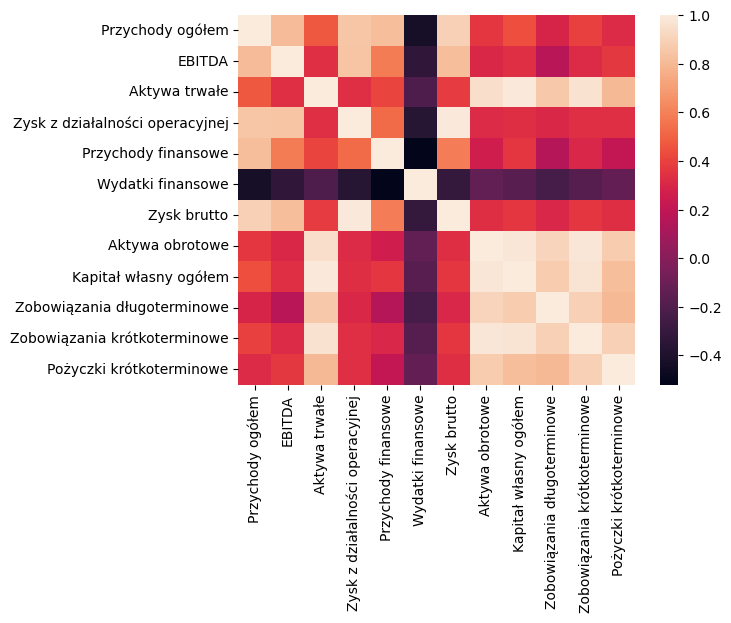

In [5]:
import pandas as pd
corr = data[["Przychody ogółem", "EBITDA", "Aktywa trwałe", "Zysk z działalności operacyjnej", "Przychody finansowe", "Wydatki finansowe",
                  "Zysk brutto", "Aktywa obrotowe", "Kapitał własny ogółem", "Zobowiązania długoterminowe", "Zobowiązania krótkoterminowe", "Pożyczki krótkoterminowe"]]
# Assuming you have a DataFrame called 'df' with relevant columns
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


matrix = corr.corr().round(2)
s = sns.heatmap(matrix)
plt.show()

#s.savefig(f"heathmap_Samsung.png")

<Figure size 700x1200 with 0 Axes>

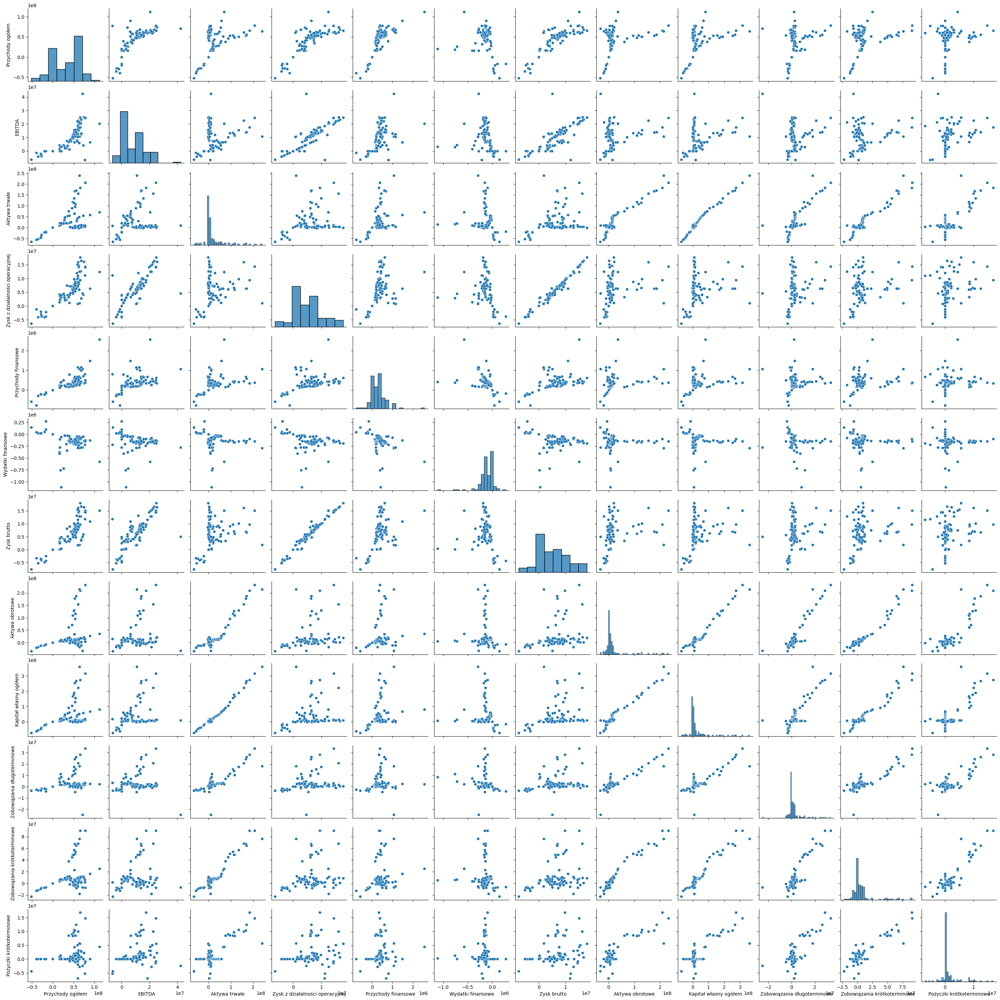

In [7]:
#Żadna ze zmiennych nie posiada wartości pustych. Jest to spowodowane tym, że jeżeli były jakieś braki danych w zbiorze
#Zdecydowałem je zastąpić średnią dla danego okresu, lub zostawić 0 jeżeli żaden z kwartałów nie miał danych
import warnings
warnings.filterwarnings("ignore")

#Zobaczmy sobie wykresy trzech dowolnych zmiennych wexmy na przykład Przychody ogółem, EBITDA oraz Aktywa trwałe. Sprawdźmy czy ich histogramy będą 
#przypominały rozkład normalny.

fig = plt.figure(figsize=(7,12))
pp = sns.pairplot(data[["Przychody ogółem", "EBITDA", "Aktywa trwałe", "Zysk z działalności operacyjnej", "Przychody finansowe", "Wydatki finansowe",
                  "Zysk brutto", "Aktywa obrotowe", "Kapitał własny ogółem", "Zobowiązania długoterminowe", "Zobowiązania krótkoterminowe", "Pożyczki krótkoterminowe"]])
pp.savefig(f"pp_Samsung.png")

In [3]:
def replace_outliers_with_mean(df, columns=None, threshold=3):
    """
    Identify outliers in the DataFrame using Z-score and replace them with the mean.

    Parameters:
    df : pandas DataFrame
        Input DataFrame.
    columns : list or None, optional
        List of columns to check for outliers. If None, all numeric columns will be checked. Default is None.
    threshold : float, optional
        Z-score threshold for identifying outliers. Default is 3.

    Returns:
    cleaned_df : pandas DataFrame
        DataFrame with outliers replaced by the mean.
    """
    # Select columns to check for outliers
    if columns is None:
        columns = df.select_dtypes(include=[np.number]).columns.tolist()

    # Create a copy of the DataFrame
    cleaned_df = df.copy()

    # Iterate over selected columns
    for column in columns:
        # Calculate Z-scores for each data point in the column
        z_scores = np.abs((df[column] - df[column].mean()) / df[column].std())

        # Find indices of outliers
        outlier_indices = z_scores > threshold

        # Replace outliers with the mean
        cleaned_df.loc[outlier_indices, column] = df[column].mean()

    return cleaned_df


data_ = replace_outliers_with_mean(data)


C:\Users\kmate\AppData\Local\Temp\ipykernel_16776\1268970241.py:33: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '58.5' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  cleaned_df.loc[outlier_indices, column] = df[column].mean()
C:\Users\kmate\AppData\Local\Temp\ipykernel_16776\1268970241.py:33: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '333084.7327586207' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  cleaned_df.loc[outlier_indices, column] = df[column].mean()
C:\Users\kmate\AppData\Local\Temp\ipykernel_16776\1268970241.py:33: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '2.5' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  cleaned_df.loc[outlier_in

In [4]:
#Widać, że rozkłady tych zmiennych nie przypominają rozkłady Gaussowskie. Upewnijmy sie jeszcze wykonując test na tych zbiorach
#W celu sprawdzenia pochodzenia próby skorzystamy z testu Shapiro-Wilka z biblioteki scipy


def ShaprioWilk(column):
    import scipy.stats as stats
    
    statistic, p_value = stats.shapiro(data[column].to_numpy())
    
    print("Statistic: ", statistic)
    print("P value: ", p_value)
    
    alpha = 0.05
    if p_value > alpha:
        return print(f"The data follow a normal distribution (p-value = {p_value:.4f})")
    else:
        return print(f"The data does not follows a normal distribution (p-value = {p_value:.4f})")




columns = list(data.columns)
columns.remove("Kwartał") #Dane jakosciowe
columns.remove("Indeks") #Nieistotne
columns.remove("Zysk brutto ze sprzedaży")
#columns.remove("Wynik finansowy (zysk / strata)")
columns.remove("Długoterminowe kredyty i pożyczki")
columns.remove("Rok")
columns.remove("Q")
for i in list(columns):
    print()
    print(i)
    print("-------------")
    ShaprioWilk(i)

    
#Zgodnie z wynikiem test próby nie pochodzą z rozkładu normalnego (Gaussa)

#Dla części kolumn policzenie testu było niemozliwe, sprawdźmy dlaczego i poprawmy dane tak, aby nie było żadnego problemu w dalszych krokach analizy


Przychody ogółem
-------------
Statistic:  0.9323879480361938
P value:  1.8611770428833552e-05
The data does not follows a normal distribution (p-value = 0.0000)

Zysk z działalności operacyjnej
-------------
Statistic:  0.954157829284668
P value:  0.0005668145604431629
The data does not follows a normal distribution (p-value = 0.0006)

EBITDA
-------------
Statistic:  0.9073857665061951
P value:  6.904339215907385e-07
The data does not follows a normal distribution (p-value = 0.0000)

Przychody finansowe
-------------
Statistic:  0.8620761632919312
P value:  5.37708633174816e-09
The data does not follows a normal distribution (p-value = 0.0000)

Wydatki finansowe
-------------
Statistic:  0.7567865252494812
P value:  1.4049902734292186e-12
The data does not follows a normal distribution (p-value = 0.0000)

Zysk brutto
-------------
Statistic:  0.9596526026725769
P value:  0.001491206232458353
The data does not follows a normal distribution (p-value = 0.0015)

Aktywa trwałe
----------

C:\Users\kmate\AppData\Local\Temp\ipykernel_37728\2645967702.py:14: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  res.show()


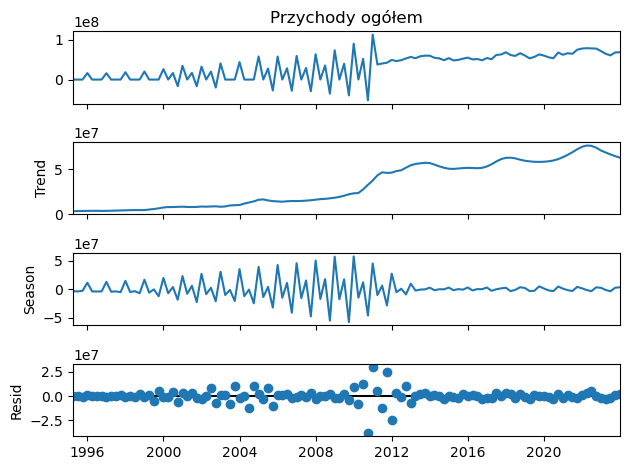

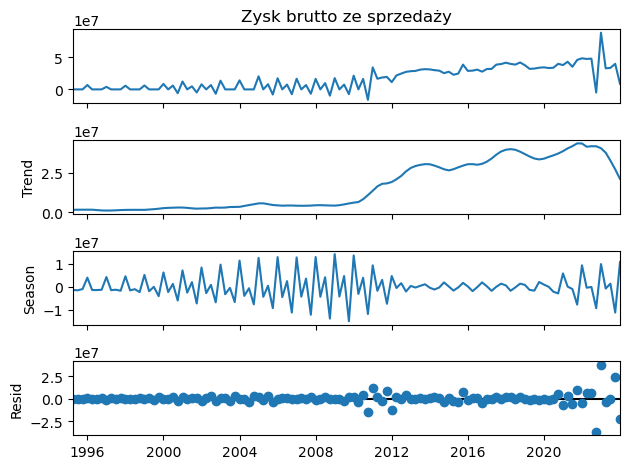

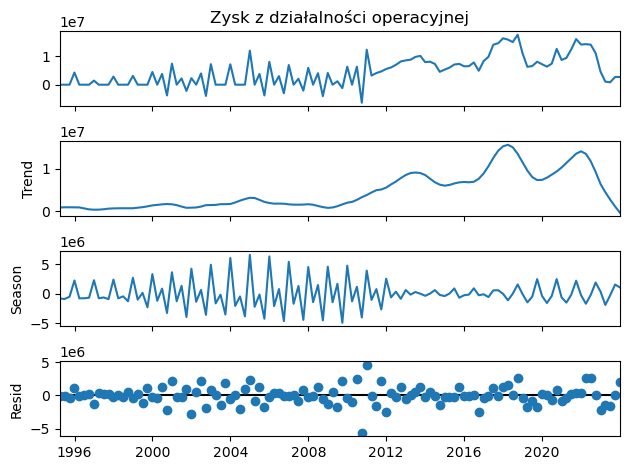

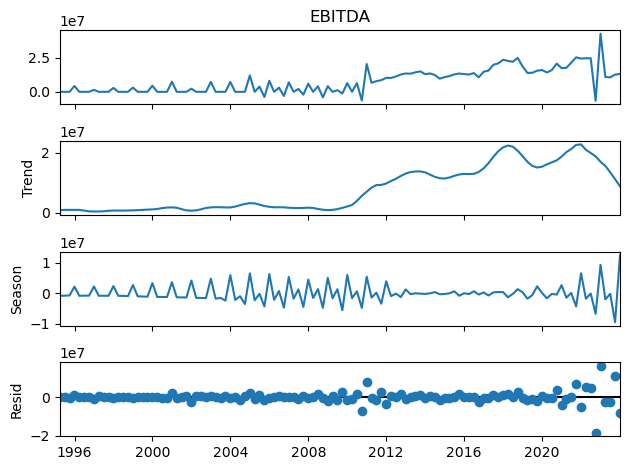

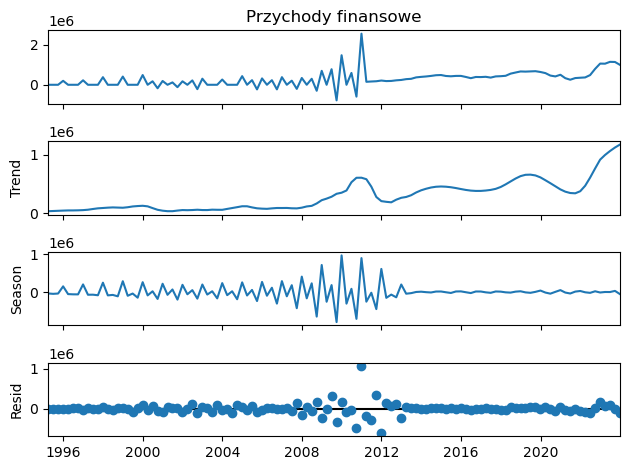

...

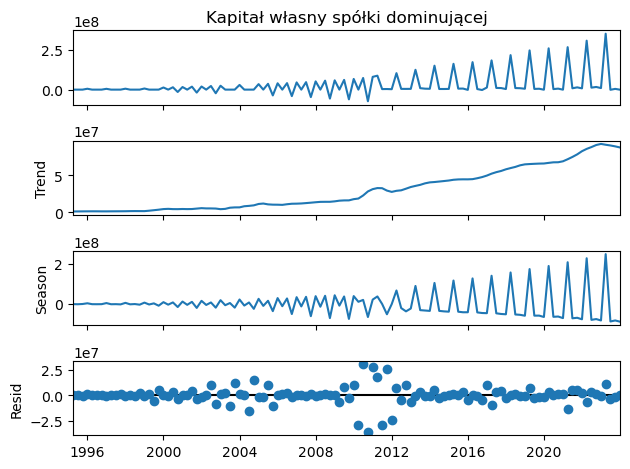

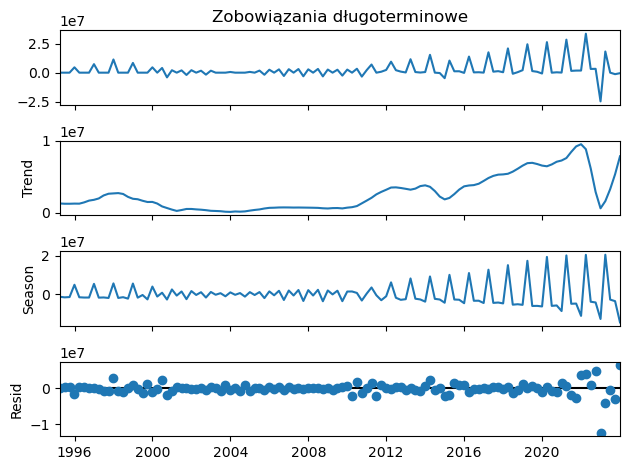

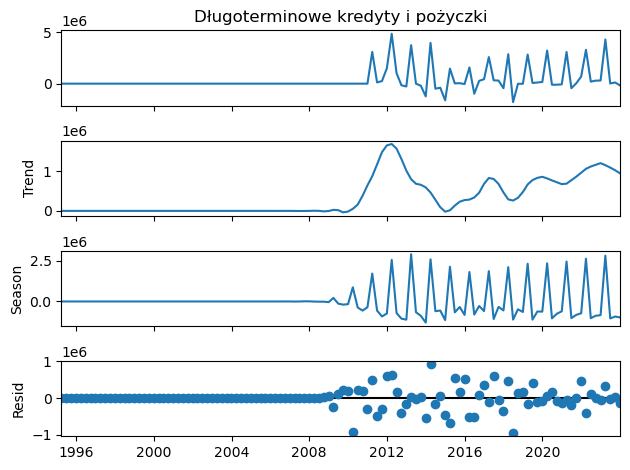

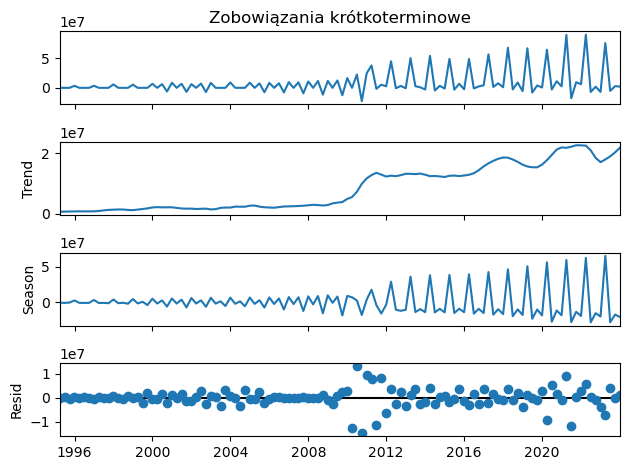

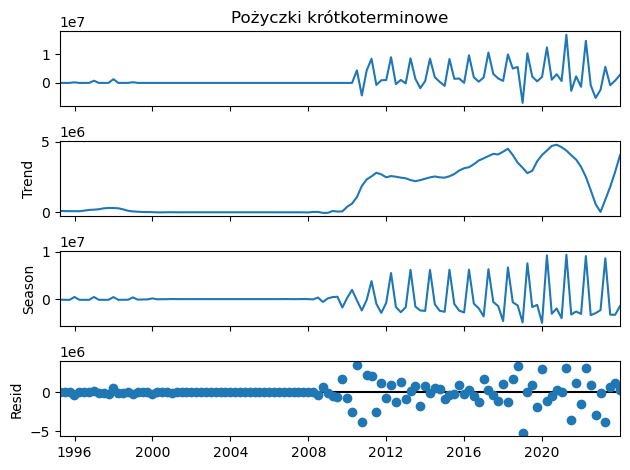

In [8]:
#Rozłózmy wszystkie szeregi na części pierwsze aby sprawdzić czy wystepuje sezonowość
temporary_ = data.copy()
temporary_ = data.drop(columns=["Indeks","Kwartał","Rok","Q"])

for i in list(temporary_.columns):
    
    from statsmodels.tsa.seasonal import STL
    
    season = data[f"{i}"]
    res = STL(endog=season, period=4).fit()
    res = res.plot()
    res.savefig(f"{i}_Samsung.png")
    
res.show()

In [19]:
#Ostatecznie po usunięciu zbędnych i wadliwych zmiennych zostało nam ich 12. Jest to wystarczająca liczba aby spróbować wytrenować
# czy dopasować model do tego szeregu. Sprawdźmy teraz jak wygladają te szeregi, czy są stacjonarne, czy wystepuje autokorelacja.
#W pierwszym kroku sprawidzmy działanie regresji liniowej. Następnie wypróbujemy model SARIMAX.
#Po dopasowaniu klasycznych metod ekonometrycznych sprawdzimy efektywność modeli uczenia maszynowego (Random Forest, XGB), a juz na sam koniec zobaczymy
#jak z prognozami radzą sobie sieci neuronowe.

#Z racji, że mam dostęp do wielu zmiennych pozwole sobie na możliwość edycji powyższych planów i czasa

In [ ]:
#Autoregresja

In [9]:
#Sprawdzam stacjonarnosć każdej ze zmiennych

import pandas as pd
from statsmodels.tsa.stattools import adfuller


def adf_test(timeseries):
    # Perform Dickey-Fuller test
    result = adfuller(timeseries)
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print(f'\t{key}: {value}')
    if result[1] > 0.05:
        print("Time series is not stationary")
    else:
        print("Time series is stationary")


for i in list(columns):
    print()
    print(i)
    print("-------------")
    adf_test(data[i])



#Żaden z szeregów nie jest stacjonarny według testu ADF, potwierdźmy to testem KPSS


Przychody ogółem
-------------
ADF Statistic: -0.5127744076499146
p-value: 0.8894994569403247
Critical Values:
	1%: -3.4912451337340342
	5%: -2.8881954545454547
	10%: -2.5809876033057852
Time series is not stationary

Zysk z działalności operacyjnej
-------------
ADF Statistic: -1.4943288757687987
p-value: 0.5363148742831111
Critical Values:
	1%: -3.4924012594942333
	5%: -2.8886968193364835
	10%: -2.5812552709190673
Time series is not stationary

EBITDA
-------------
ADF Statistic: -1.1809158692485047
p-value: 0.6817508799457197
Critical Values:
	1%: -3.4924012594942333
	5%: -2.8886968193364835
	10%: -2.5812552709190673
Time series is not stationary

Przychody finansowe
-------------
ADF Statistic: -0.4239329129056597
p-value: 0.9060254974677561
Critical Values:
	1%: -3.4901313156261384
	5%: -2.8877122815688776
	10%: -2.5807296460459184
Time series is not stationary

Wydatki finansowe
-------------
ADF Statistic: -1.8212629824235869
p-value: 0.36995747338315865
Critical Values:
	1%: -

In [10]:
import pandas as pd
from statsmodels.tsa.stattools import kpss
import warnings
warnings.filterwarnings("ignore")

def kpss_test(timeseries):
    # Perform KPSS test
    result = kpss(timeseries)
    print('KPSS Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[3].items():
        print(f'\t{key}: {value}')
    if result[1] > 0.05:
        print("Time series is stationary")
    else:
        print("Time series is not stationary")


for i in list(columns):
    print()
    print(i)
    print("-------------")
    kpss_test(data[i])


#Obydwa testy wykazały brak stacjoanrności zmiennych, zróżnicujmy je i sprawdzmy założenie jeszcze raz


Przychody ogółem
-------------
KPSS Statistic: 1.6421213172019629
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Time series is not stationary

Zysk z działalności operacyjnej
-------------
KPSS Statistic: 1.2279832759001257
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Time series is not stationary

EBITDA
-------------
KPSS Statistic: 1.4917328375580001
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Time series is not stationary

Przychody finansowe
-------------
KPSS Statistic: 1.534734558050847
p-value: 0.01
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Time series is not stationary

Wydatki finansowe
-------------
KPSS Statistic: 0.6183872854787343
p-value: 0.020964792229205966
Critical Values:
	10%: 0.347
	5%: 0.463
	2.5%: 0.574
	1%: 0.739
Time series is not stationary

Zysk brutto
-------------
KPSS Statistic: 1.3015712507558423
p-value: 0.01
Critical Values:
	10%: 0.

In [5]:
#Zróżnicowany dataframe
import warnings
warnings.filterwarnings("ignore")

mol = data.drop(columns=["Kwartał", "Indeks",  "Rok", "Q"])
mol_diff = mol.diff()
mol_diff = mol_diff.dropna()

#Sprawdzmy stacjonarnosc

#ADF i KPSS
for i in list(columns):
    print()
    print(i)
    print("-------------")
    adf_test(mol_diff[i])
    kpss_test(mol_diff[i])



#Po róznicowaniu wszystkie szeregi wykazują stacjoanrnosć będąc badanym zarówno testem ADF jak i KPSS,
#Teraz przejdę do badania stopnia autokorelacji


Przychody ogółem
-------------


NameError: name 'adf_test' is not defined

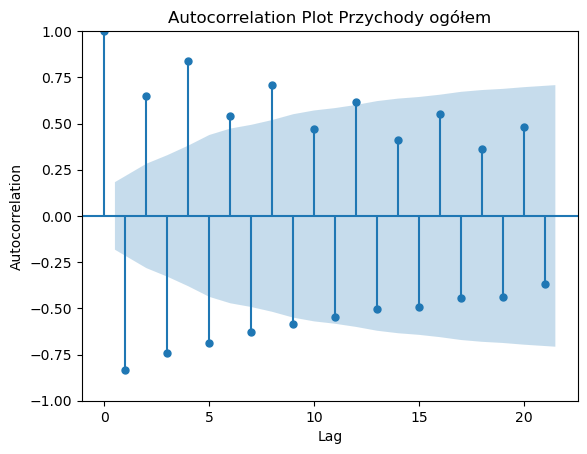

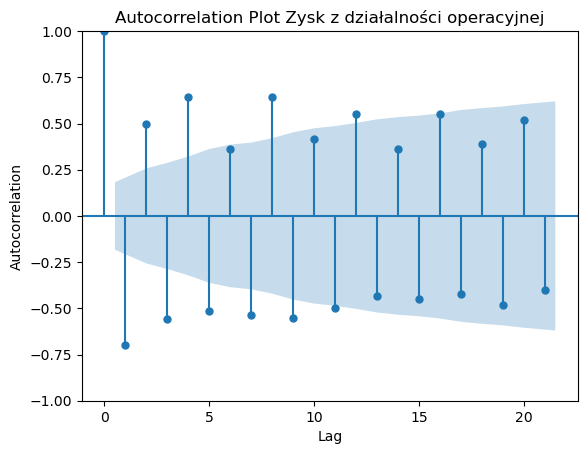

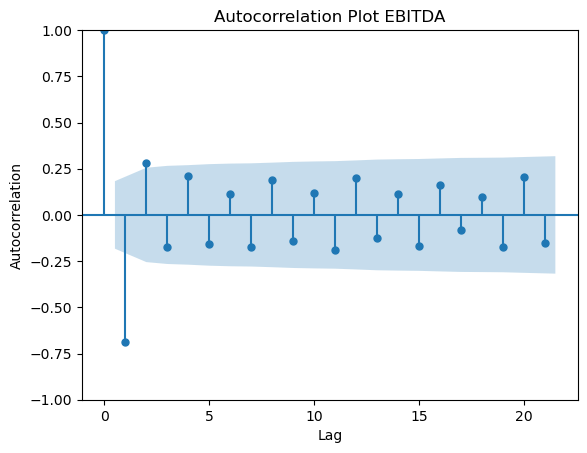

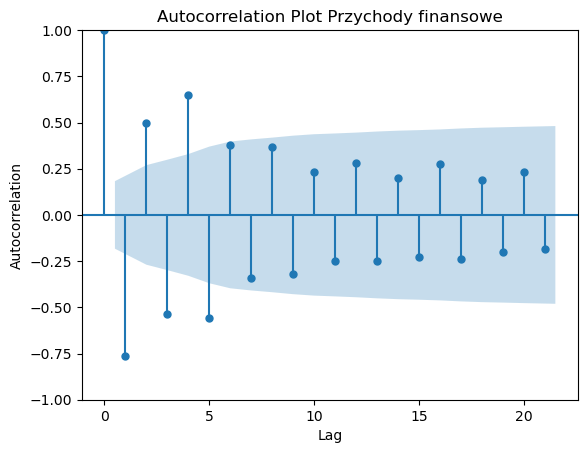

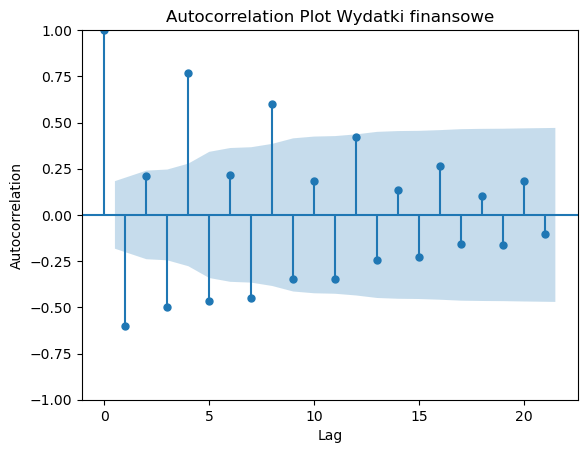

...

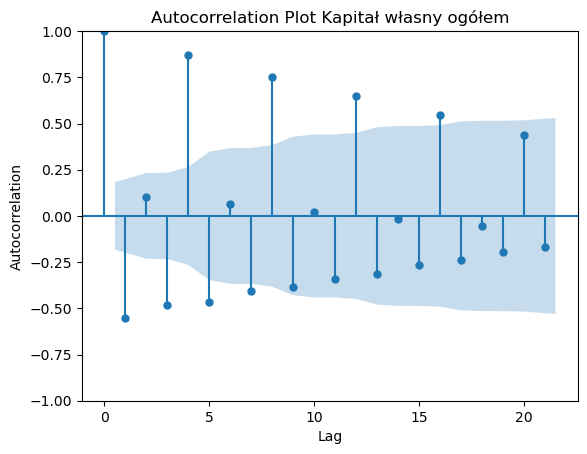

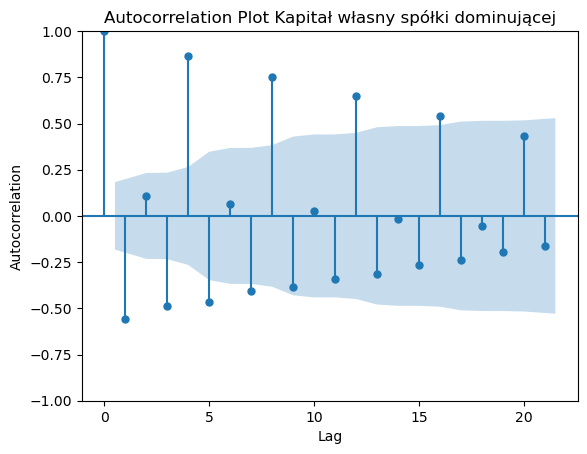

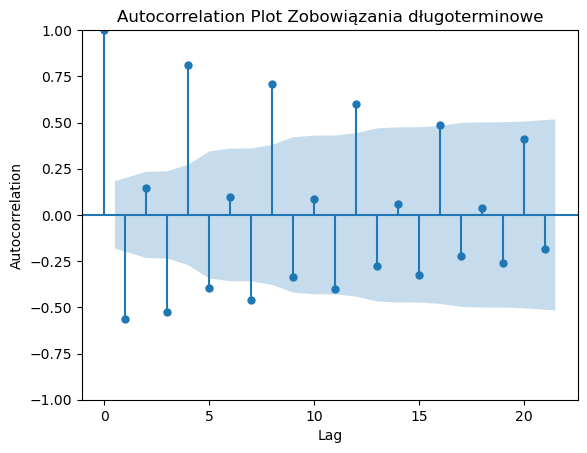

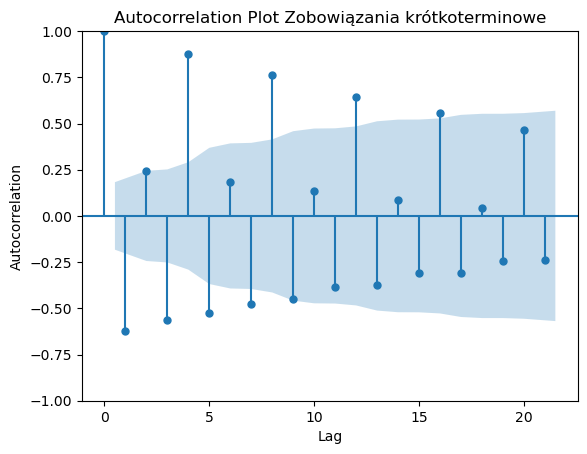

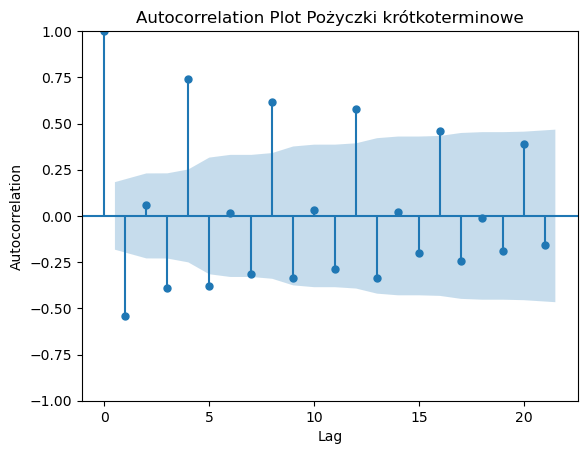

In [12]:
#Sprawdzam autokorelacje każdej ze zmiennych
import warnings
warnings.filterwarnings("ignore")


#ACF
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf


for i in list(columns):
    acf = plot_acf(mol_diff[i])
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation Plot {i}')
    acf.savefig(f"{i}_acf_Samsung.png")



    
plt.show()



#Zróbmy liste opóźnien dla każdej ze zmiennych:

#Przychody ogółem: 1,3,5,7,9,11,13,15,17
#Zysk z działalności operacyjnej: 1,3,5,7,9,11,13,15,17
#EBITDA: 1,3,5,7,9,11,13,15,17
#Przychody finansowe: 1,2,3
#Wydatki finansowe: 1,2,3,7,11
#Zysk brutto: 1,3,5
#Aktywa trwałe: 1,5,8
#Aktywa obrotowe: 1,5
#Kapitał własny ogółem: 1,2,3,4,5
#Zobowiązania długoterminowe: 1
#Zobowiązania krótkoterminowe:1
#Pożyczki krótkoterminowe: 1

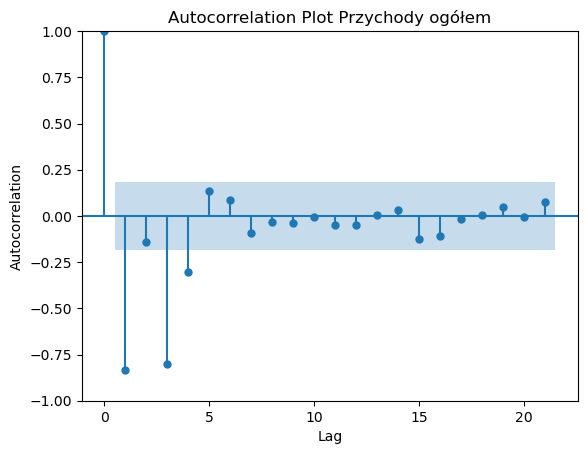

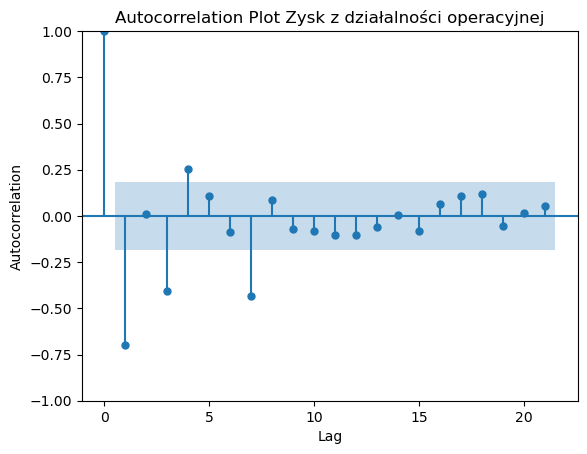

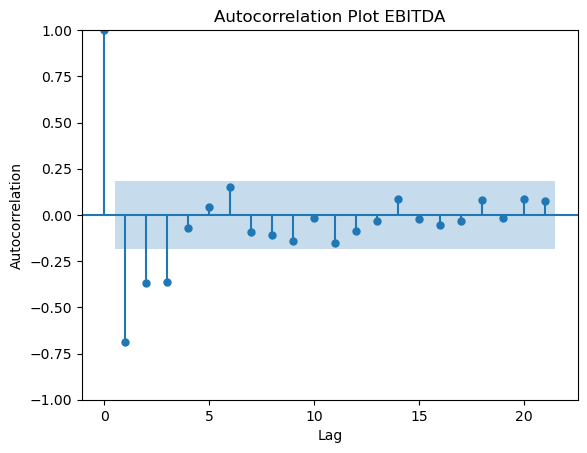

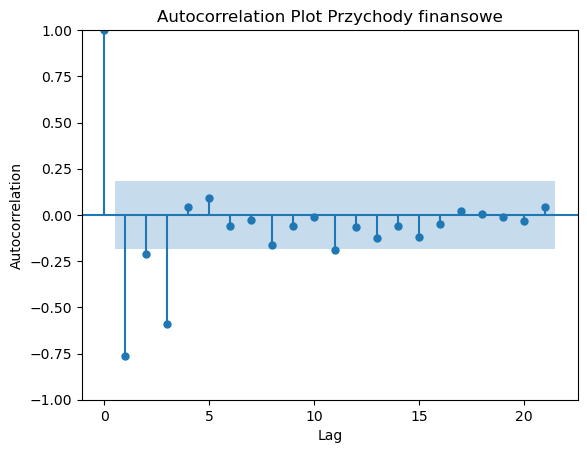

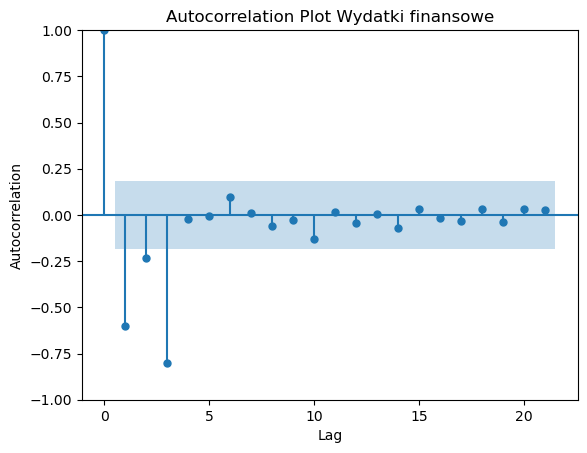

...

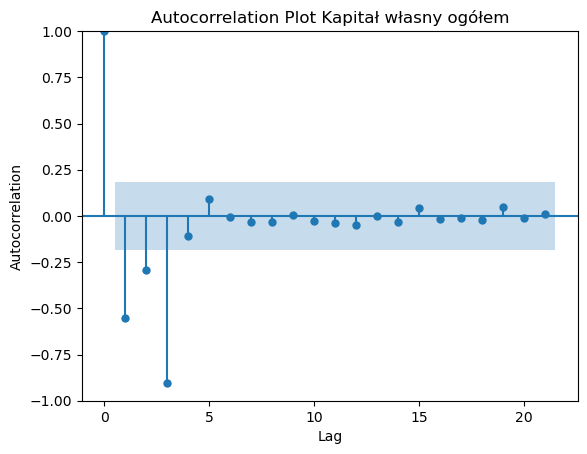

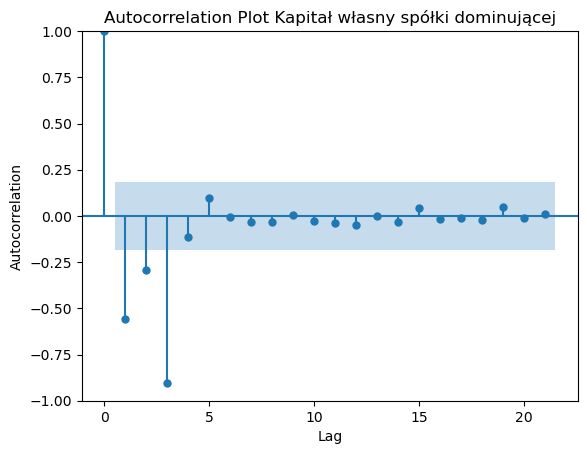

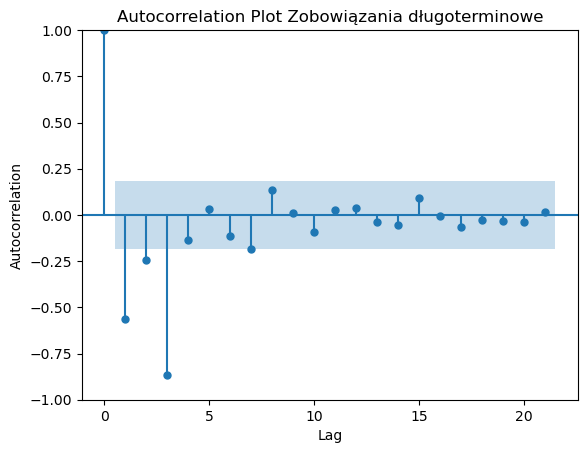

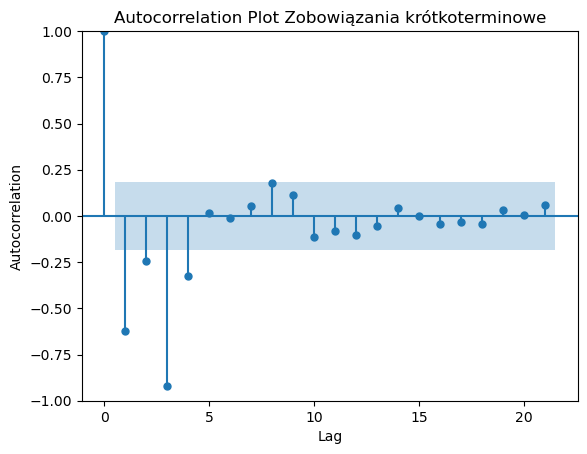

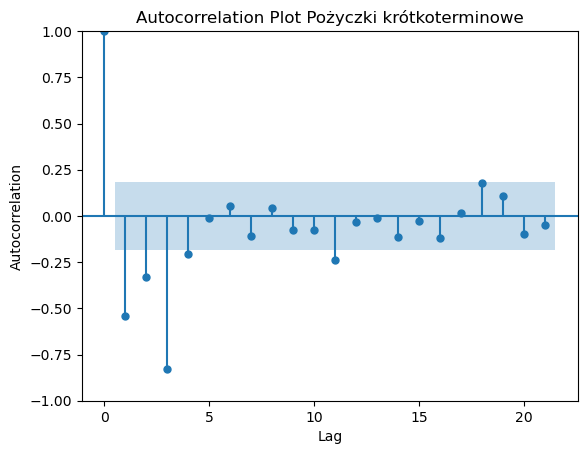

In [9]:



#PACF
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_pacf


for i in list(columns):
    pacf = plot_pacf(mol_diff[i])
    plt.xlabel('Lag')
    plt.ylabel('Autocorrelation')
    plt.title(f'Autocorrelation Plot {i}')
    pacf.savefig(f"{i}_pacf_Samsung.png")



    
plt.show()

#Zróbmy liste opóźnien dla każdej ze zmiennych:

#Przychody ogółem: 4
#Zysk z działalności operacyjnej: 2,3
#EBITDA: 2,3
#Przychody finansowe: 1
#Wydatki finansowe: 1,3
#Zysk brutto: 1,3,4
#Aktywa trwałe: 2
#Aktywa obrotowe: 1
#Kapitał własny ogółem: 1
#Zobowiązania długoterminowe: 1,2
#Zobowiązania krótkoterminowe:1
#Pożyczki krótkoterminowe: 1,2,3,5

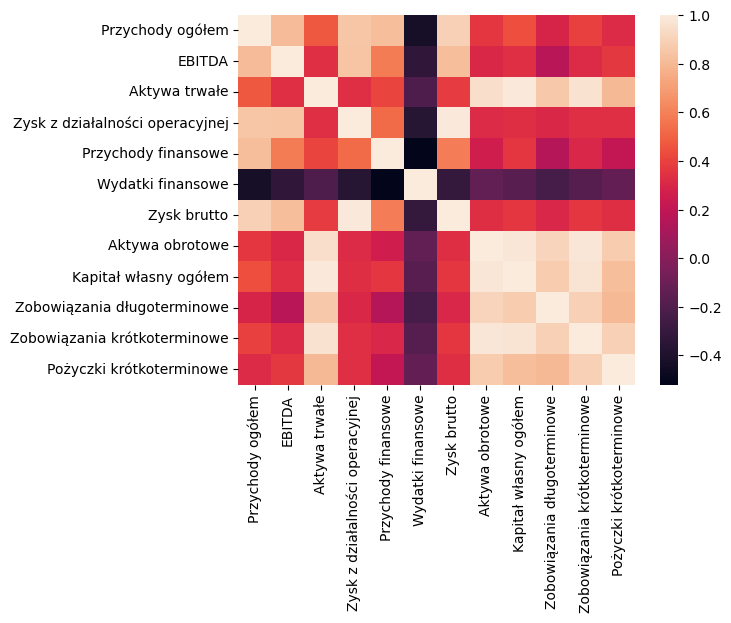

In [6]:
#Correlation
import pandas as pd
corr = data[["Przychody ogółem", "EBITDA", "Aktywa trwałe", "Zysk z działalności operacyjnej", "Przychody finansowe", "Wydatki finansowe",
                  "Zysk brutto", "Aktywa obrotowe", "Kapitał własny ogółem", "Zobowiązania długoterminowe", "Zobowiązania krótkoterminowe", "Pożyczki krótkoterminowe"]]
# Assuming you have a DataFrame called 'df' with relevant columns
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


matrix = corr.corr().round(2)
s = sns.heatmap(matrix)
plt.show()

C:\ProgramData\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency Q-DEC will be used.
  self._init_dates(dates, freq)


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Mon, 27, May, 2024
Time:                     23:38:21
--------------------------------------------------------------------
No. of Equations:         15.0000    BIC:                    363.303
Nobs:                     66.0000    HQIC:                   349.457
Log likelihood:          -11948.3    FPE:               9.56501e+149
AIC:                      340.411    Det(Omega_mle):    3.42685e+146
--------------------------------------------------------------------
Results for equation Przychody ogółem
                                          coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------------------------------------
const                                  1397862.146064    655499.775959            2.133           0.033
L1.Przychody ogółem                          0.796371        

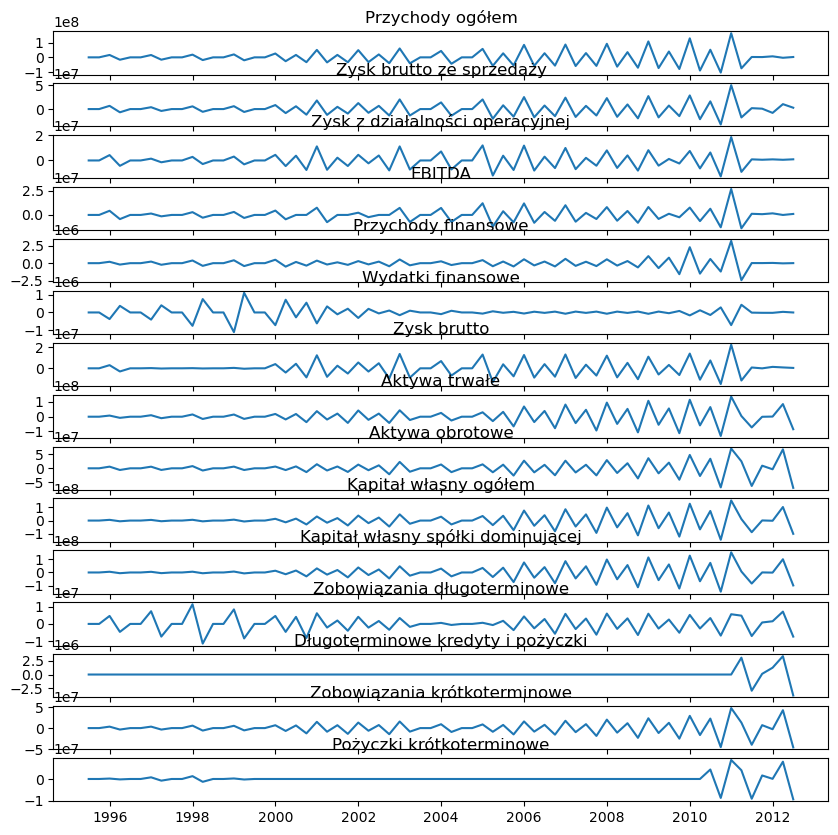

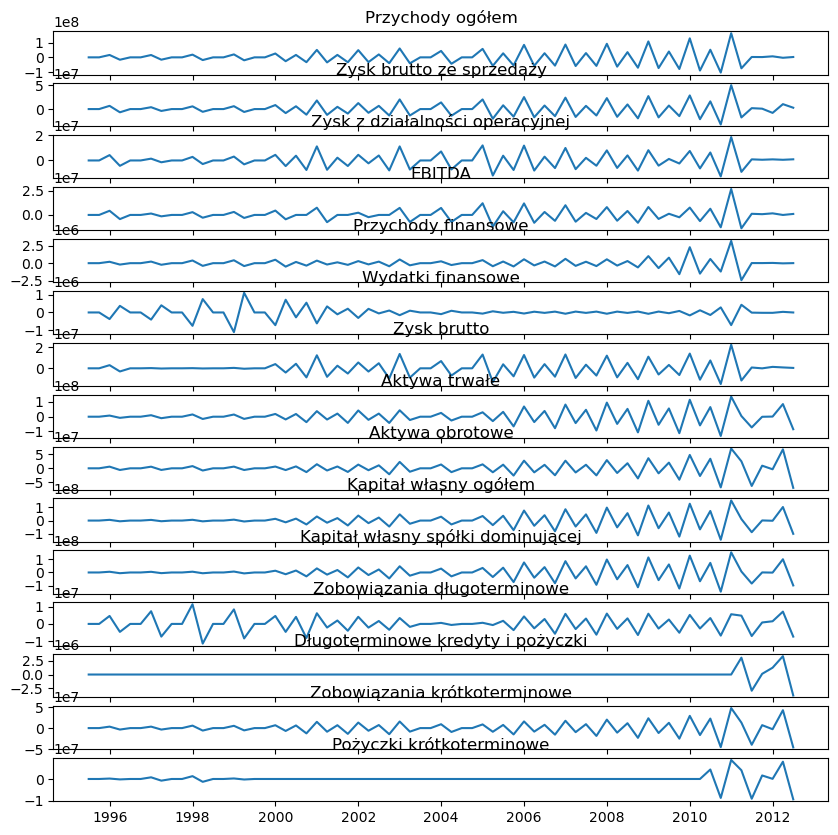

In [7]:
#VAR

import warnings
warnings.filterwarnings("ignore")

import pandas as pd
from statsmodels.tsa.api import VAR
from statsmodels.tsa.vector_ar.vecm import coint_johansen
from statsmodels.tools.eval_measures import rmse


#Dziele zbiór danych za część treningową i testową
train = mol_diff[:69]
test = mol_diff[69:]

#Dopasujmy model VAR i wybierzmy ten, który ma najlepszy AIC 

model = VAR(train)
results = model.fit(maxlags=3)

#Sprawdzam podsumowanie
print(results.summary())

results.plot()

Przychody ogółem


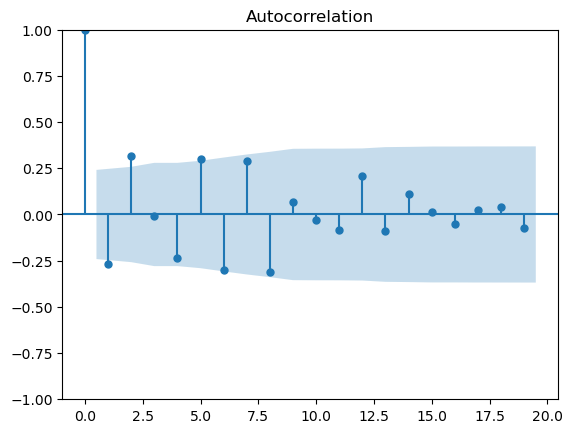

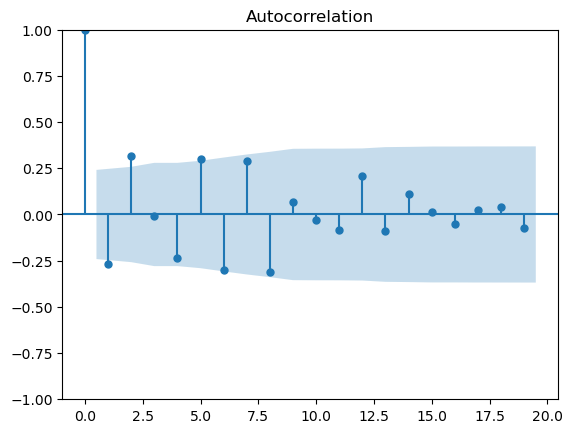

Zysk brutto ze sprzedaży


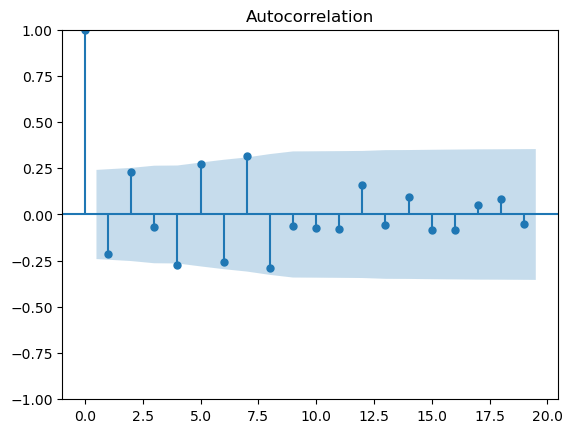

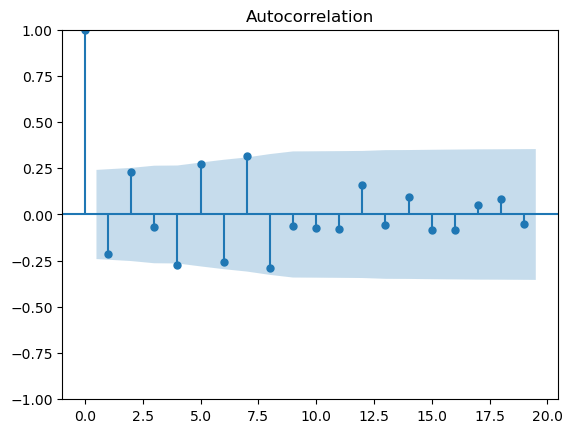

Zysk z działalności operacyjnej


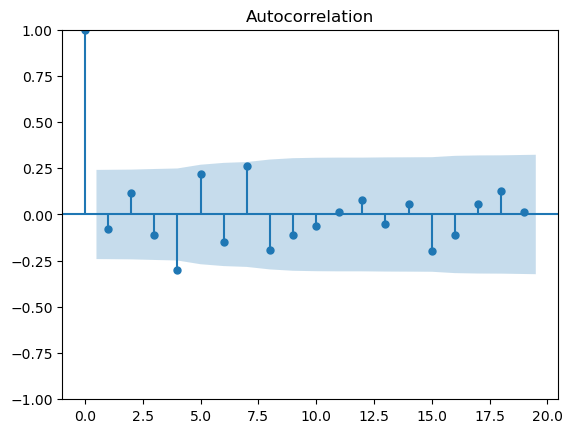

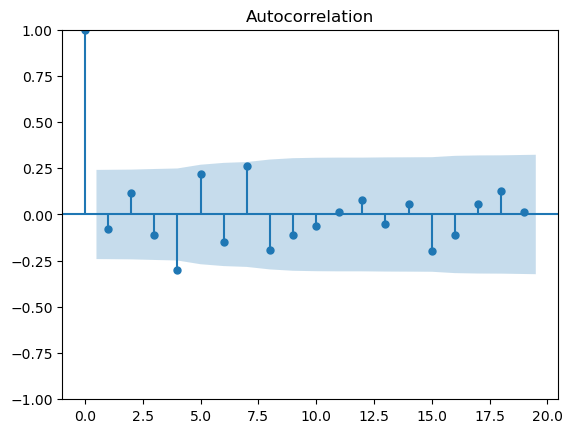

EBITDA


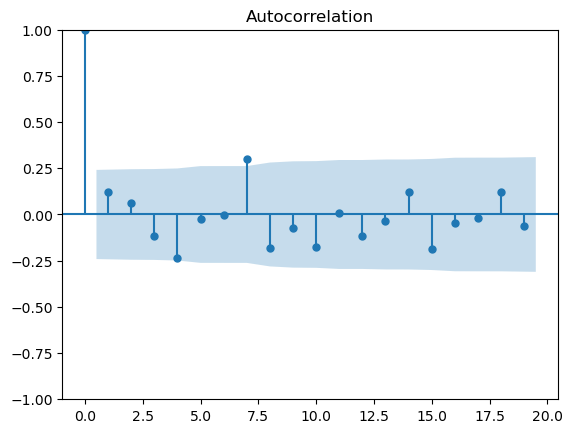

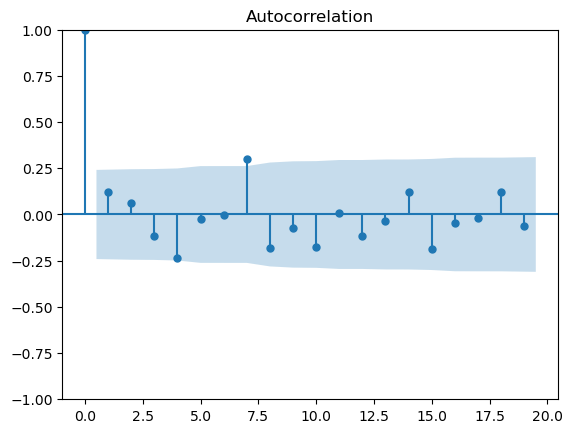

Przychody finansowe


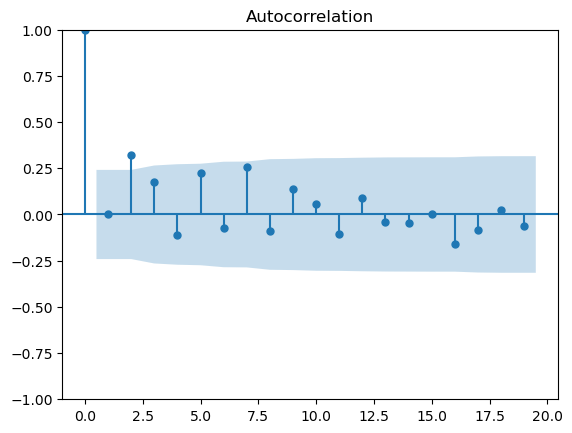

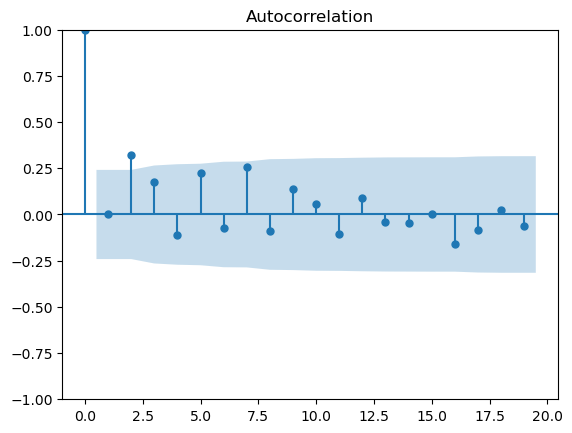

Wydatki finansowe


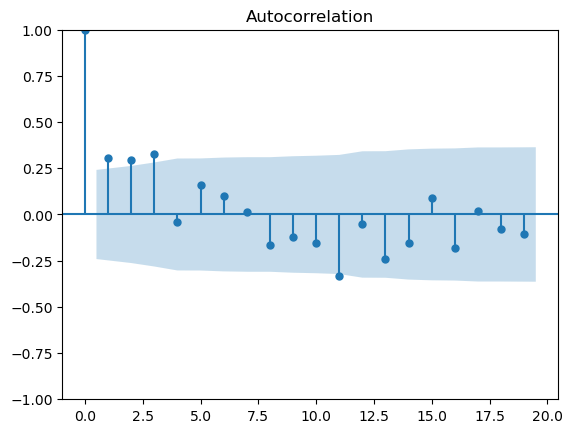

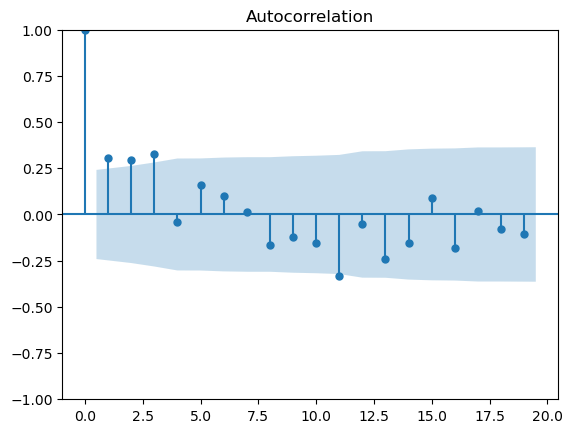

Zysk brutto


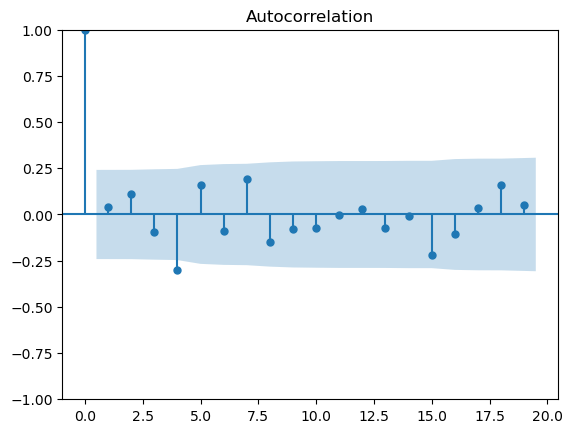

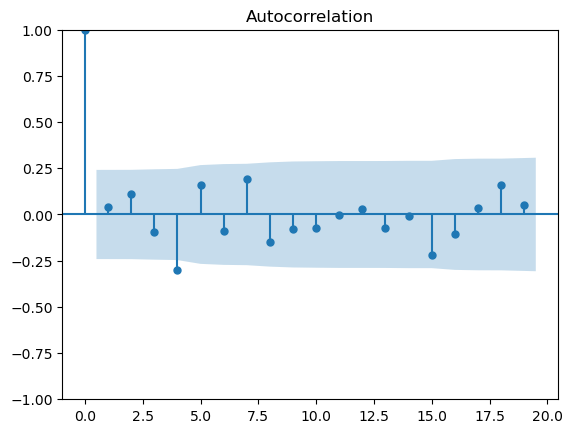

Aktywa trwałe


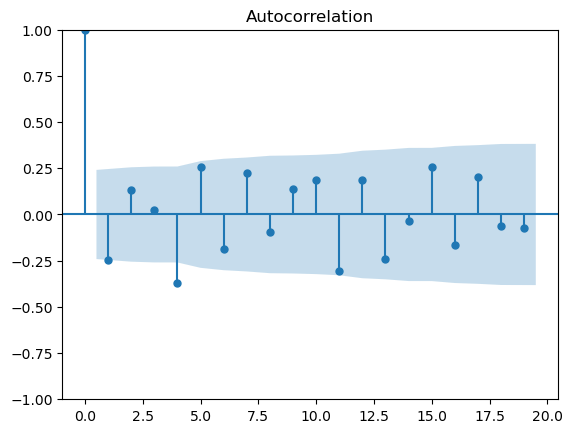

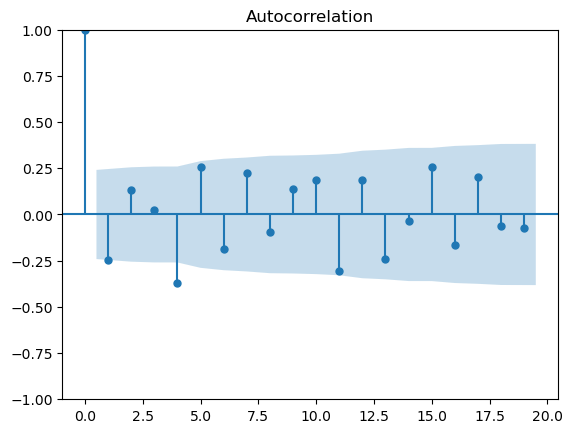

Aktywa obrotowe


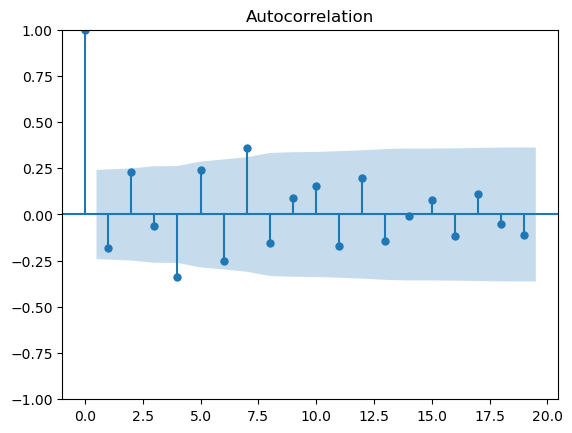

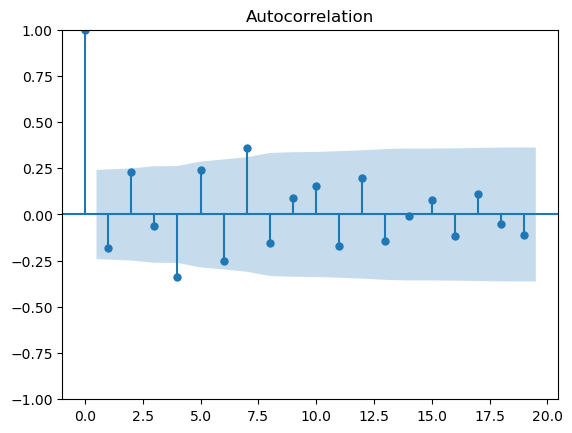

Kapitał własny ogółem


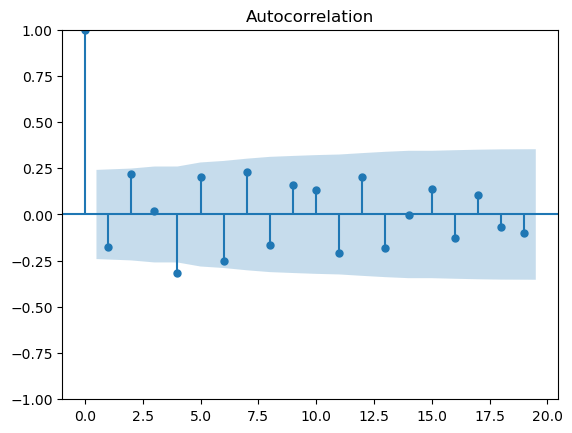

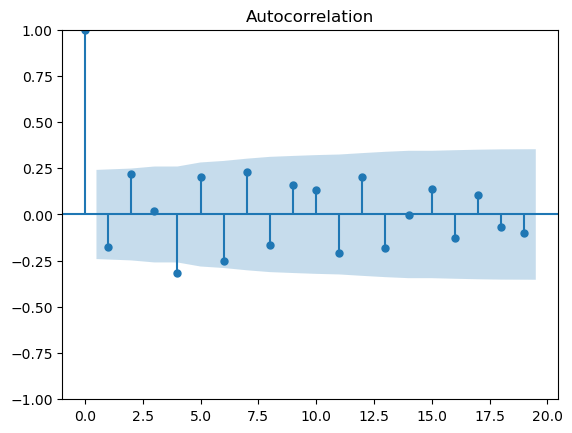

Kapitał własny spółki dominującej


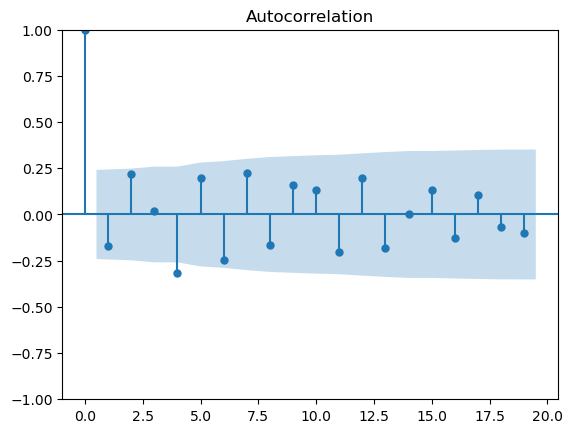

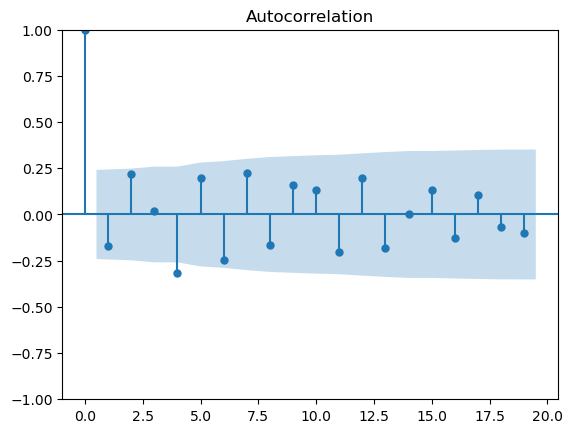

Zobowiązania długoterminowe


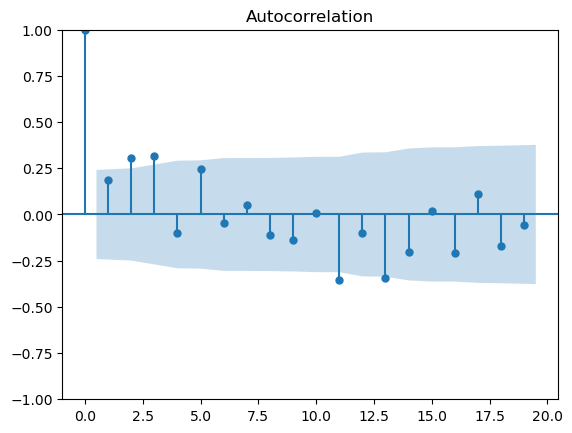

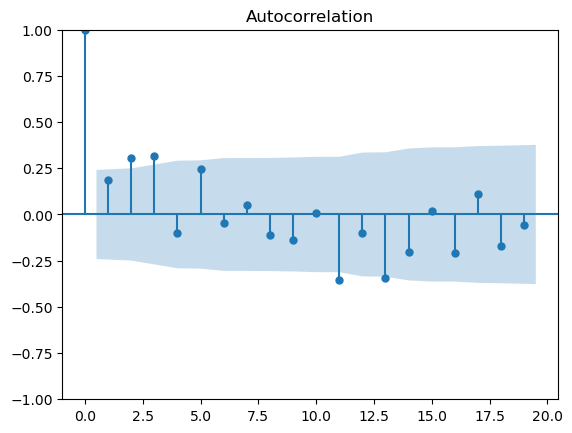

Długoterminowe kredyty i pożyczki


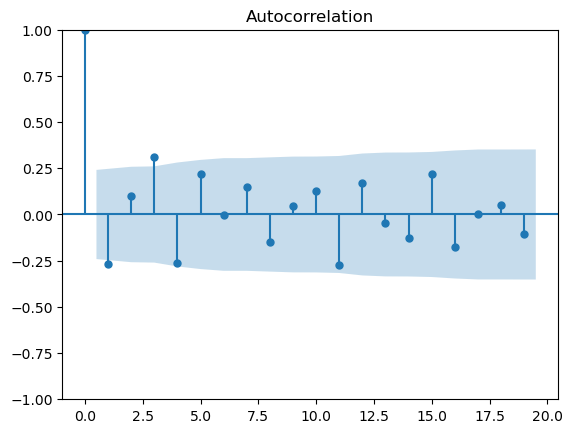

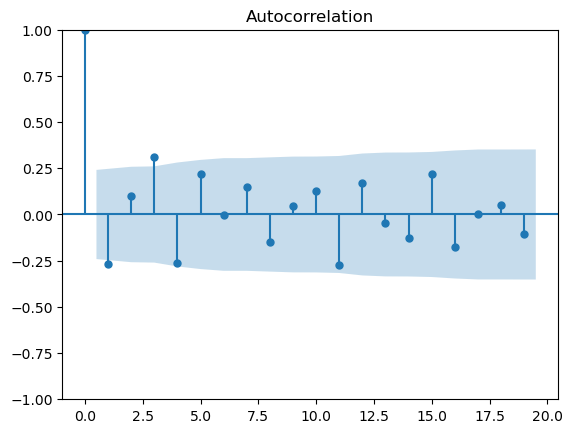

Zobowiązania krótkoterminowe


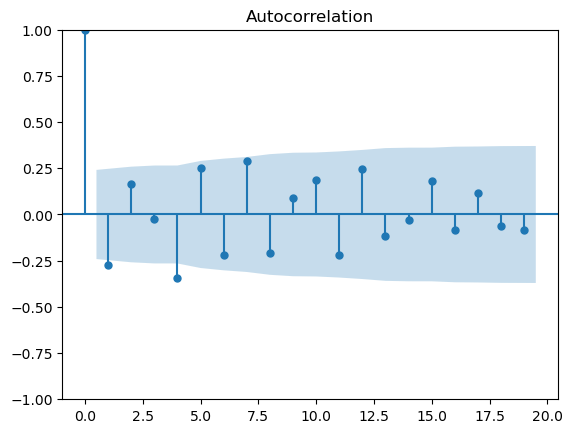

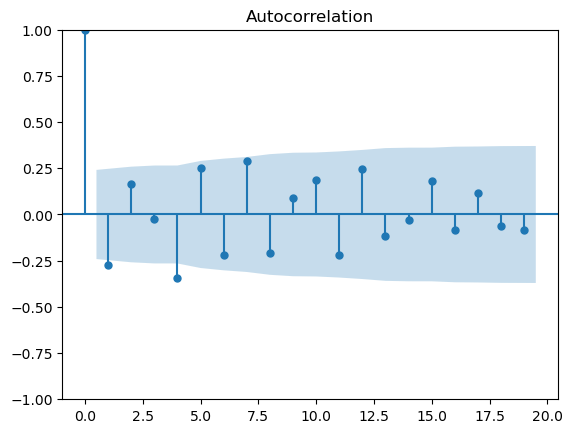

Pożyczki krótkoterminowe


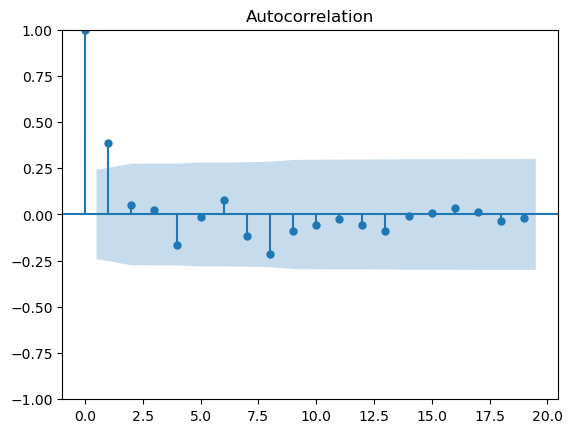

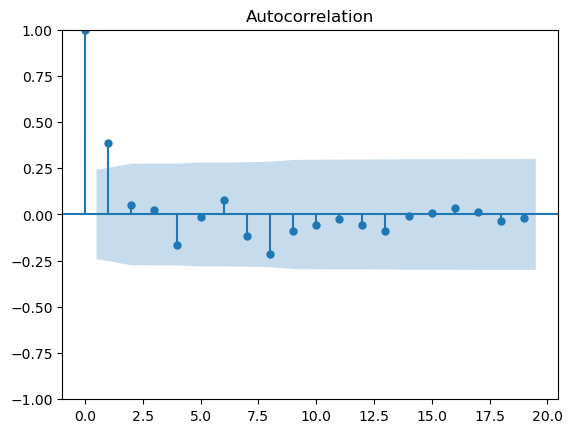

In [15]:
#Sprawdzmy czy reszty modelu wykazują autokroelacje

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


for i in list(results.resid.columns):
# Plot ACF and PACF of residuals
    print(f"{i}")
    plot_acf(results.resid[f"{i}"])
    plot_acf(results.resid[f"{i}"])
    plt.show()


#Na podstawie poniższych wykresów mozna stwierdzić, że nie występuje autokorelacja reszt, a zatem wszystkie zleżności liniowe zostały wyjąsnione

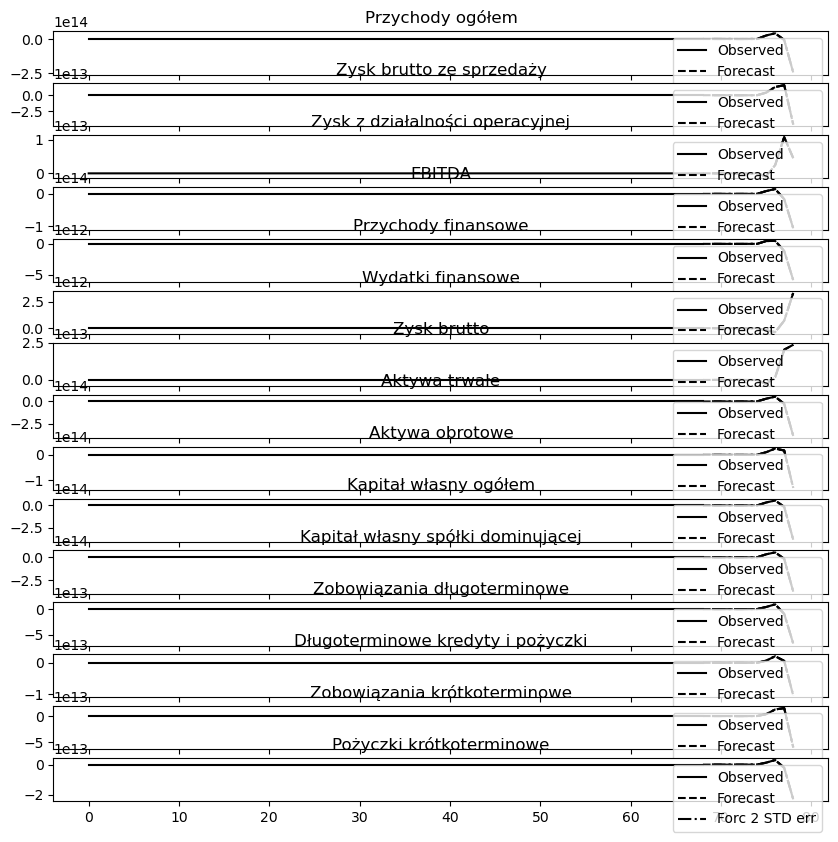

In [16]:
#Prognozy in sample

lag_order = results.k_ar
forc = results.forecast(train.values[-lag_order:], 5)
results.plot_forecast(10)

columns = list(train.columns)
index = [44,45,46,47,48]

forecast = pd.DataFrame(data = forc)
forecast.columns = train.columns
forecast.index = index
test_5 = test[:5]


In [17]:
# Make predictions on the test data

import pandas as pd
import numpy as np

def mean_absolute_percentage_error(y_true, y_pred):
    """
    Calculates Mean Absolute Percentage Error (MAPE).

    Parameters:
    y_true : pandas.Series
        Actual values.
    y_pred : pandas.Series
        Forecasted values.

    Returns:
    mape : float
        MAPE value.
    """

    df = pd.DataFrame({'y_true': y_true, 'y_pred': y_pred})
    df = df[df['y_true'] != 0]  # Exclude zero entries to avoid division by zero
    mape = np.mean(np.abs((df['y_true'] - df['y_pred']) / df['y_true'])) * 100
    return mape



forecast = results.forecast(results.endog, steps=len(test))

# Convert the forecast array to a DataFrame for easier manipulation
forecast_df = pd.DataFrame(forecast, index=test.index, columns=test.columns)

# Calculate residuals
residuals = test - forecast_df

# Calculate RMSE for each variable
rmse_values = rmse(test, residuals, axis=0)

# Calculate PMSE for each variable
pmse_values = (residuals ** 2).mean()

# Print RMSE and PMSE for each variable
print("RMSE:")
print(rmse_values)
for column in test.columns:
    mape = mean_absolute_percentage_error(test[column], forecast_df[column])
    print(f"MAPE for {column}: {round(mape, 2)}%")


#Oceniając model na podstawie błędów prognoz można stwierdzić, że model słabo stawia prognozy,
#ponieważ odchylenia wartości rzeczywistych od modelowych są bardzo duże


RMSE:
[2.16126993e+31 5.52569178e+30 6.53236986e+29 7.11151587e+30
 3.18743259e+29 1.58173427e+29 7.23938472e+29 2.71350069e+31
 1.18375479e+31 2.95128180e+31 2.83309140e+31 3.89060094e+30
 8.70768303e+29 5.57801338e+30 1.35950073e+30]
MAPE for Przychody ogółem: 9.65494048720036e+26%
MAPE for Zysk brutto ze sprzedaży: 7.659106298880679e+24%
MAPE for Zysk z działalności operacyjnej: 4.405153430412414e+27%
MAPE for EBITDA: 2.398444258616169e+26%
MAPE for Przychody finansowe: 3.6598691115663e+26%
MAPE for Wydatki finansowe: 1.7847606602976087e+26%
MAPE for Zysk brutto: 3.918391534281743e+25%
MAPE for Aktywa trwałe: 4.2283048197168476e+26%
MAPE for Aktywa obrotowe: 1.6704167303137776e+25%
MAPE for Kapitał własny ogółem: 1.0614817811138661e+26%
MAPE for Kapitał własny spółki dominującej: 1.0328487260703157e+26%
MAPE for Zobowiązania długoterminowe: 7.975356454094035e+25%
MAPE for Długoterminowe kredyty i pożyczki: 8.913835017510169e+25%
MAPE for Zobowiązania krótkoterminowe: 1.0900362734372

In [8]:
#Random Forest

random_forest_mol = data
#Dostosowanie danych

#random_forest_mol['Rok'] = random_forest_mol['Kwartał'].str[-4:]  # Extract last 4 characters as year
#random_forest_mol['Q'] = random_forest_mol['Kwartał'].str[1:2]  # Extract 2nd character as quarter
#random_forest_mol['Q'] = pd.to_numeric(random_forest_mol['Kwartał'], errors='coerce').fillna(0).astype(int)
#random_forest_mol = random_forest_mol["Rok"].astype(int)



random_forest_mol = random_forest_mol.drop(columns=["Indeks", "Kwartał", "Q", "Rok"])


random_forest_mol.info()

<class 'pandas.core.frame.DataFrame'>
Index: 116 entries, 1995-03-31 to 2023-12-31
Data columns (total 15 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Przychody ogółem                   116 non-null    float64
 1   Zysk brutto ze sprzedaży           116 non-null    float64
 2   Zysk z działalności operacyjnej    116 non-null    float64
 3   EBITDA                             116 non-null    float64
 4   Przychody finansowe                116 non-null    float64
 5   Wydatki finansowe                  116 non-null    float64
 6   Zysk brutto                        116 non-null    float64
 7   Aktywa trwałe                      116 non-null    float64
 8   Aktywa obrotowe                    116 non-null    float64
 9   Kapitał własny ogółem              116 non-null    float64
 10  Kapitał własny spółki dominującej  116 non-null    float64
 11  Zobowiązania długoterminowe        116 non-null

                                     SARIMAX Results                                      
Dep. Variable:                   Przychody ogółem   No. Observations:                   69
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood               -1234.677
Date:                            Sat, 18 May 2024   AIC                           2485.355
Time:                                    18:05:17   BIC                           2503.227
Sample:                                06-30-1995   HQIC                          2492.445
                                     - 06-30-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5358      0.457      1.172      0.241      -0.360       1.432
ar.L2         -0.3429      0.212   

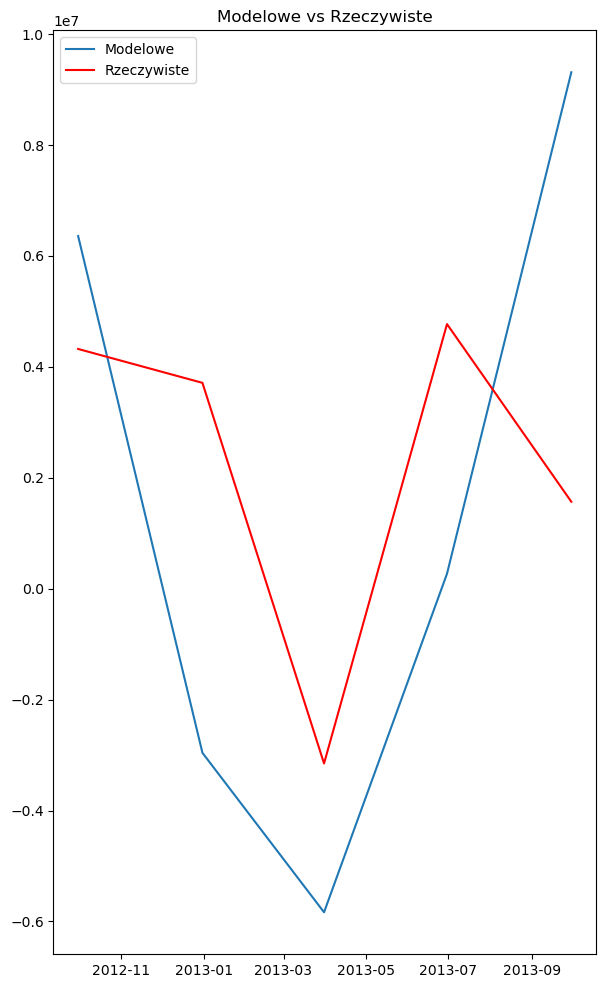

Błąd średniokwadratowy (MSE):  27208843343483.43
MAPE:  180.01 %
                                     SARIMAX Results                                      
Dep. Variable:           Zysk brutto ze sprzedaży   No. Observations:                   69
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood               -1171.255
Date:                            Sat, 18 May 2024   AIC                           2358.510
Time:                                    18:05:18   BIC                           2376.383
Sample:                                06-30-1995   HQIC                          2365.600
                                     - 06-30-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5879      0.266     -2.211      

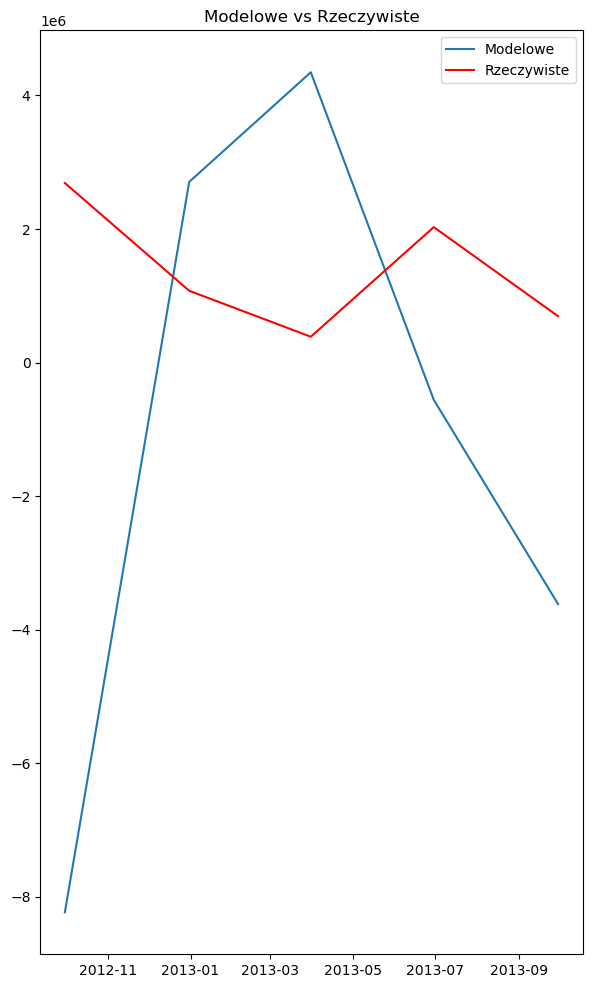

Błąd średniokwadratowy (MSE):  32588750874139.355
MAPE:  466.73 %
                                      SARIMAX Results                                      
Dep. Variable:     Zysk z działalności operacyjnej   No. Observations:                   69
Model:              SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood               -1108.153
Date:                             Sat, 18 May 2024   AIC                           2232.306
Time:                                     18:05:19   BIC                           2250.178
Sample:                                 06-30-1995   HQIC                          2239.396
                                      - 06-30-2012                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.0952      0.570     -1.

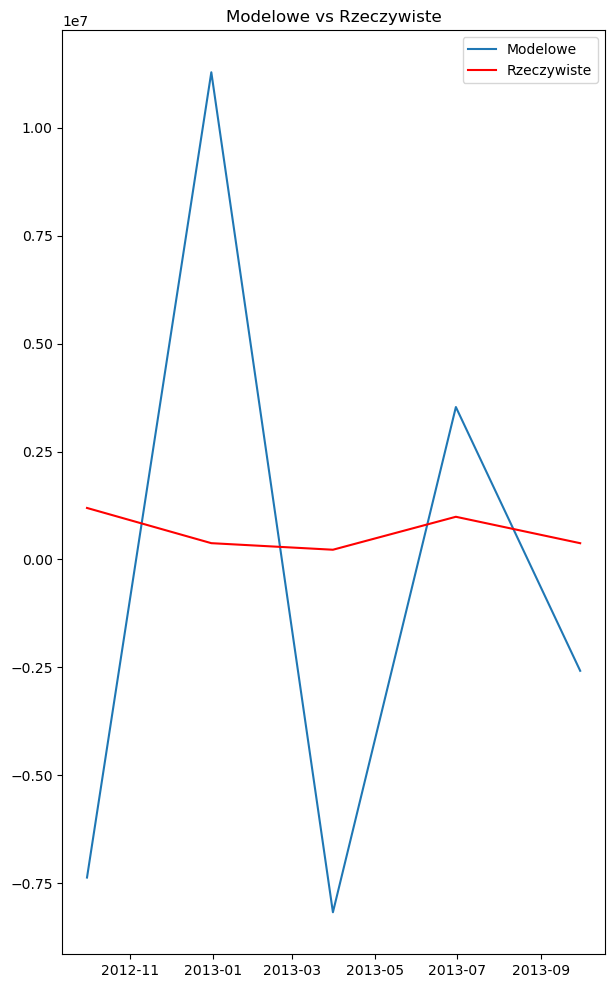

Błąd średniokwadratowy (MSE):  55572671026138.64
MAPE:  1674.07 %
                                     SARIMAX Results                                      
Dep. Variable:                             EBITDA   No. Observations:                   69
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood               -1126.498
Date:                            Sat, 18 May 2024   AIC                           2268.995
Time:                                    18:05:20   BIC                           2286.868
Sample:                                06-30-1995   HQIC                          2276.086
                                     - 06-30-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8595      0.173     -4.982     

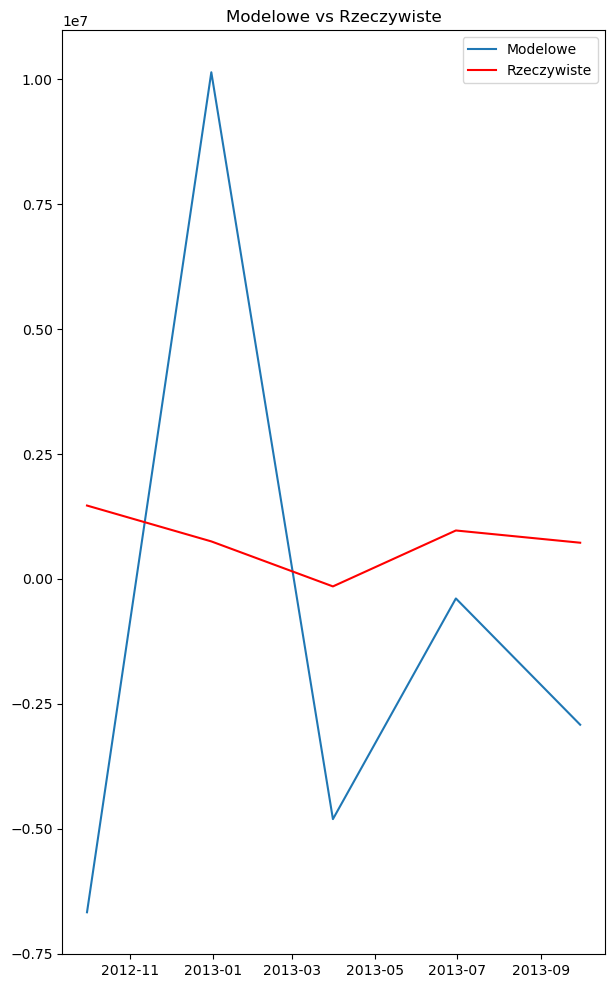

Błąd średniokwadratowy (MSE):  38226257516542.45
MAPE:  1112.16 %
                                     SARIMAX Results                                      
Dep. Variable:                Przychody finansowe   No. Observations:                   69
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -971.336
Date:                            Sat, 18 May 2024   AIC                           1958.671
Time:                                    18:05:21   BIC                           1976.544
Sample:                                06-30-1995   HQIC                          1965.762
                                     - 06-30-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.7536      0.254     -6.895     

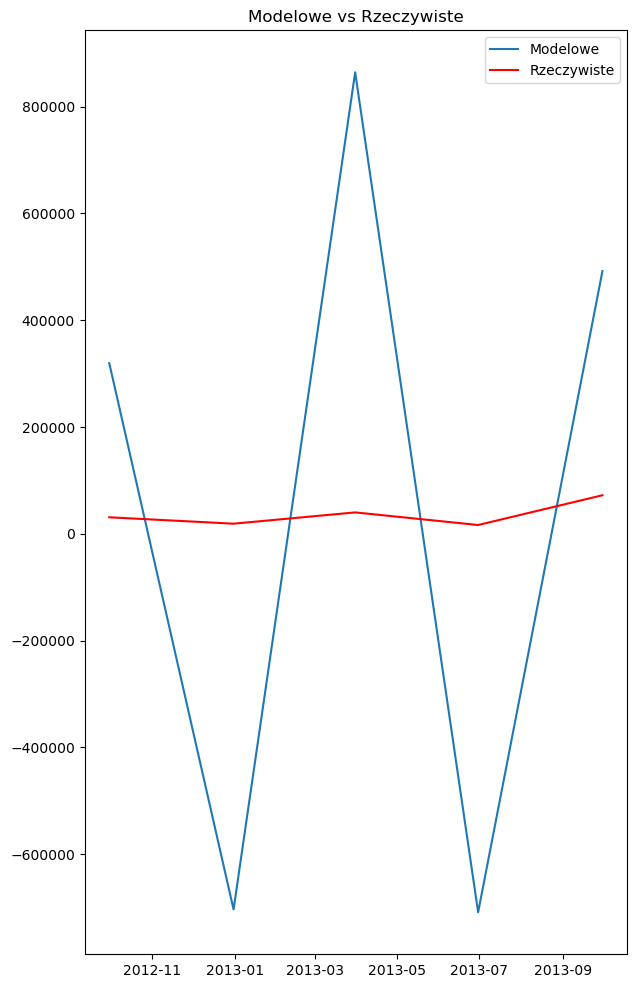

Błąd średniokwadratowy (MSE):  397217132594.3628
MAPE:  2352.48 %
                                     SARIMAX Results                                      
Dep. Variable:                  Wydatki finansowe   No. Observations:                   69
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -911.887
Date:                            Sat, 18 May 2024   AIC                           1839.774
Time:                                    18:05:21   BIC                           1857.646
Sample:                                06-30-1995   HQIC                          1846.864
                                     - 06-30-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8398      0.117     -7.183     

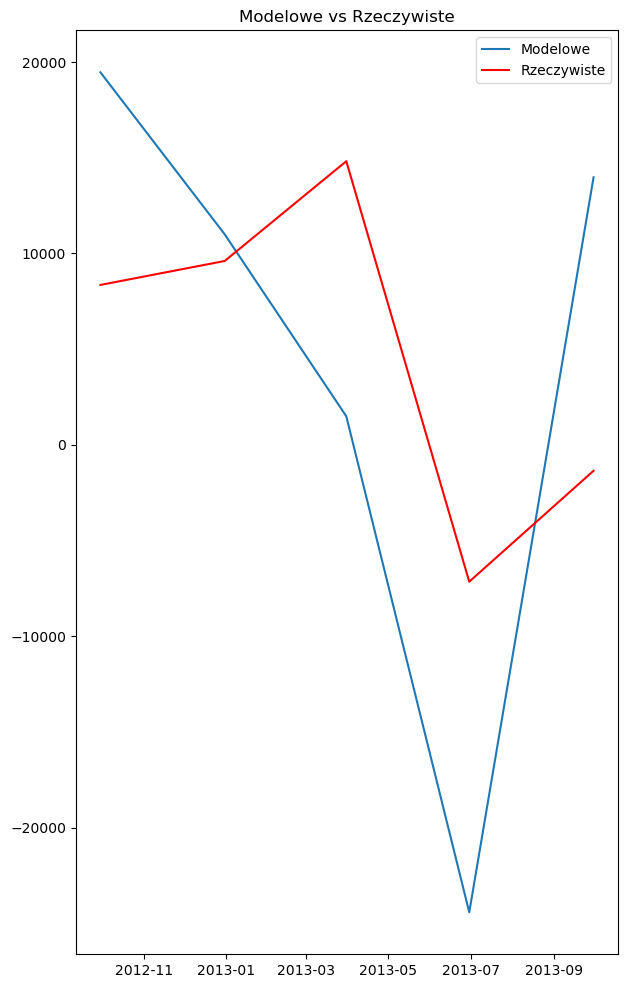

Błąd średniokwadratowy (MSE):  167201431.96478742
MAPE:  323.07 %
                                     SARIMAX Results                                      
Dep. Variable:                        Zysk brutto   No. Observations:                   69
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood               -1115.912
Date:                            Sat, 18 May 2024   AIC                           2247.824
Time:                                    18:05:22   BIC                           2265.697
Sample:                                06-30-1995   HQIC                          2254.915
                                     - 06-30-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.2563      0.521     -2.411     

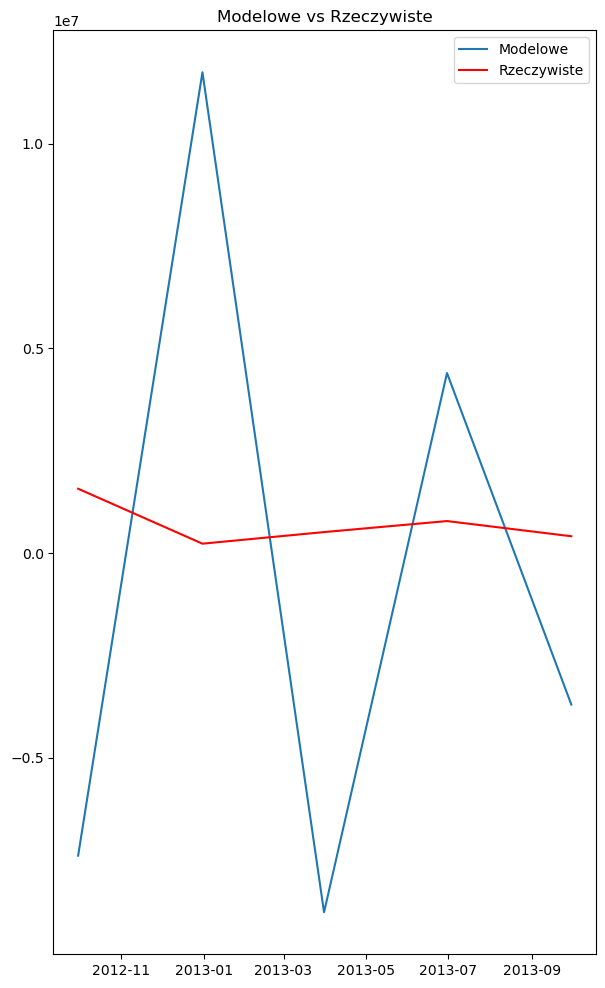

Błąd średniokwadratowy (MSE):  65868901359355.81
MAPE:  1770.47 %
                                     SARIMAX Results                                      
Dep. Variable:                      Aktywa trwałe   No. Observations:                   69
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood               -1232.319
Date:                            Sat, 18 May 2024   AIC                           2480.639
Time:                                    18:05:23   BIC                           2498.512
Sample:                                06-30-1995   HQIC                          2487.729
                                     - 06-30-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8031      0.250     -3.219     

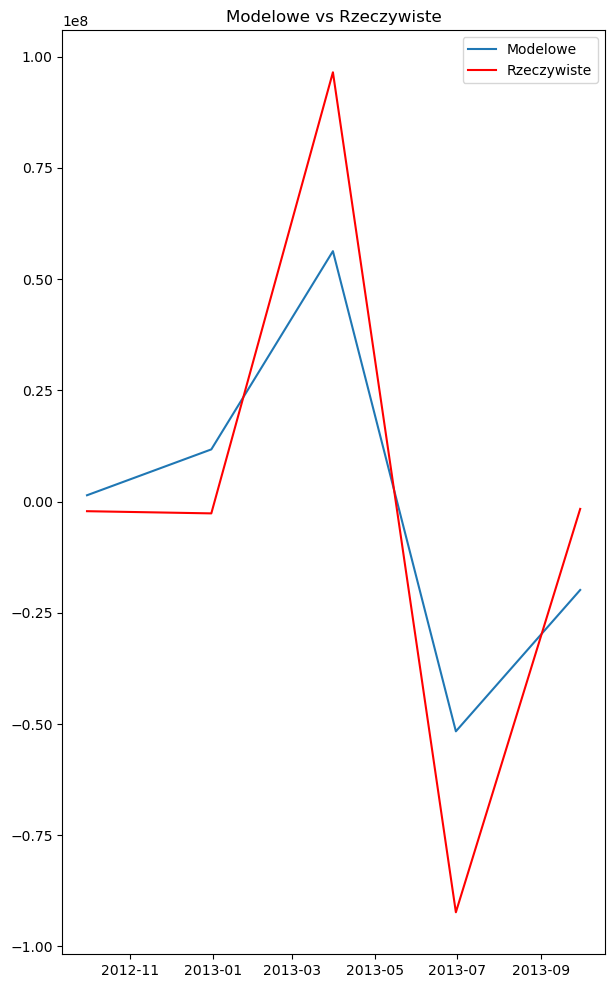

Błąd średniokwadratowy (MSE):  764527032810585.4
MAPE:  379.3 %
                                     SARIMAX Results                                      
Dep. Variable:                    Aktywa obrotowe   No. Observations:                   69
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood               -1205.102
Date:                            Sat, 18 May 2024   AIC                           2426.204
Time:                                    18:05:24   BIC                           2444.077
Sample:                                06-30-1995   HQIC                          2433.295
                                     - 06-30-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3549      0.428      0.829      0

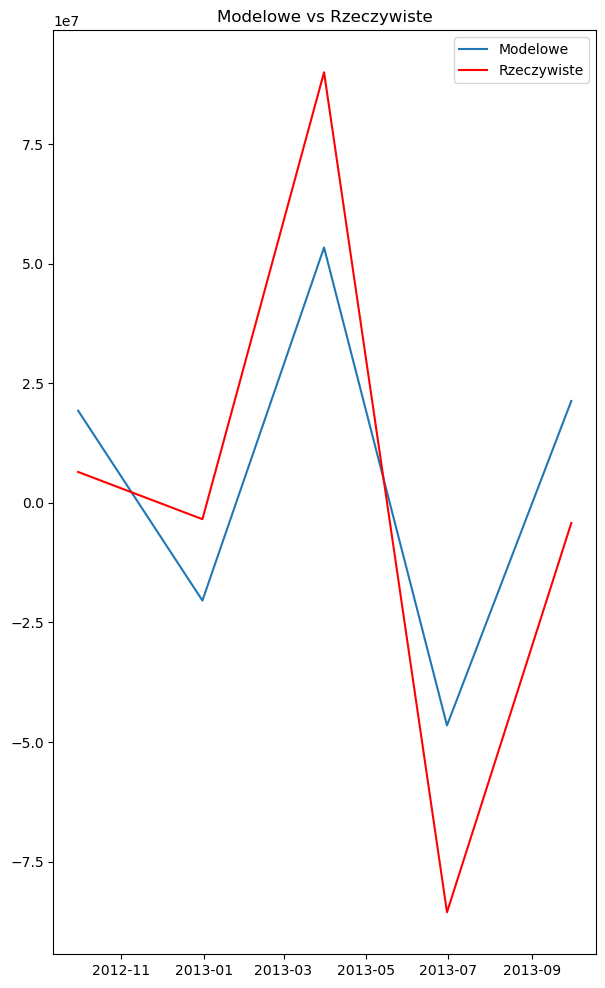

Błąd średniokwadratowy (MSE):  794466920838202.2
MAPE:  277.3 %
                                     SARIMAX Results                                      
Dep. Variable:              Kapitał własny ogółem   No. Observations:                   69
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood               -1242.887
Date:                            Sat, 18 May 2024   AIC                           2501.774
Time:                                    18:05:25   BIC                           2519.646
Sample:                                06-30-1995   HQIC                          2508.864
                                     - 06-30-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8436      0.298     -2.833      0

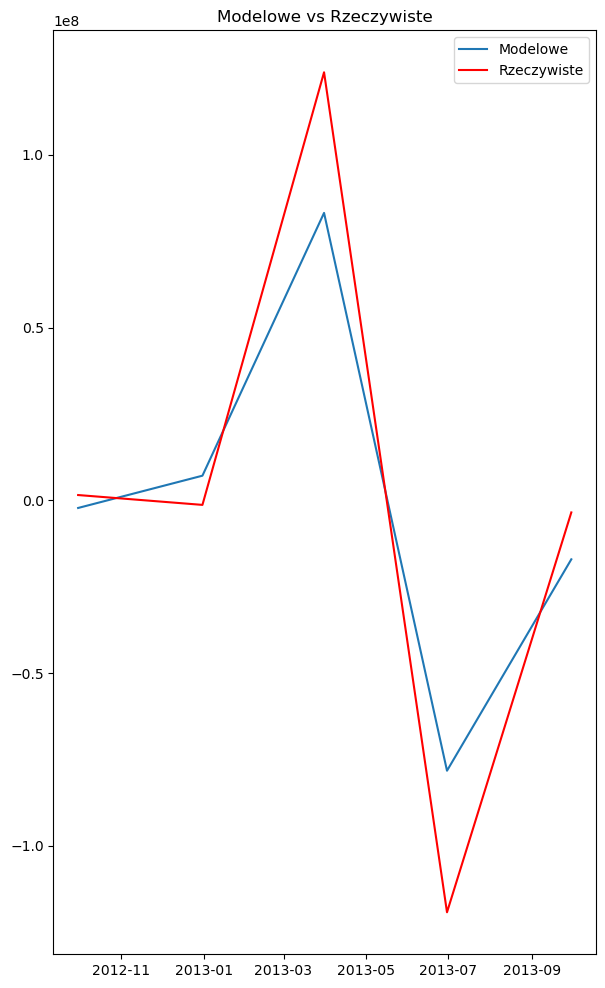

Błąd średniokwadratowy (MSE):  720902392594505.0
MAPE:  266.72 %
                                       SARIMAX Results                                       
Dep. Variable:     Kapitał własny spółki dominującej   No. Observations:                   69
Model:                SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood               -1241.129
Date:                               Sat, 18 May 2024   AIC                           2498.259
Time:                                       18:05:26   BIC                           2516.132
Sample:                                   06-30-1995   HQIC                          2505.349
                                        - 06-30-2012                                         
Covariance Type:                                 opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8463    

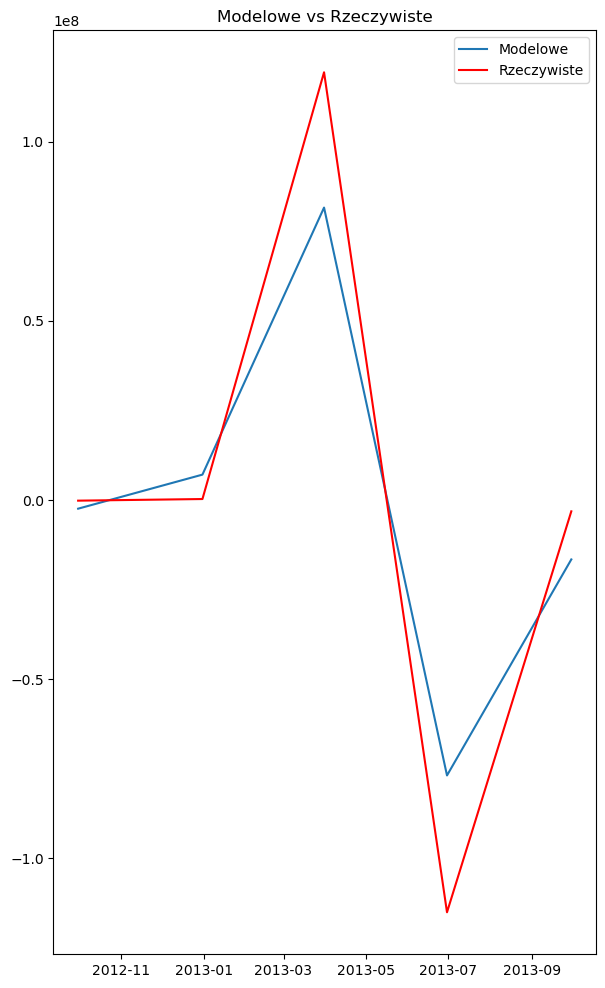

Błąd średniokwadratowy (MSE):  622881096254156.9
MAPE:  845.05 %
                                     SARIMAX Results                                      
Dep. Variable:        Zobowiązania długoterminowe   No. Observations:                   69
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood               -1083.937
Date:                            Sat, 18 May 2024   AIC                           2183.873
Time:                                    18:05:27   BIC                           2201.746
Sample:                                06-30-1995   HQIC                          2190.964
                                     - 06-30-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8207      0.119     -6.906      

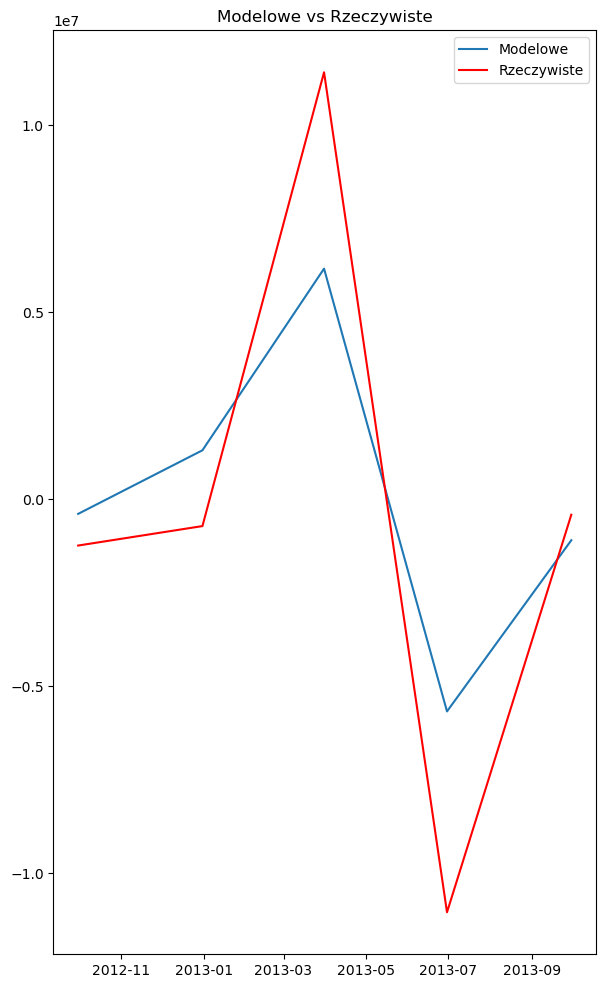

Błąd średniokwadratowy (MSE):  12335012062232.6
MAPE:  121.14 %
                                       SARIMAX Results                                       
Dep. Variable:     Długoterminowe kredyty i pożyczki   No. Observations:                   69
Model:                SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood                -988.043
Date:                               Sat, 18 May 2024   AIC                           1992.086
Time:                                       18:05:28   BIC                           2009.959
Sample:                                   06-30-1995   HQIC                          1999.177
                                        - 06-30-2012                                         
Covariance Type:                                 opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6698     

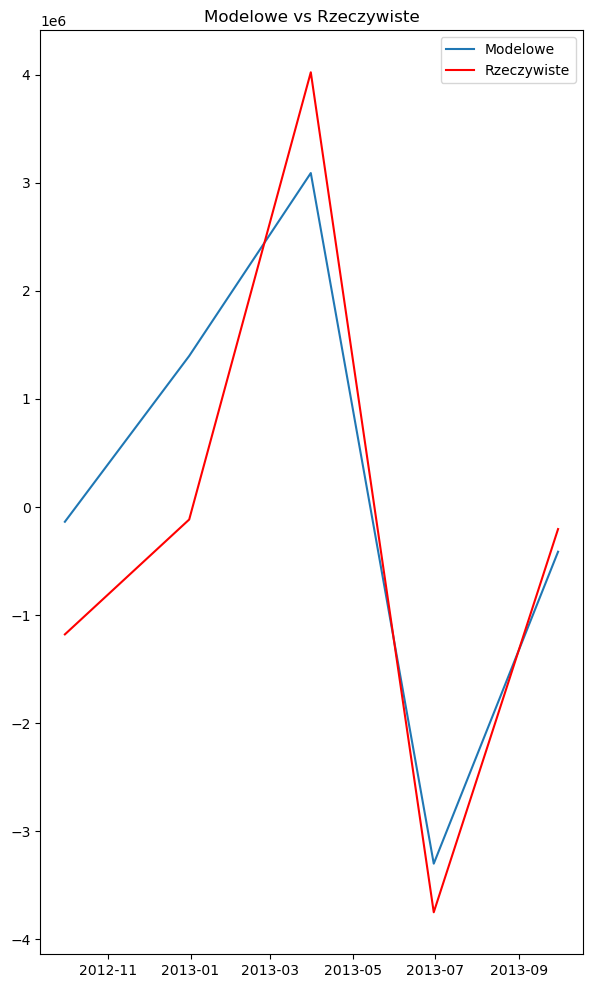

Błąd średniokwadratowy (MSE):  899319362881.3987
MAPE:  305.53 %
                                     SARIMAX Results                                      
Dep. Variable:       Zobowiązania krótkoterminowe   No. Observations:                   69
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood               -1176.288
Date:                            Sat, 18 May 2024   AIC                           2368.576
Time:                                    18:05:29   BIC                           2386.449
Sample:                                06-30-1995   HQIC                          2375.667
                                     - 06-30-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3721      0.573      0.649      

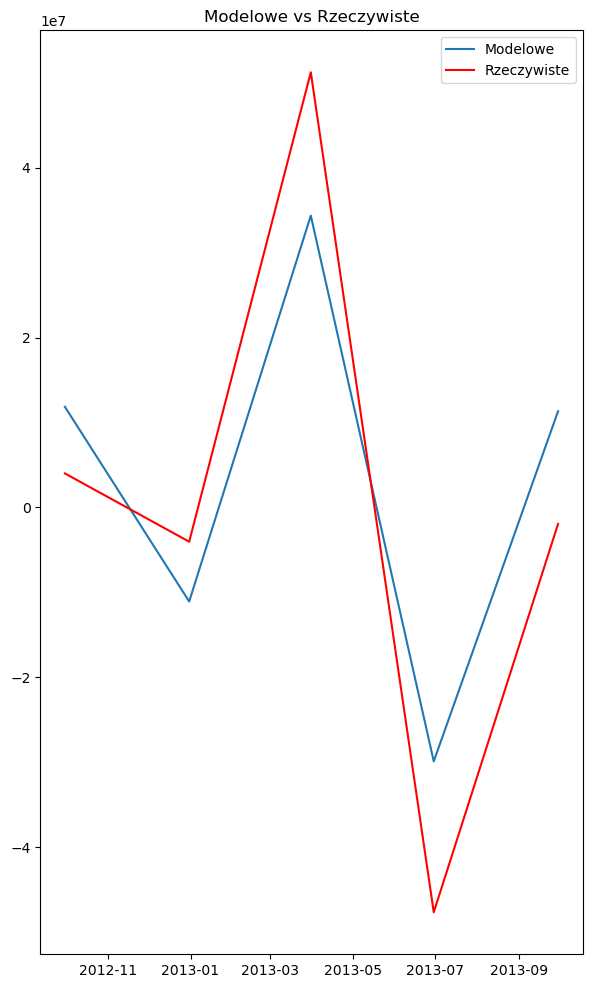

Błąd średniokwadratowy (MSE):  177441325667114.56
MAPE:  225.33 %
                                     SARIMAX Results                                      
Dep. Variable:           Pożyczki krótkoterminowe   No. Observations:                   69
Model:             SARIMAX(3, 0, 3)x(1, 0, [], 4)   Log Likelihood               -1069.454
Date:                            Sat, 18 May 2024   AIC                           2154.909
Time:                                    18:05:30   BIC                           2172.782
Sample:                                06-30-1995   HQIC                          2162.000
                                     - 06-30-2012                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7470      1.147     -0.651     

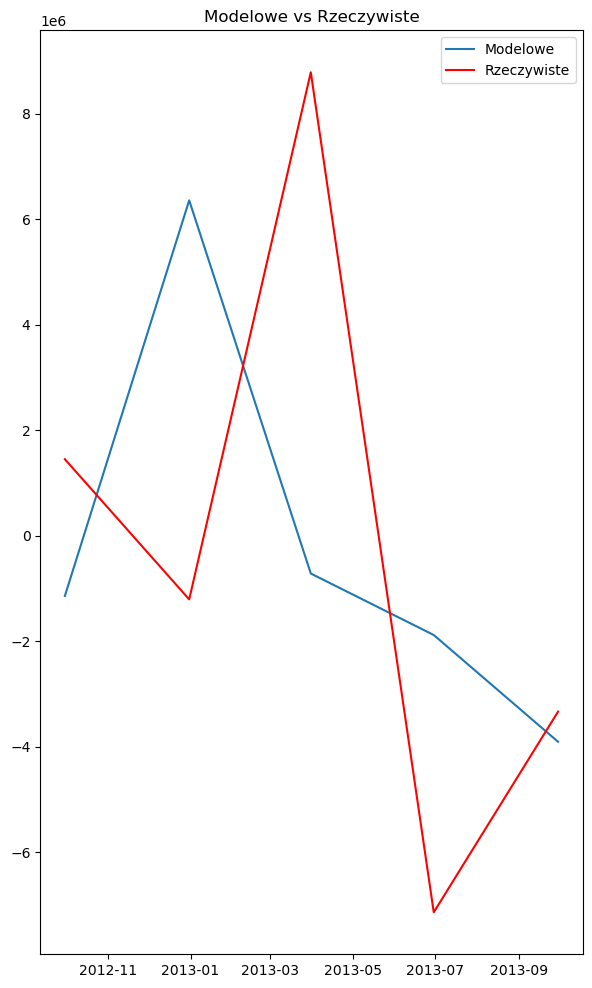

Błąd średniokwadratowy (MSE):  36409045712768.76
MAPE:  200.87 %


In [63]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import warnings
warnings.filterwarnings("ignore")

for i in list(train.columns):
    train_t = train[f"{i}"]
    model = SARIMAX(train_t, order=(3, 0, 3), seasonal_order=(1, 0, 0, 4))
    results = model.fit()
    
    # Wyświetlenie podsumowania modelu
    print(results.summary())
    
    forecast_results = results.forecast(steps=5)
    test_t = test[:5]
    
    fig = plt.figure(figsize=(7,12))
    plt.plot(forecast_results, label="Modelowe")
    plt.plot(test_t[f"{i}"], c='r', label="Rzeczywiste")
    plt.title("Modelowe vs Rzeczywiste")
    plt.legend()
    plt.show()
    
    from sklearn.metrics import mean_squared_error
    
    mse = mean_squared_error(test_t[f"{i}"], forecast_results)
    print("Błąd średniokwadratowy (MSE): ", mse)
    
    
    import numpy as np
    
    def mean_absolute_percentage_error(y_true, y_pred):
        """
        Oblicza średnią bezwzględną błędu procentowego (MAPE).
    
        Parametry:
        y_true : array-like
            Rzeczywiste wartości.
        y_pred : array-like
            Prognozowane wartości.
    
        Zwraca:
        mape : float
            Wartość MAPE.
        """
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    
    
    
    mape = mean_absolute_percentage_error(test_t[f"{i}"], forecast_results)
    print("MAPE: ", round(mape,2),"%")


Błąd średniokwadratowy (MSE):  23393340417015.195


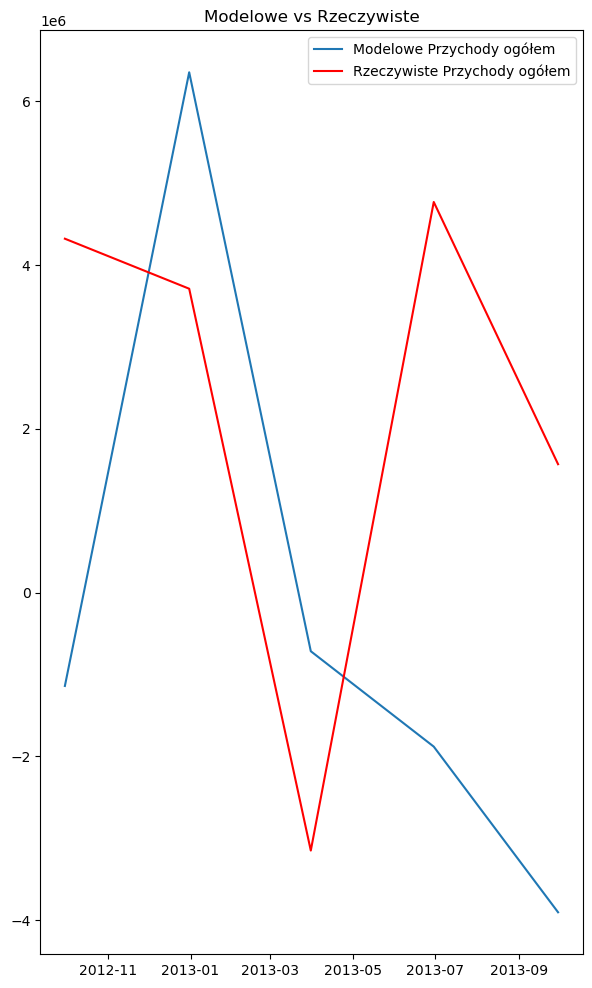

MAPE Przychody ogółem:  152.66 %


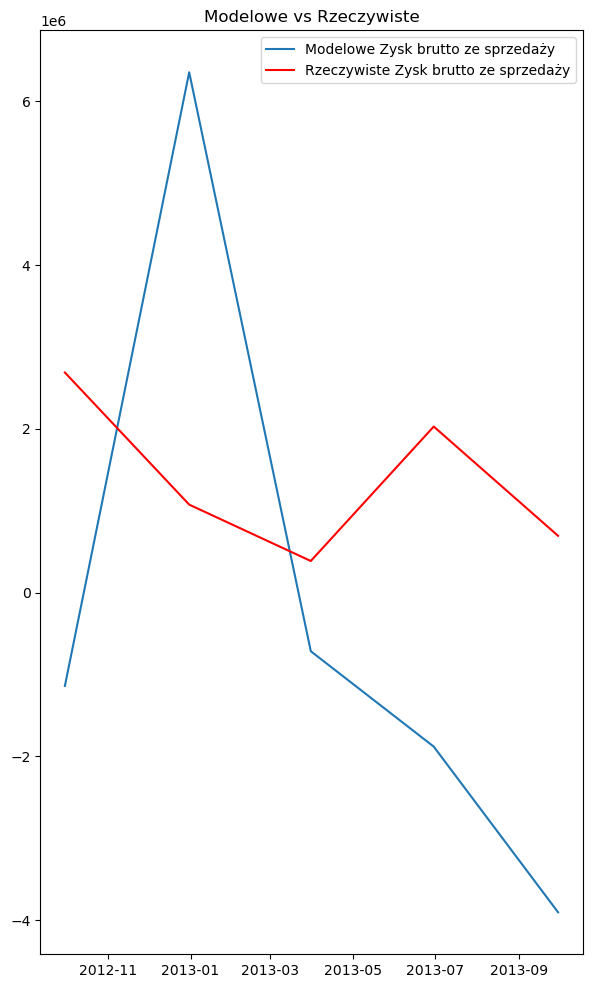

MAPE Zysk brutto ze sprzedaży:  355.03 %


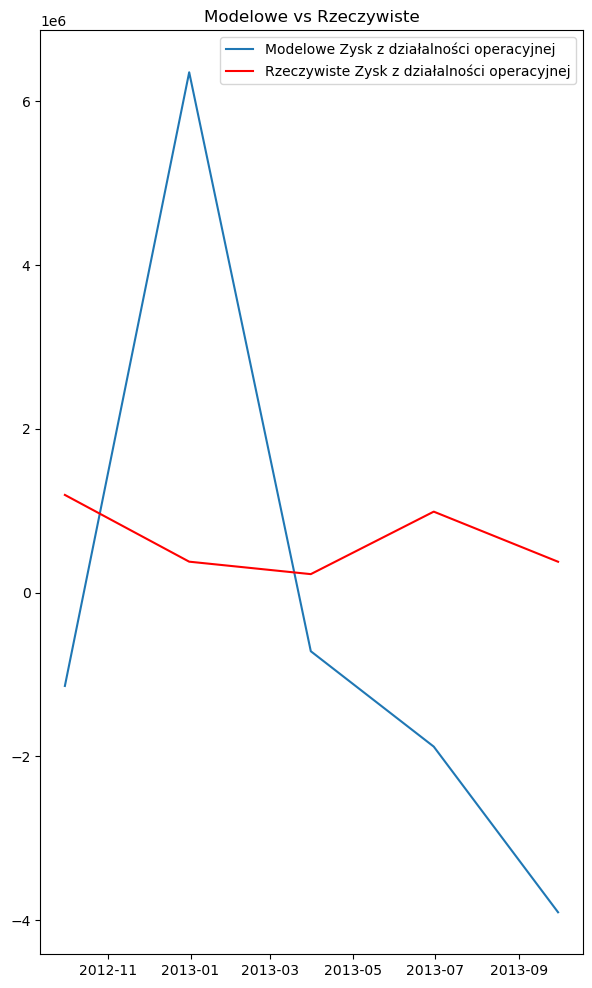

MAPE Zysk z działalności operacyjnej:  724.59 %


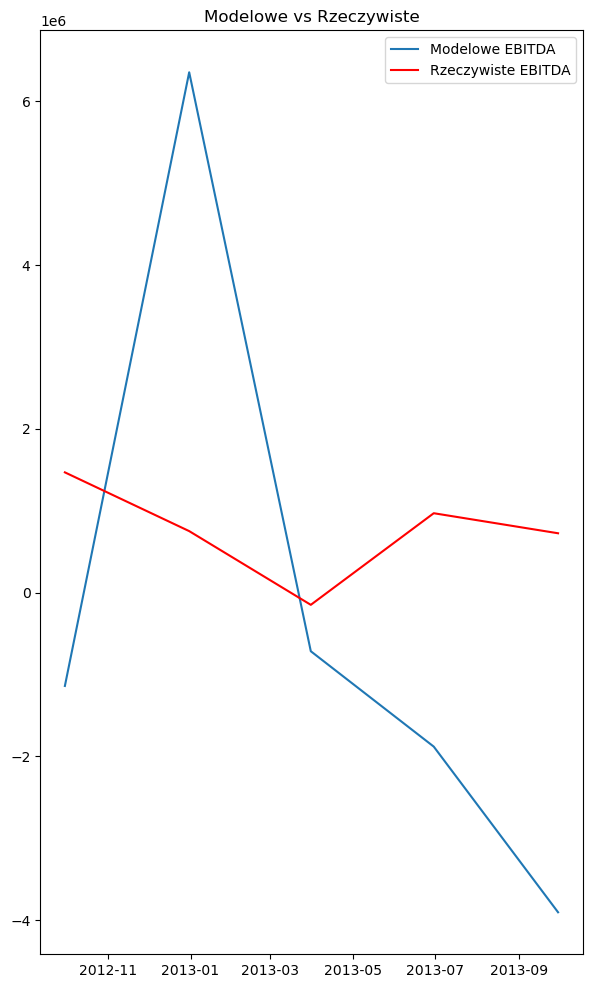

MAPE EBITDA:  447.18 %


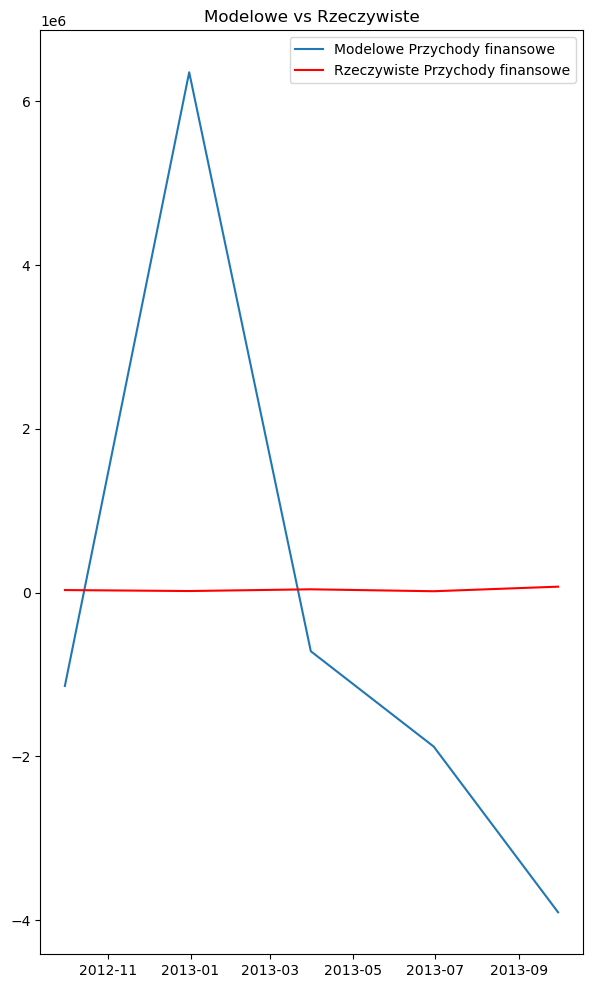

MAPE Przychody finansowe:  11207.16 %


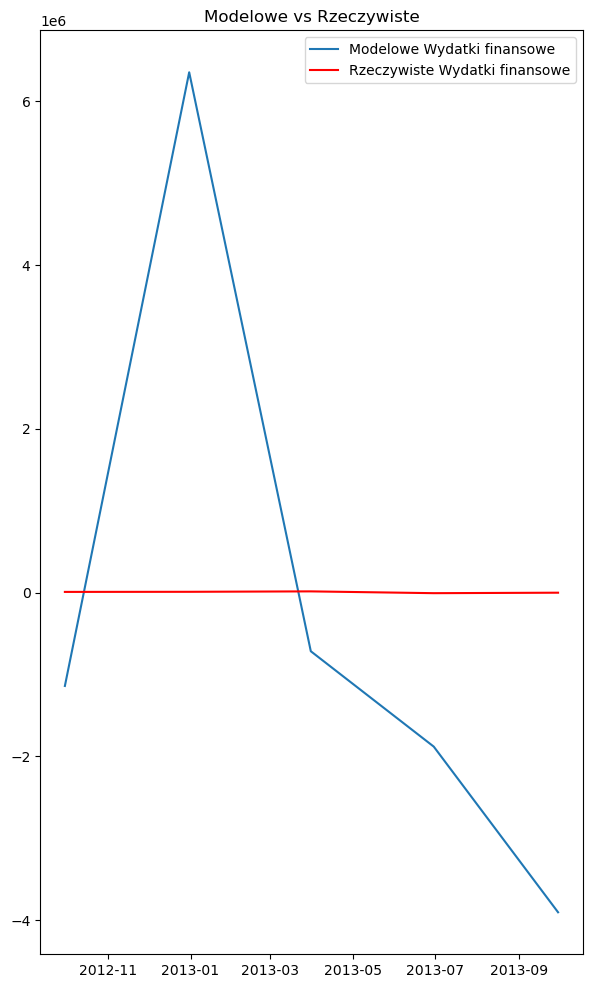

MAPE Wydatki finansowe:  80063.82 %


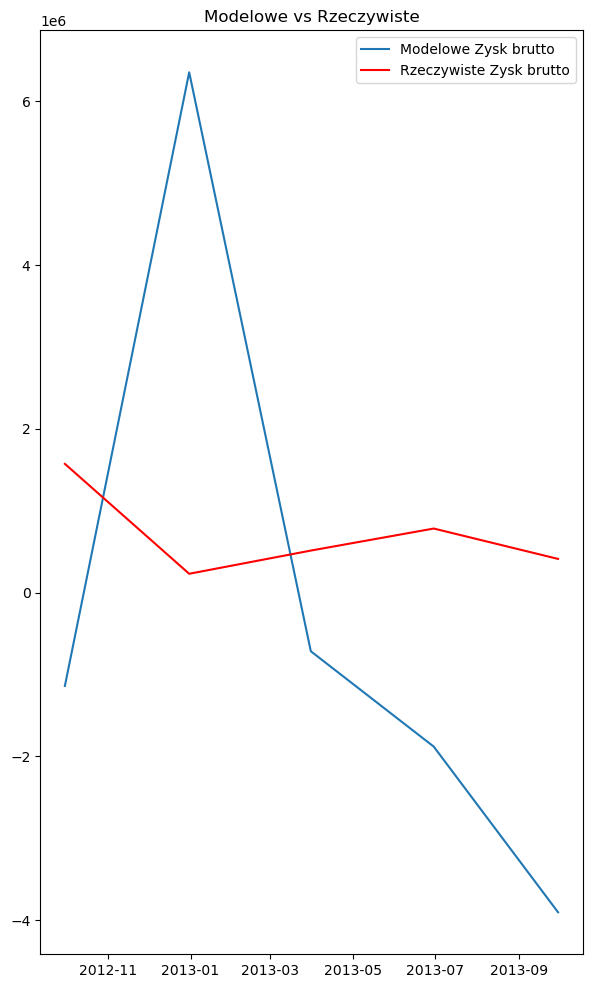

MAPE Zysk brutto:  893.19 %


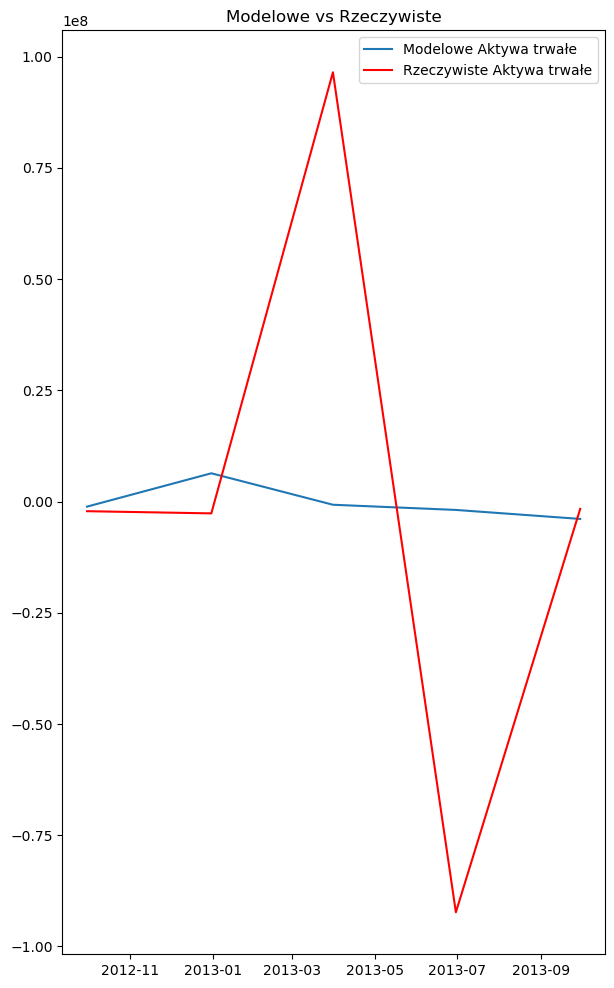

MAPE Aktywa trwałe:  144.37 %


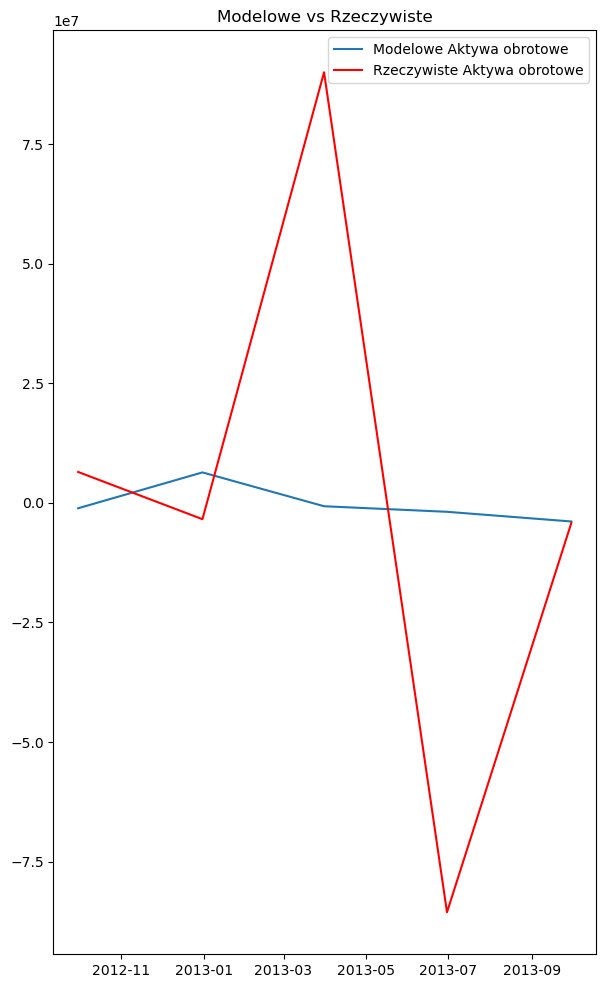

MAPE Aktywa obrotowe:  121.84 %


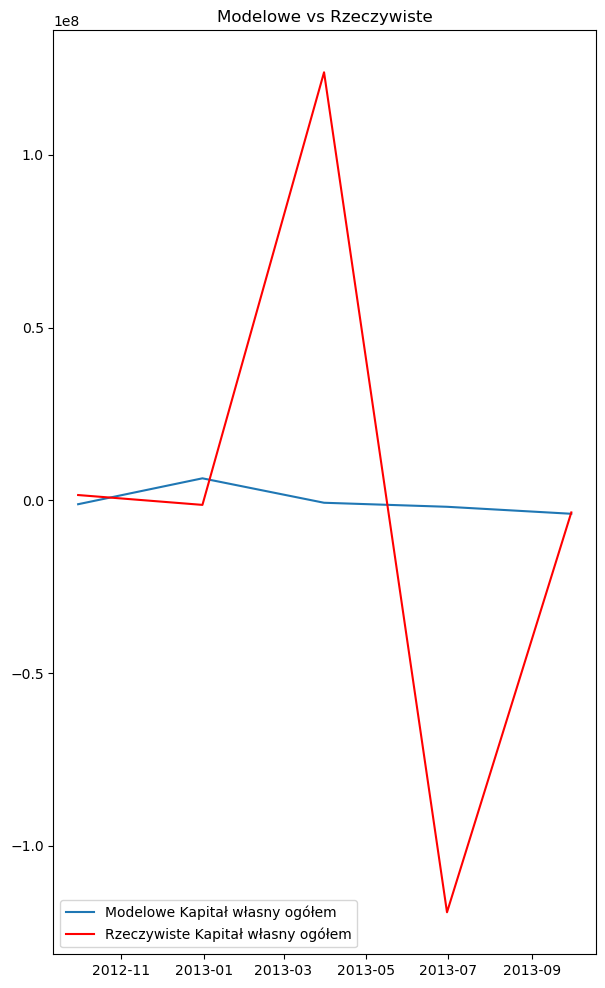

MAPE Kapitał własny ogółem:  192.38 %


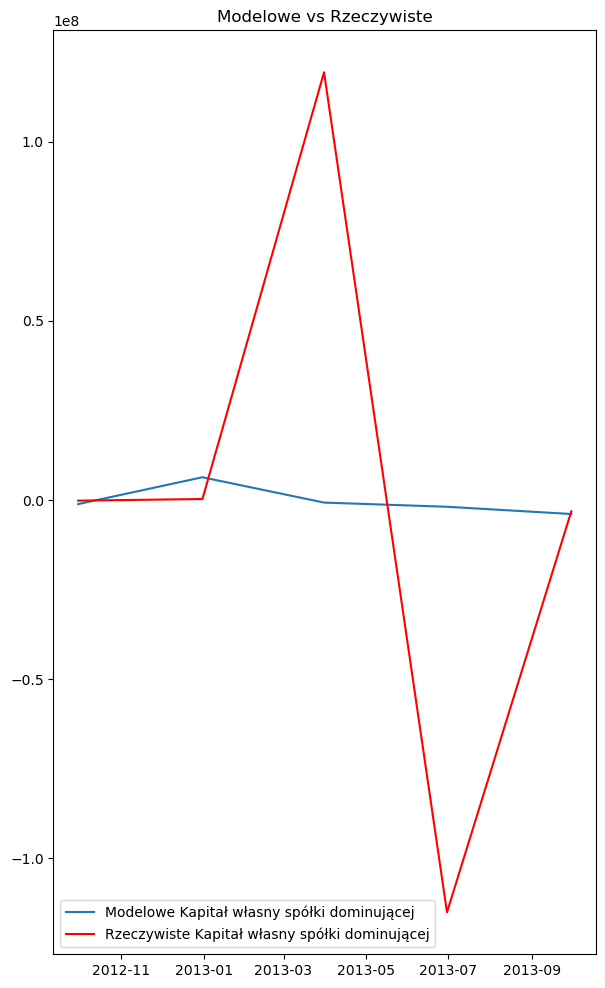

MAPE Kapitał własny spółki dominującej:  595.04 %


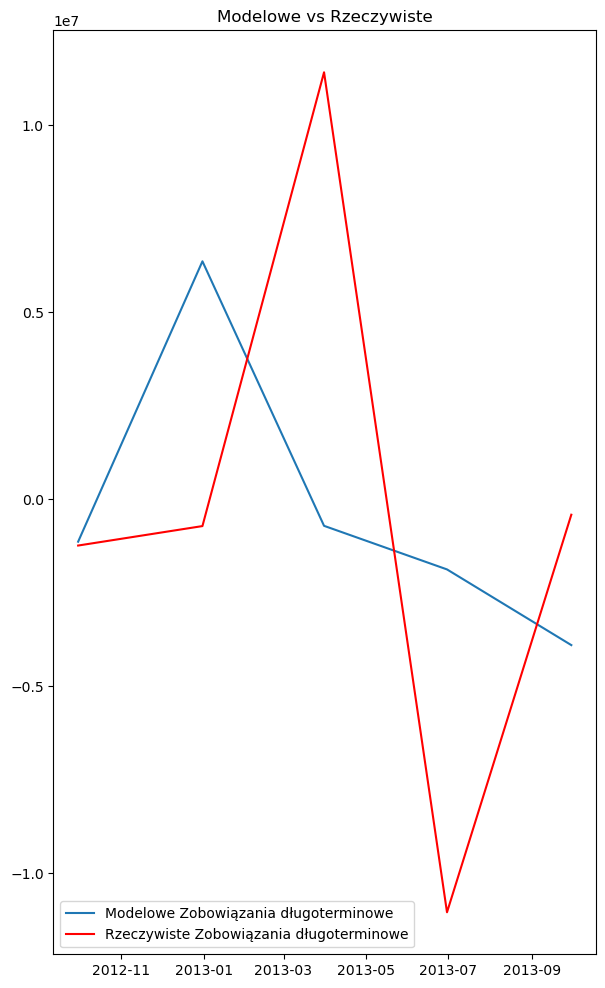

MAPE Zobowiązania długoterminowe:  401.66 %


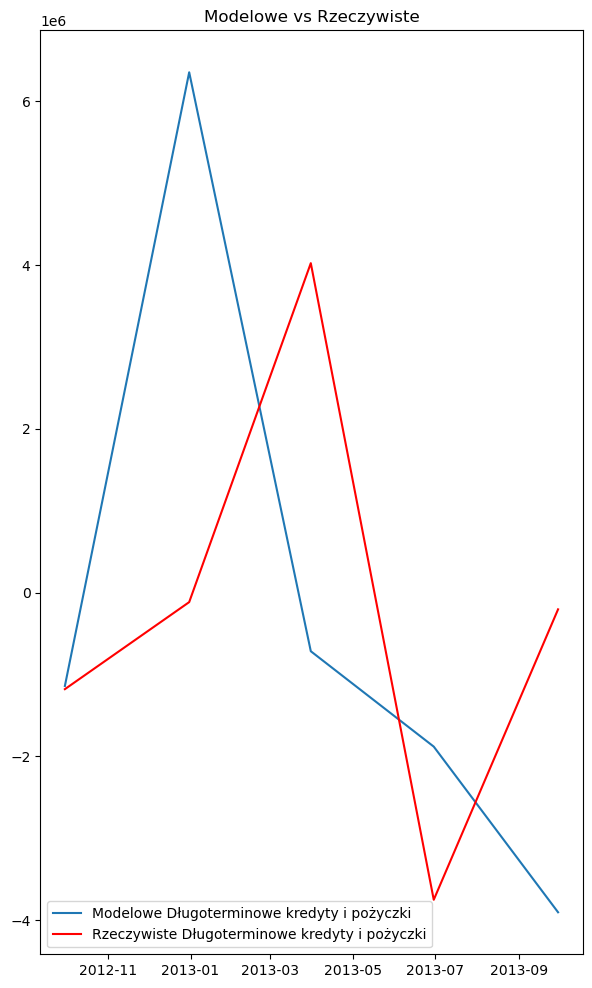

MAPE Długoterminowe kredyty i pożyczki:  1508.39 %


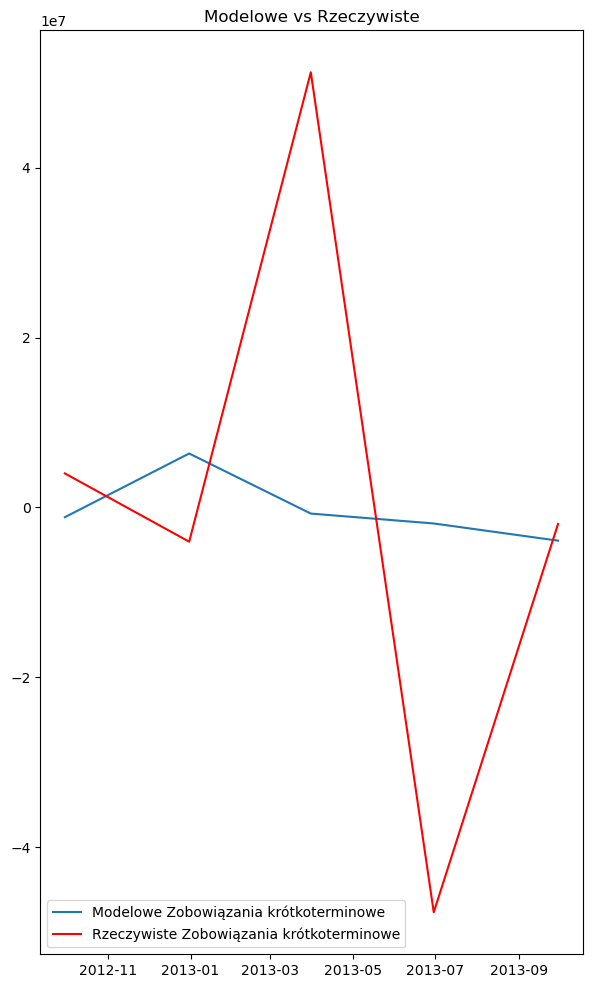

MAPE Zobowiązania krótkoterminowe:  137.13 %


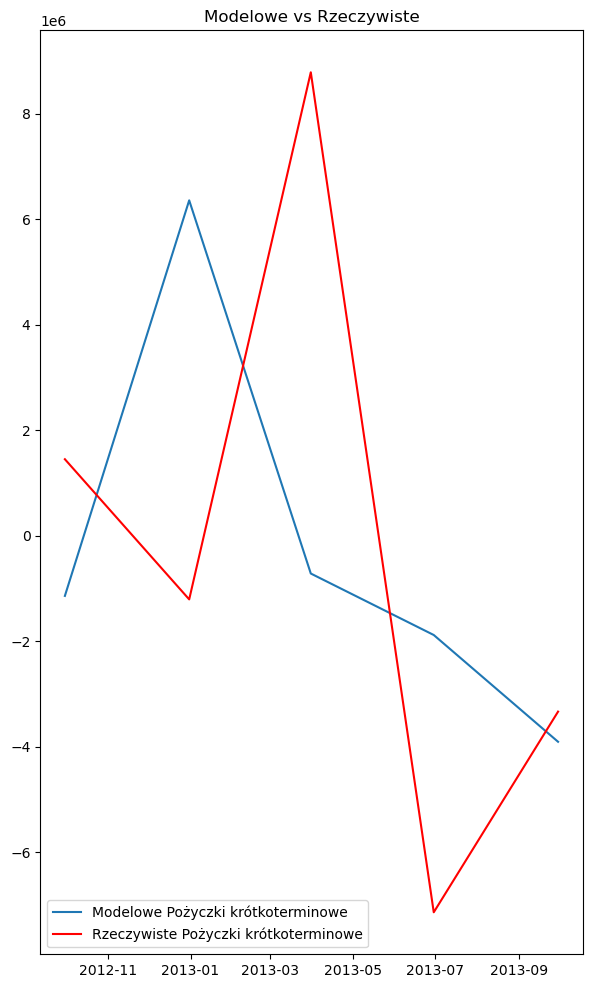

MAPE Pożyczki krótkoterminowe:  200.87 %


In [64]:
forecast_results = results.forecast(steps=5)
forecast_result = pd.DataFrame(forecast_results, index=test[:5].index)
test_t = test[:5]

from sklearn.metrics import mean_squared_error

mse = mean_squared_error(test_t["Przychody ogółem"], forecast_results)
print("Błąd średniokwadratowy (MSE): ", mse)


import numpy as np

def mean_absolute_percentage_error(y_true, y_pred):
    """
    Oblicza średnią bezwzględną błędu procentowego (MAPE).

    Parametry:
    y_true : array-like
        Rzeczywiste wartości.
    y_pred : array-like
        Prognozowane wartości.

    Zwraca:
    mape : float
        Wartość MAPE.
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100






for i in list(test.columns):
    
    fig = plt.figure(figsize=(7,12))
    plt.plot(forecast_result, label=f"Modelowe {i}")
    plt.plot(test_t[f"{i}"], c='r', label=f"Rzeczywiste {i}")
    plt.title("Modelowe vs Rzeczywiste")
    plt.legend()
    plt.show()
    mape = mean_absolute_percentage_error(test_t[f"{i}"], forecast_results)
    print(f"MAPE {i}: ", round(mape,2),"%")

In [65]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score
import numpy as np

# Assuming random_forest_mol contains your data

def RandomForest(i):
    # Extracting labels
    labels = np.array(random_forest_mol[f"{i}"])
    
    # Extracting features
    features = random_forest_mol.drop(f"{i}", axis=1)
    features_np = np.array(features)
    
    # Splitting data into training and testing sets
    train_l = labels[:60]
    test_l = labels[61:]
    
    train_f = features_np[:60]
    test_f = features_np[61:]
    
    # List of feature names
    f_list = list(features.columns)
    
    # Initialize RandomForestRegressor
    rf = RandomForestRegressor(n_estimators=1000, random_state=42)
    
    # Perform cross-validation
    scores = cross_val_score(rf, train_f, train_l, cv=5)
    
    # Fit the model
    rf.fit(train_f, train_l)
    
    # Print average accuracy obtained from cross-validation
    print("----------------------------------------")
    print(f'Random Forest for {i}')
    print("Cross-validation scores:", scores)
    print("Mean accuracy:", scores.mean())
    print("Standard deviation of accuracy:", scores.std())


vars = list(mol_diff.columns)

for i in vars:
    RandomForest(i)

----------------------------------------
Random Forest for Przychody ogółem
Cross-validation scores: [0.91998031 0.9741946  0.94804748 0.99351733 0.88432463]
Mean accuracy: 0.9440128690538538
Standard deviation of accuracy: 0.038776685681968626
----------------------------------------
Random Forest for Zysk brutto ze sprzedaży
Cross-validation scores: [0.96715786 0.99645325 0.9723985  0.95470019 0.9469689 ]
Mean accuracy: 0.9675357380122254
Standard deviation of accuracy: 0.017016214571540348
----------------------------------------
Random Forest for Zysk z działalności operacyjnej
Cross-validation scores: [0.82934139 0.97146683 0.97434762 0.85904578 0.66072979]
Mean accuracy: 0.8589862799790131
Standard deviation of accuracy: 0.11501701822985859
----------------------------------------
Random Forest for EBITDA
Cross-validation scores: [0.50305672 0.8649513  0.76968471 0.81083472 0.75881995]
Mean accuracy: 0.741469481277837
Standard deviation of accuracy: 0.12489762234498723
----------

MAPE Przychody ogółem:  59.63 %


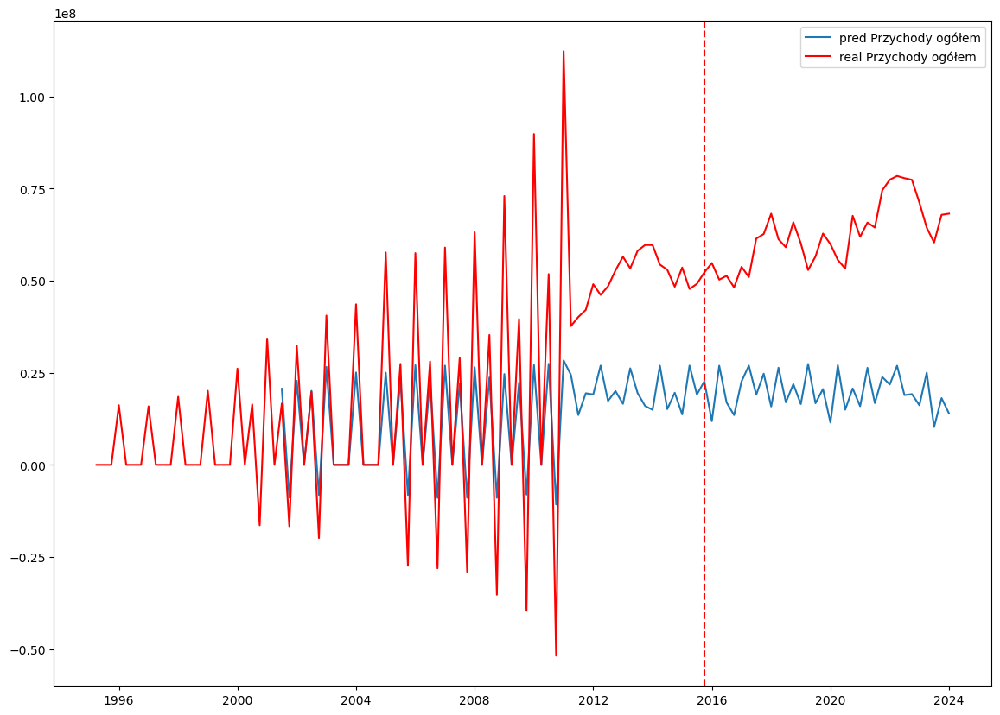

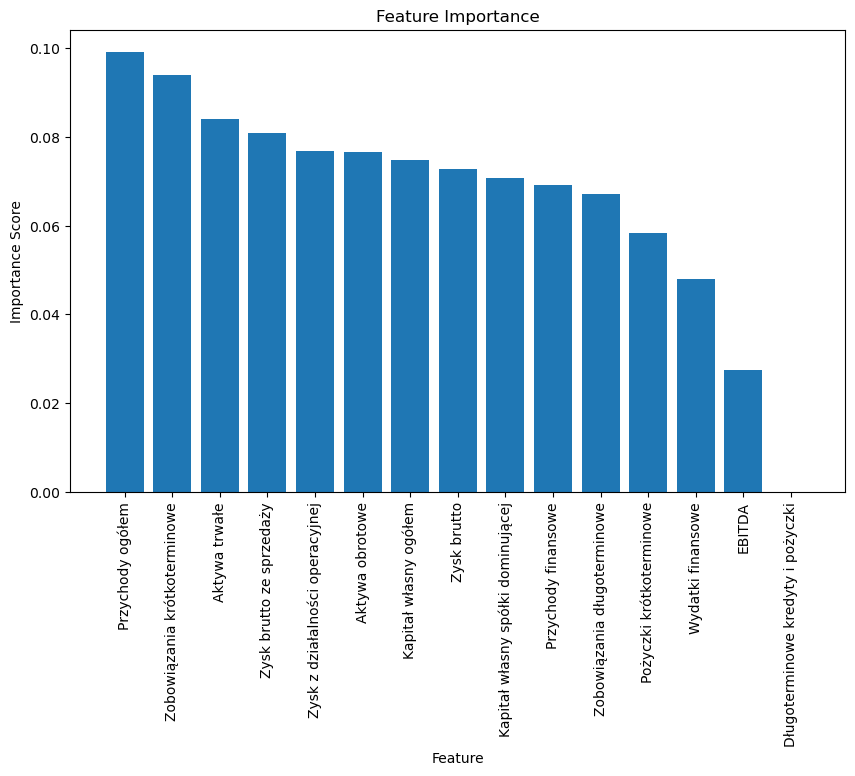

MAPE Zysk brutto ze sprzedaży:  67.62 %


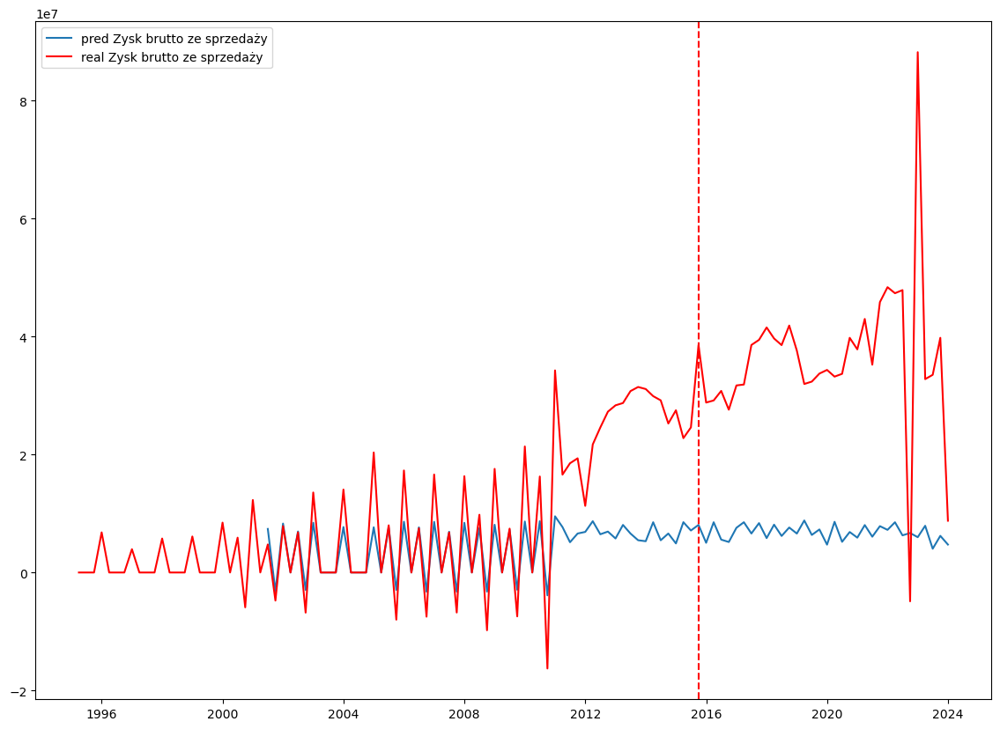

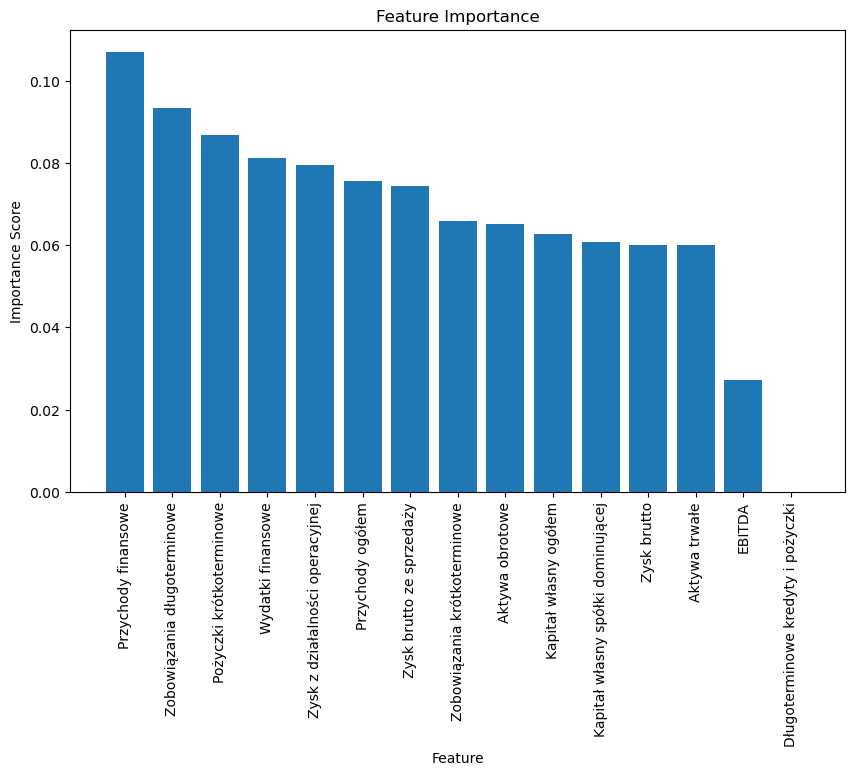

MAPE Zysk z działalności operacyjnej:  52.1 %


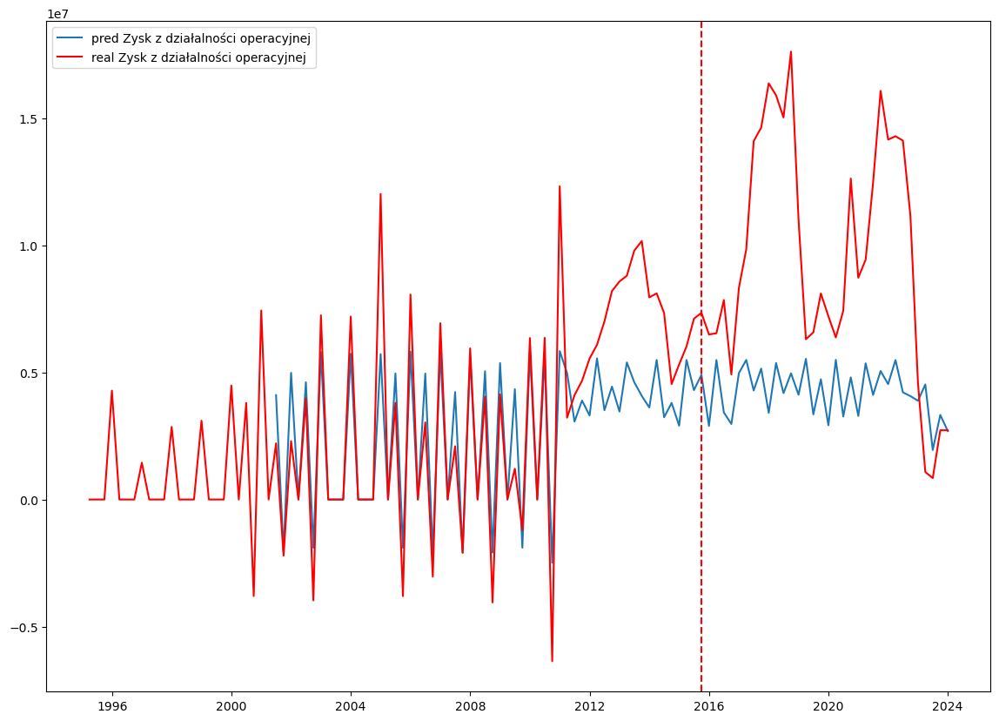

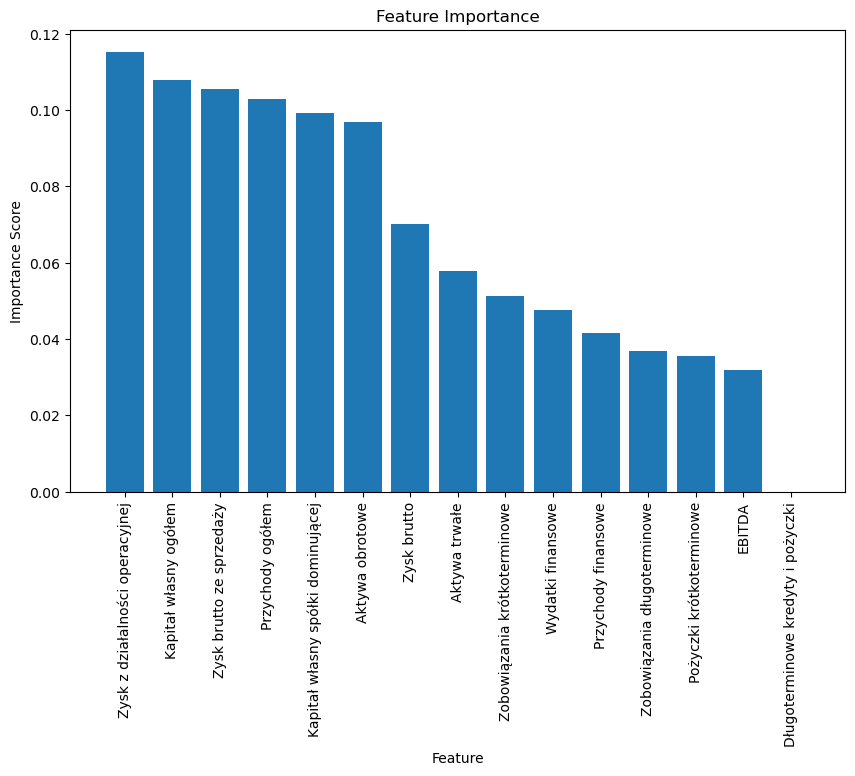

MAPE EBITDA:  65.84 %


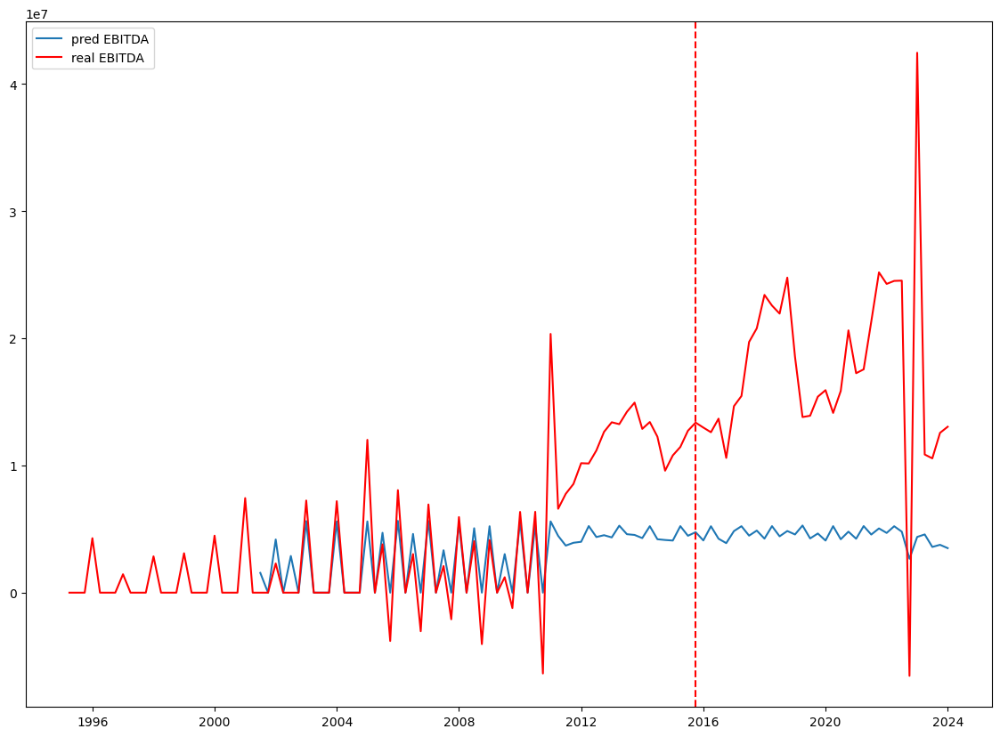

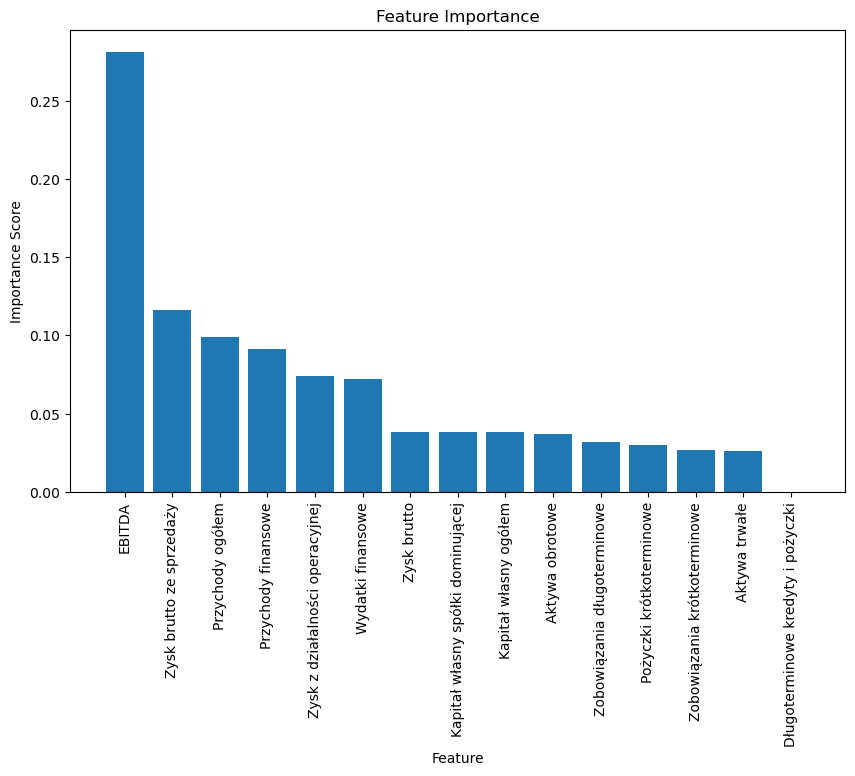

MAPE Przychody finansowe:  44.33 %


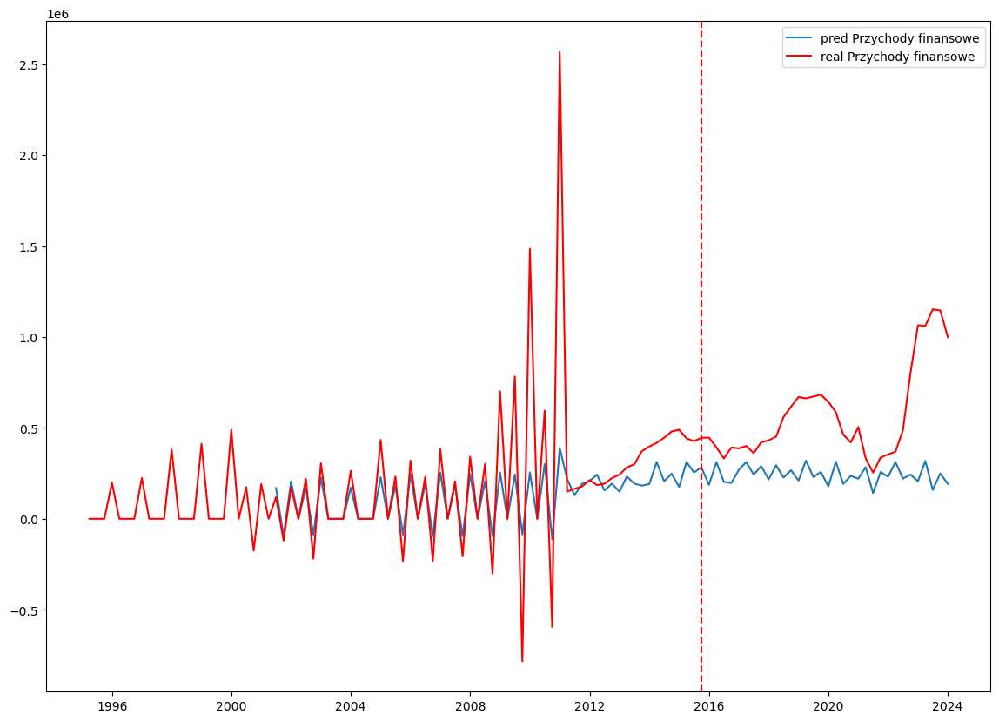

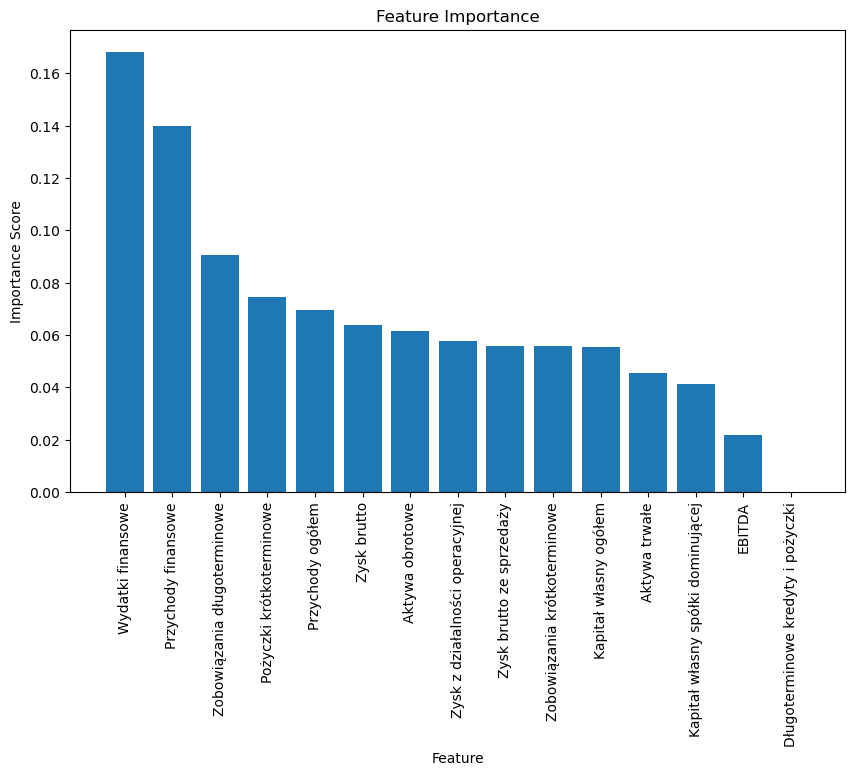

MAPE Wydatki finansowe:  333.95 %


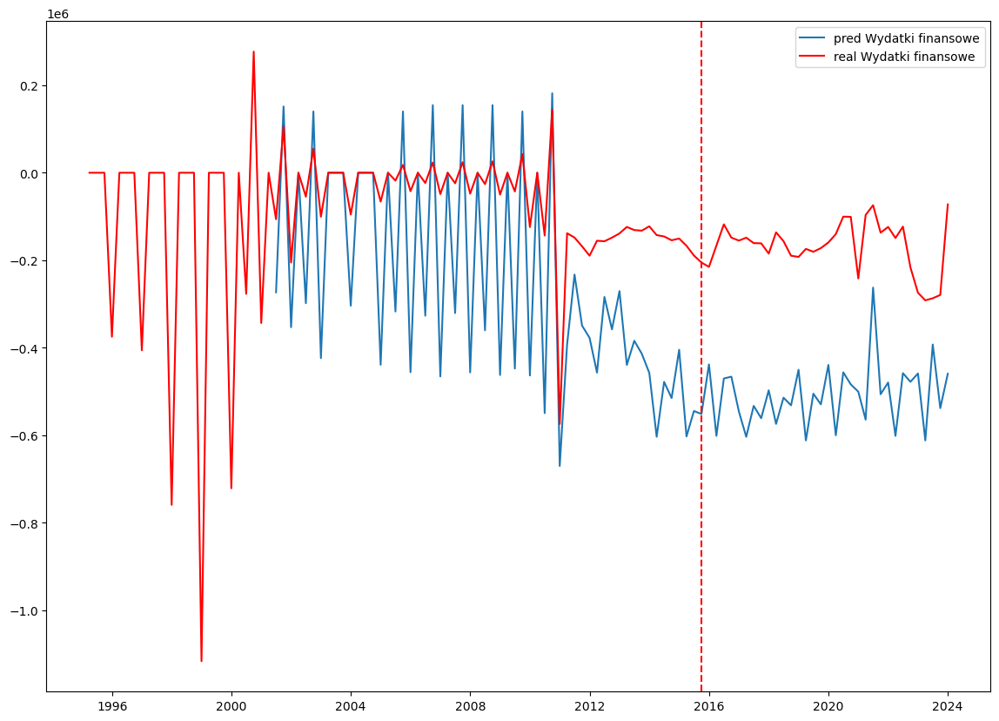

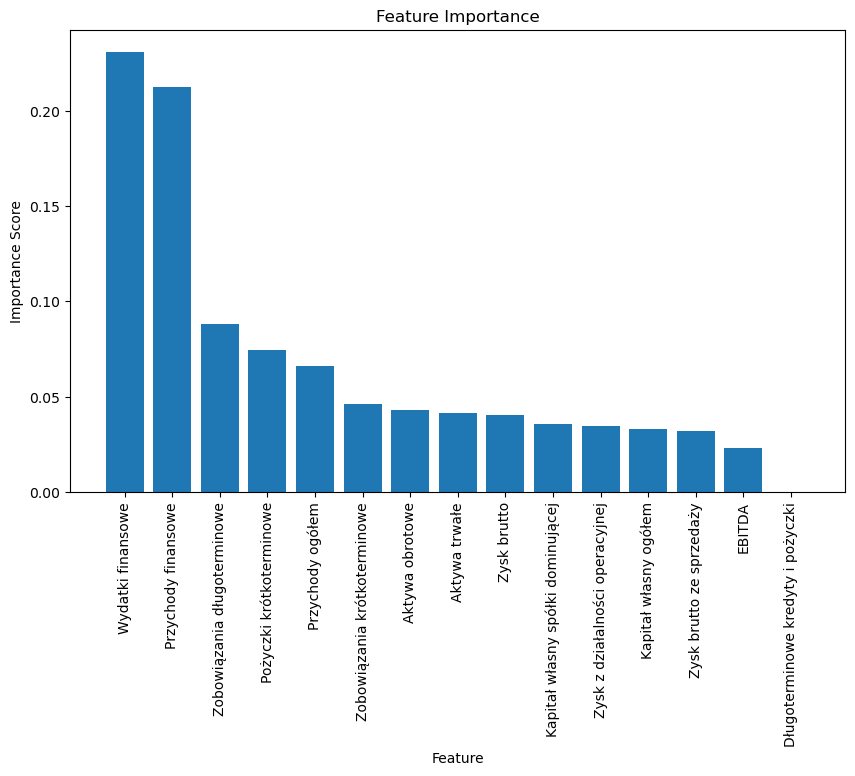

MAPE Zysk brutto:  41.28 %


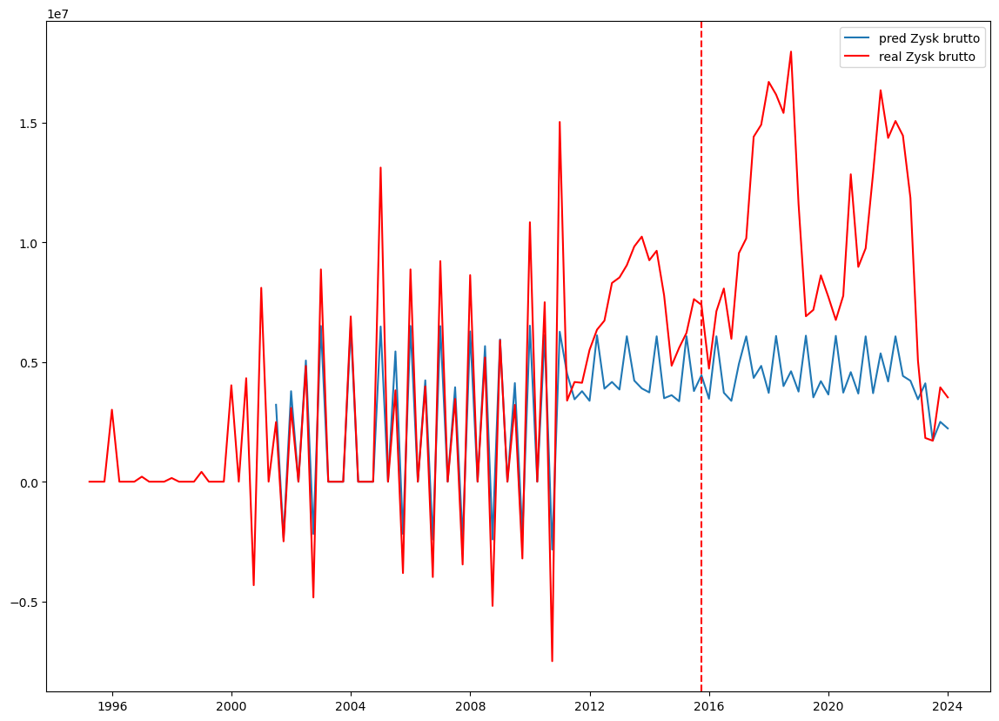

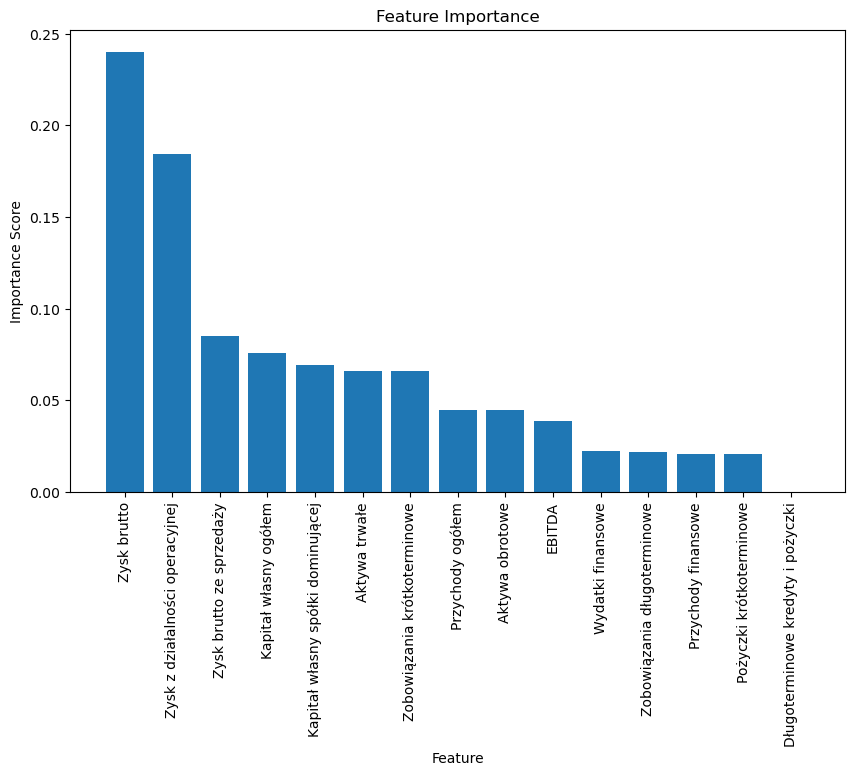

MAPE Aktywa trwałe:  1378.89 %


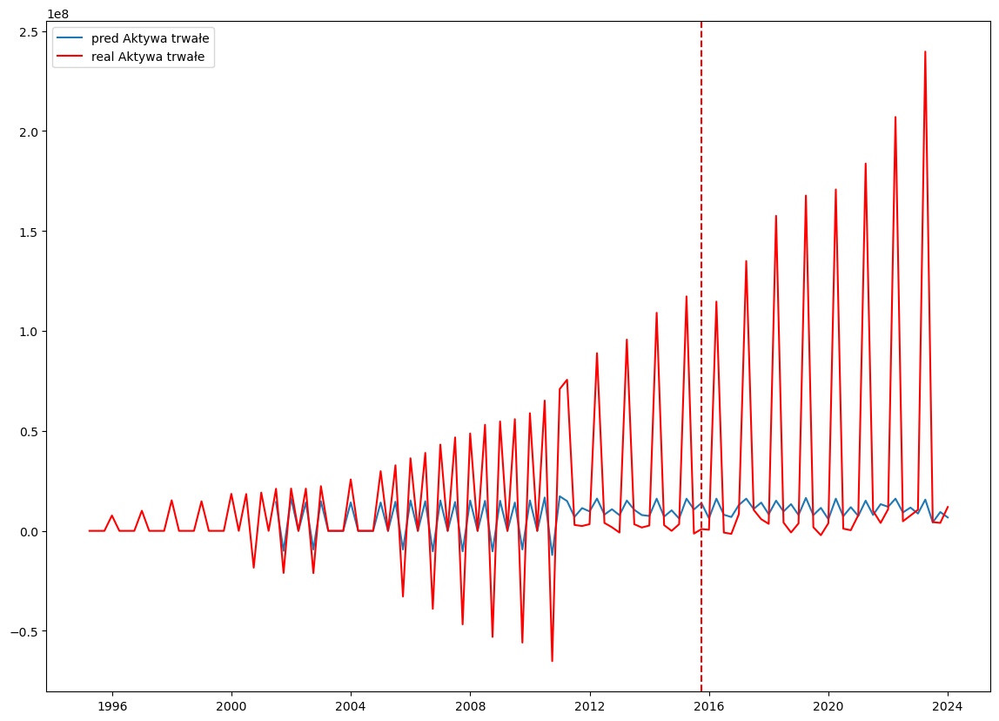

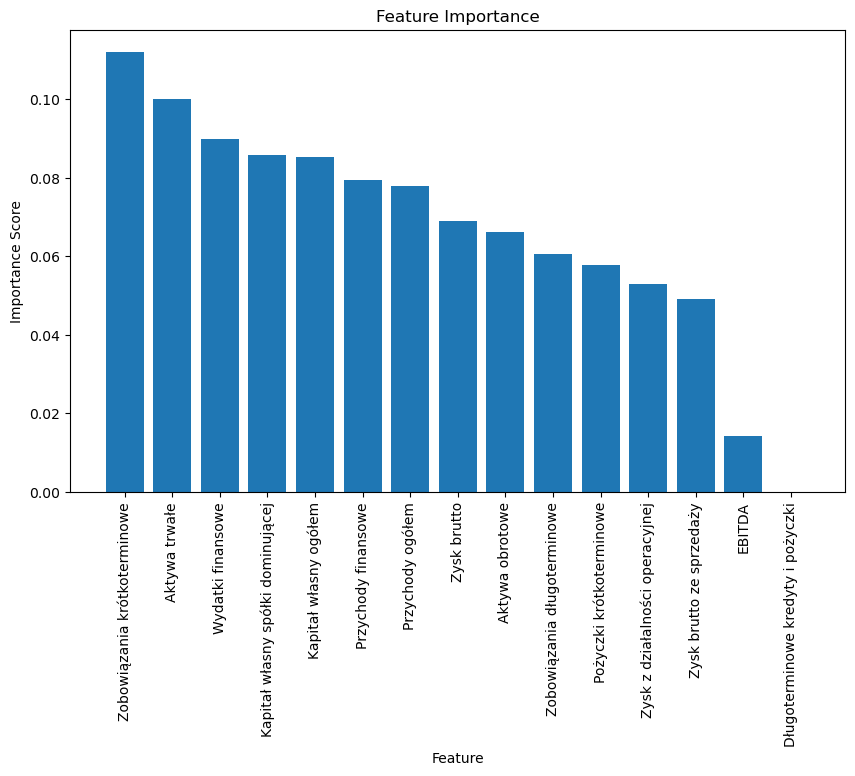

MAPE Aktywa obrotowe:  100.45 %


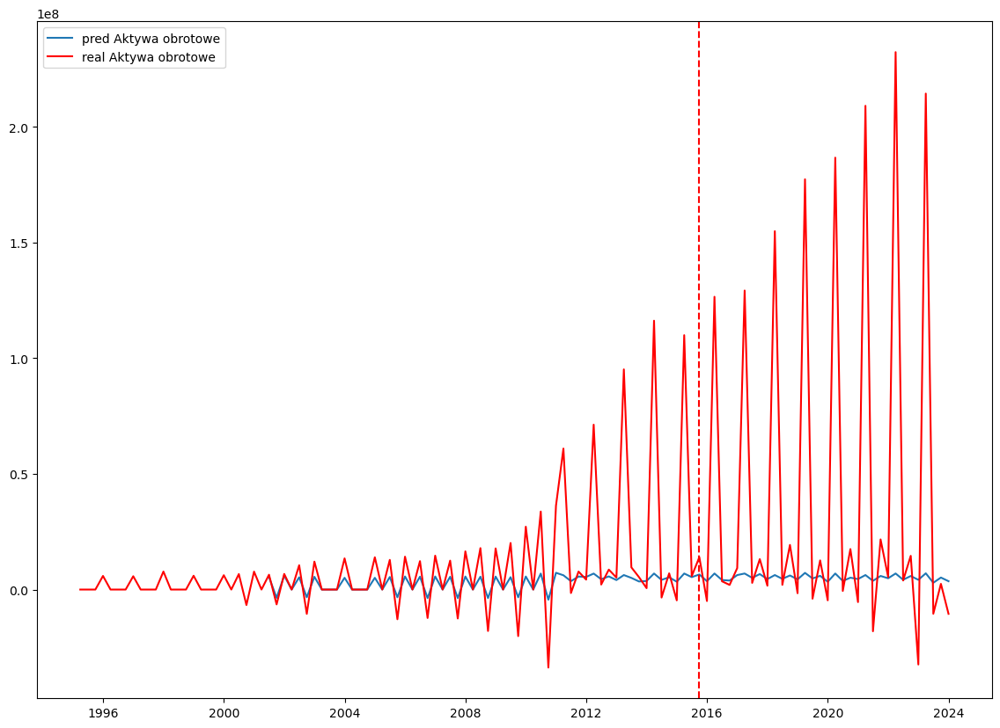

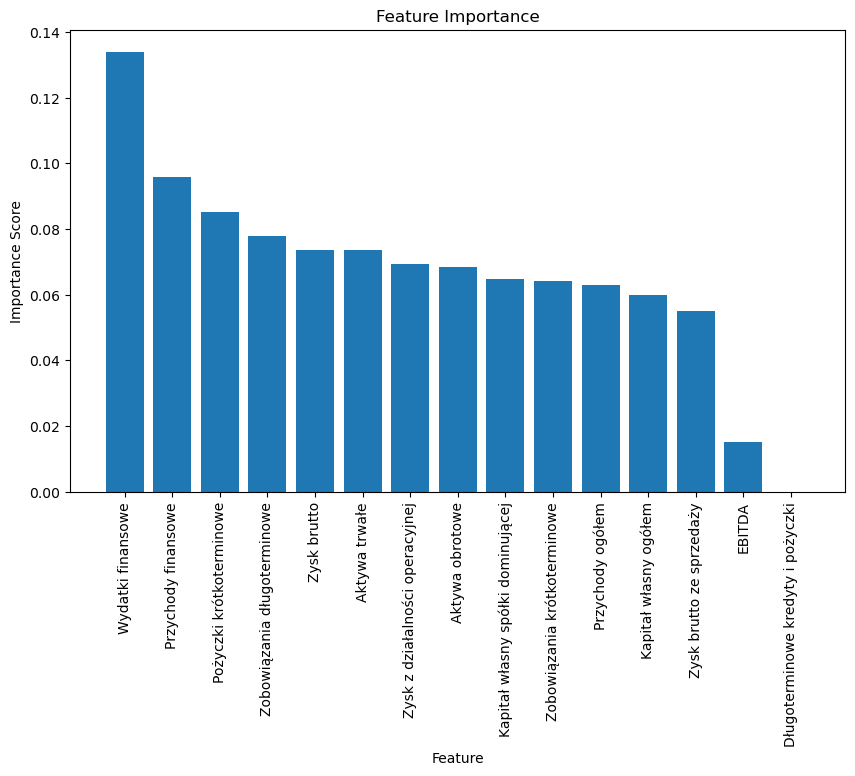

MAPE Kapitał własny ogółem:  128.73 %


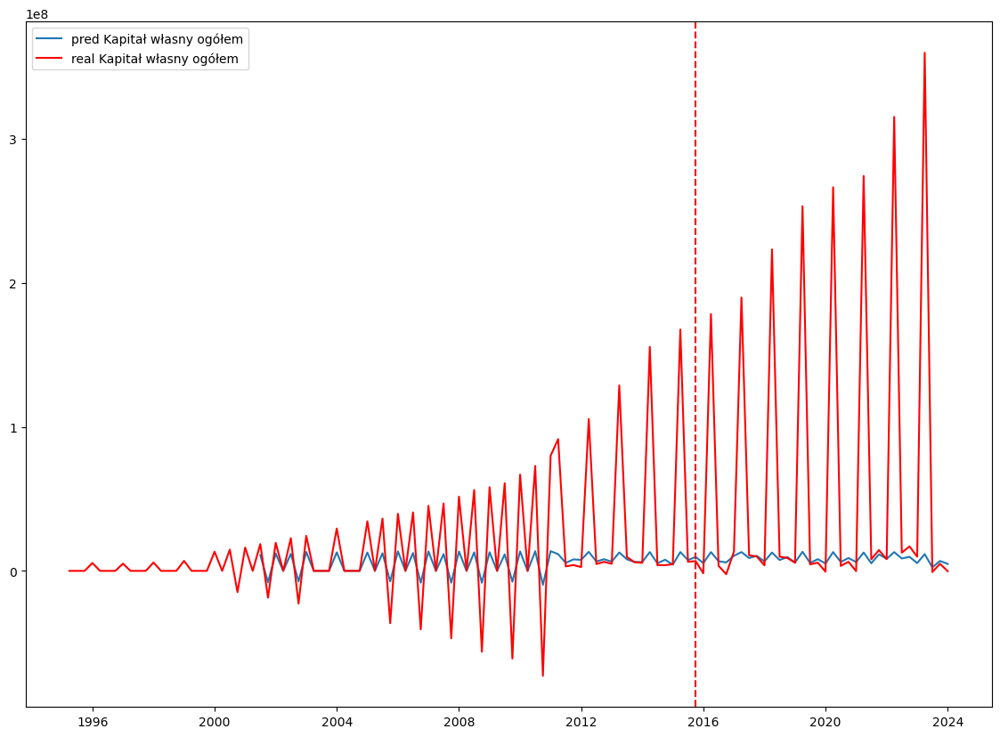

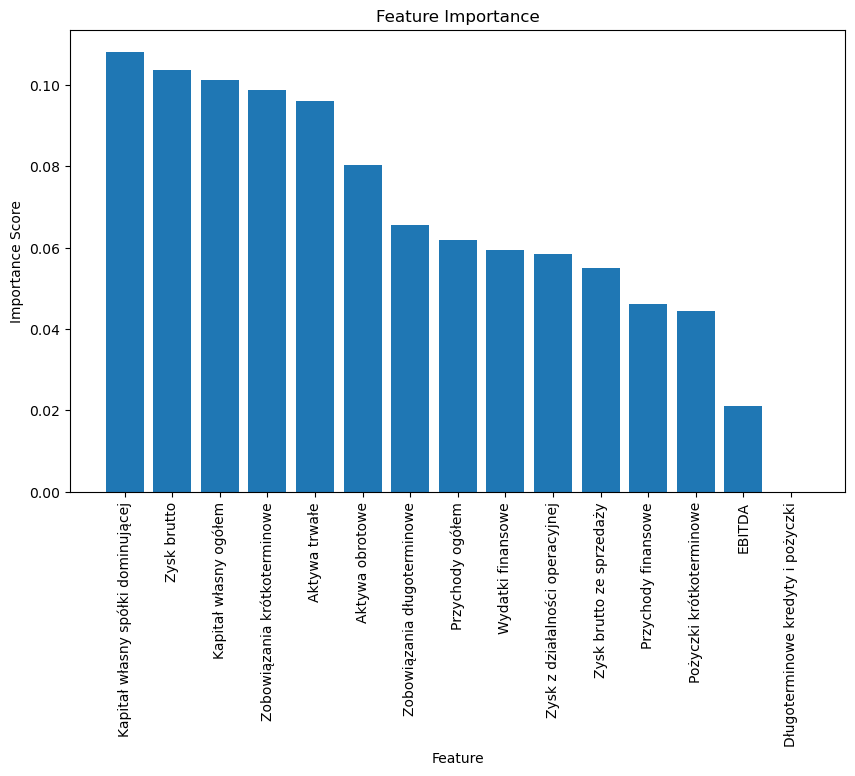

MAPE Kapitał własny spółki dominującej:  118.4 %


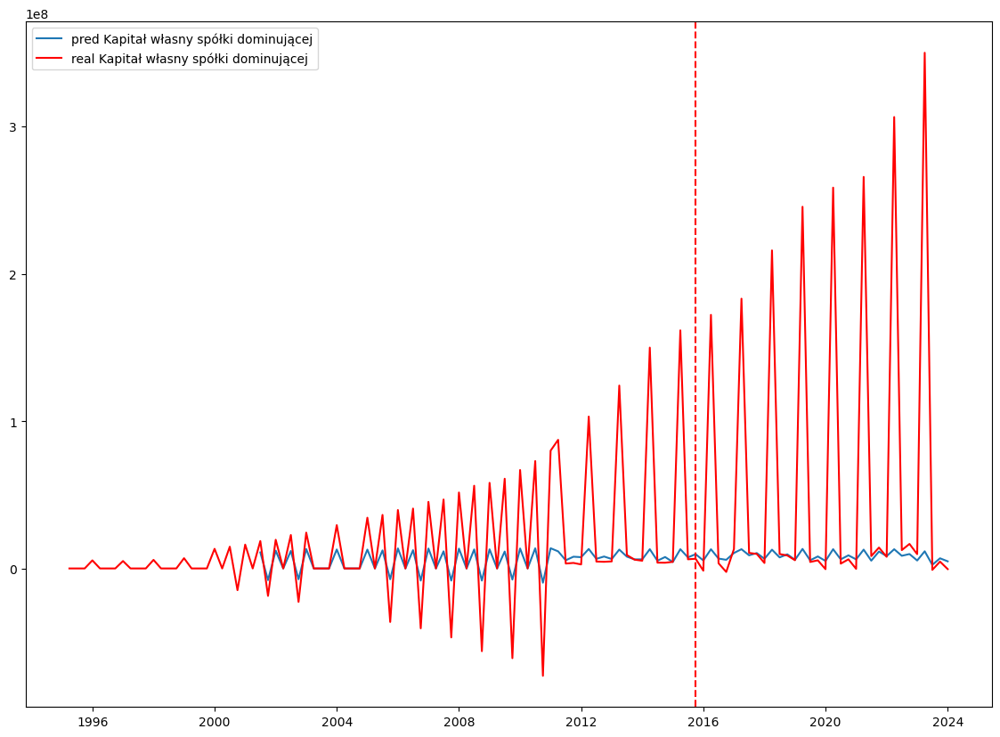

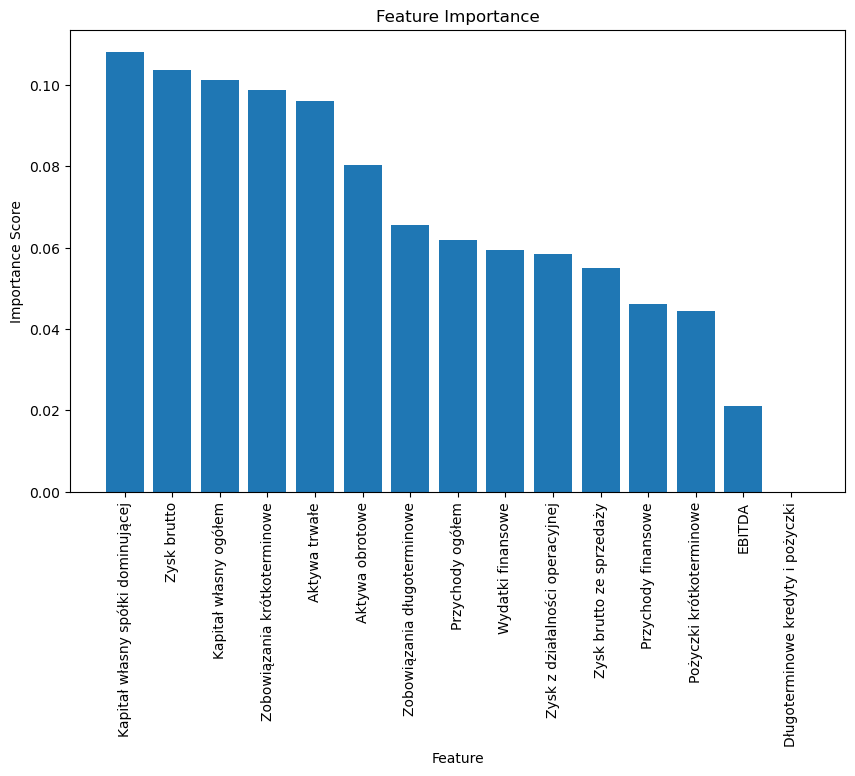

MAPE Zobowiązania długoterminowe:  1570.38 %


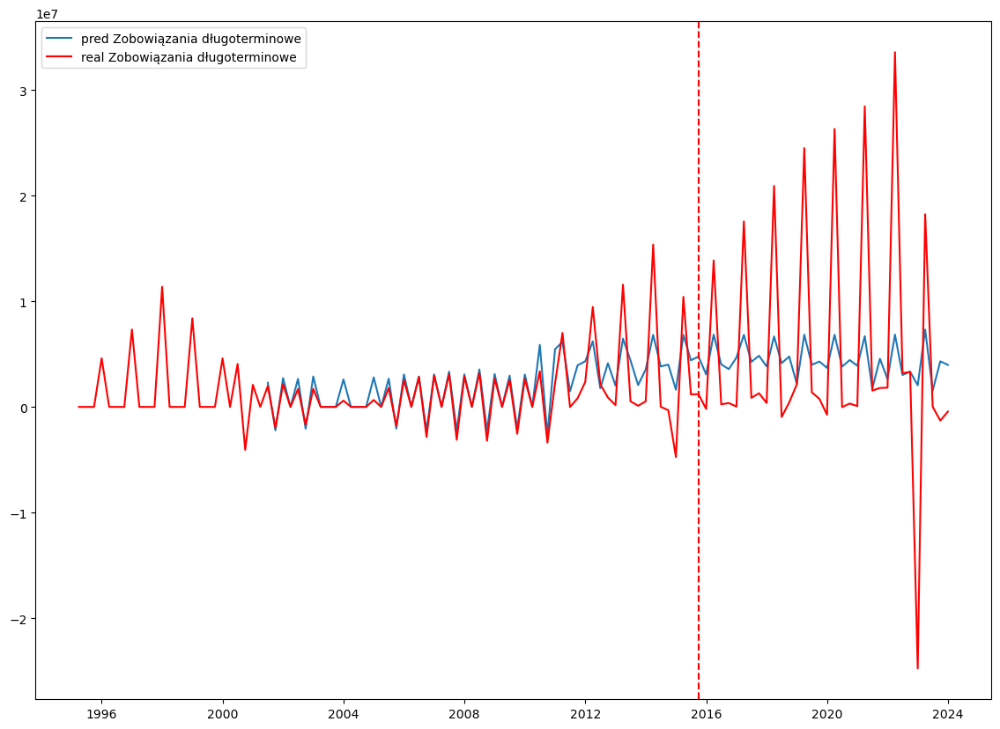

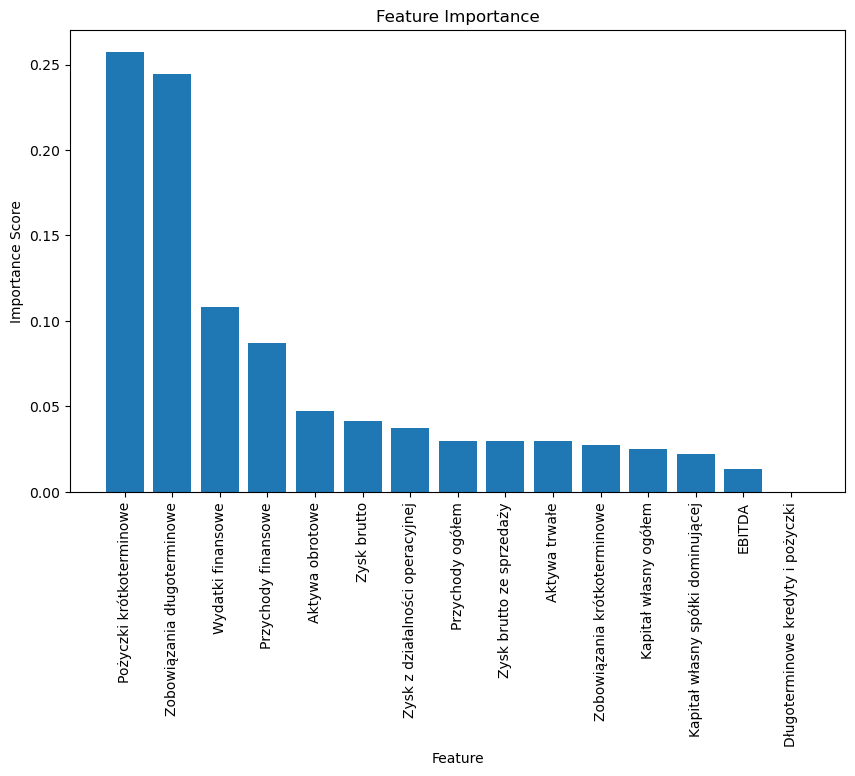

MAPE Długoterminowe kredyty i pożyczki:  100.0 %


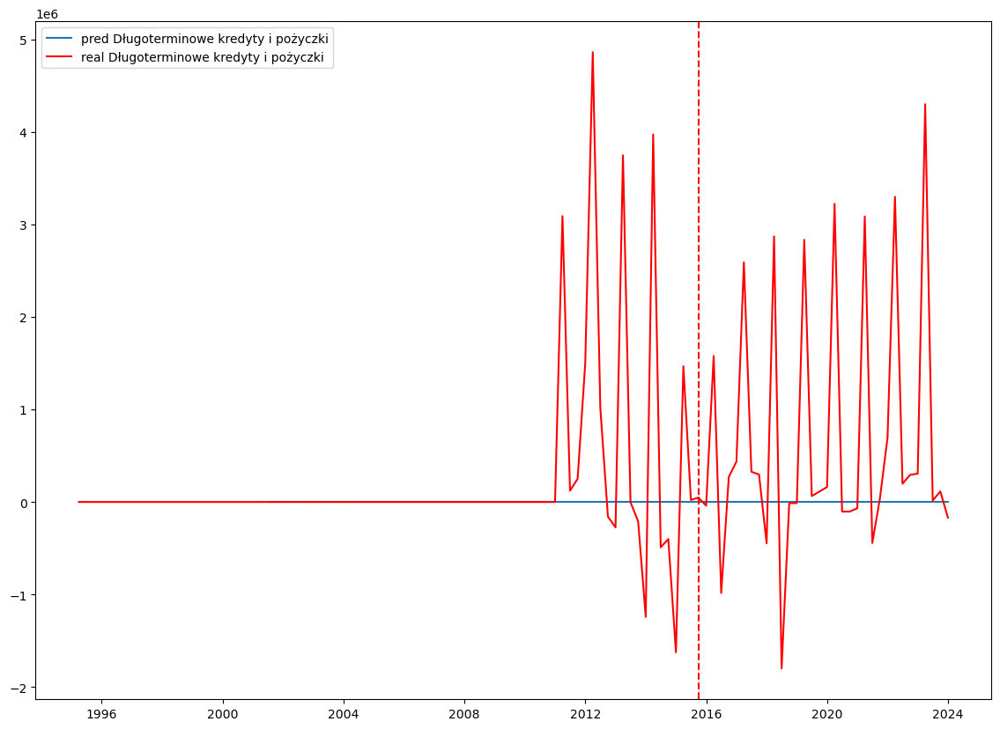

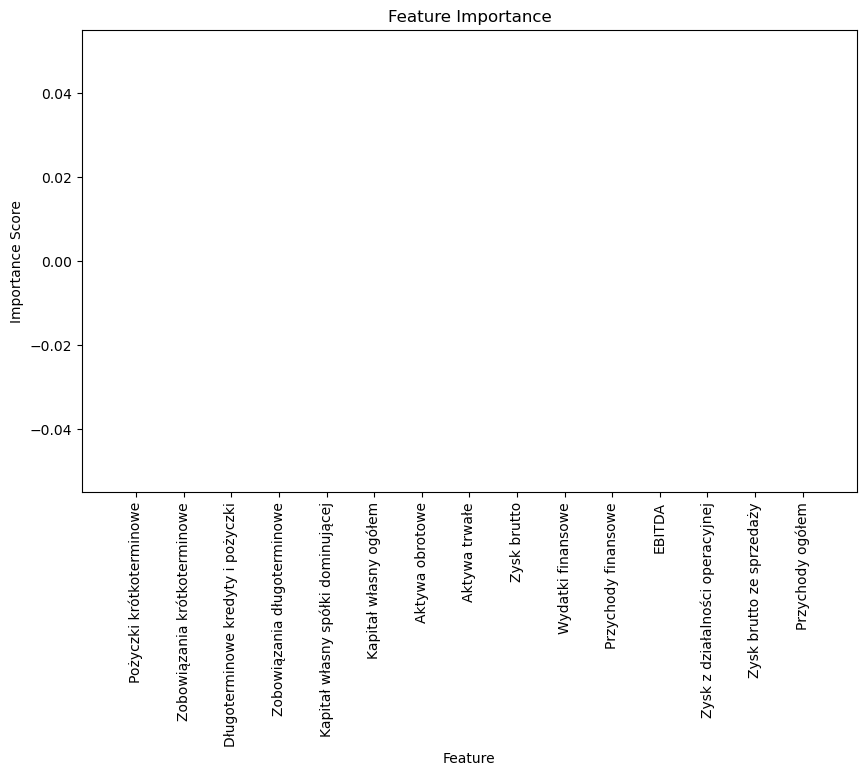

MAPE Zobowiązania krótkoterminowe:  112.26 %


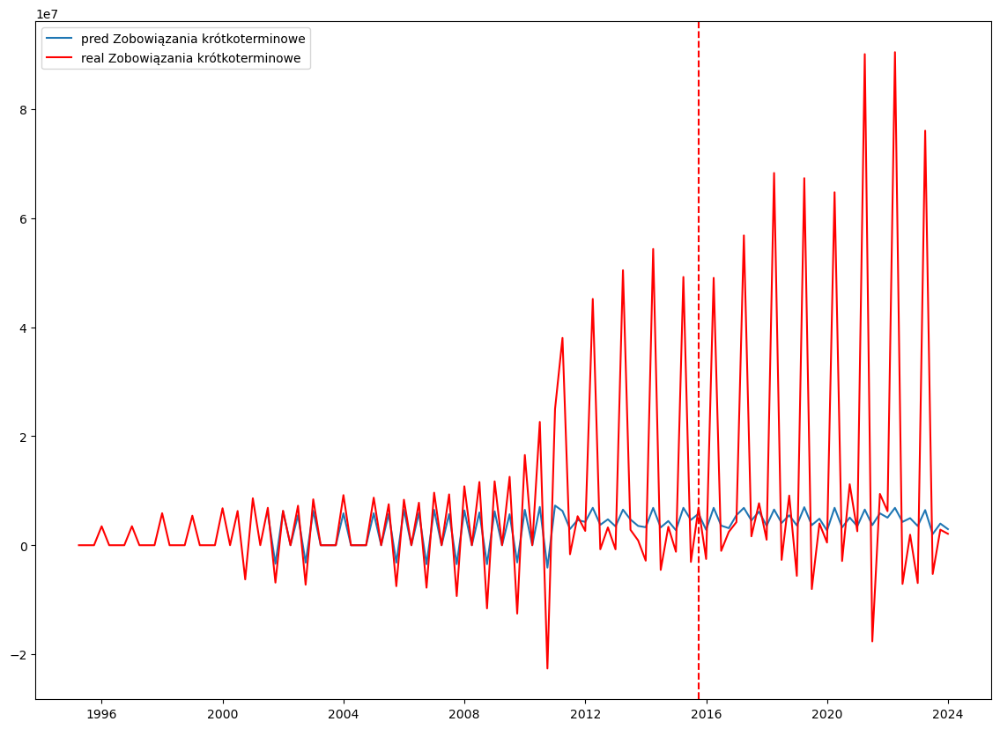

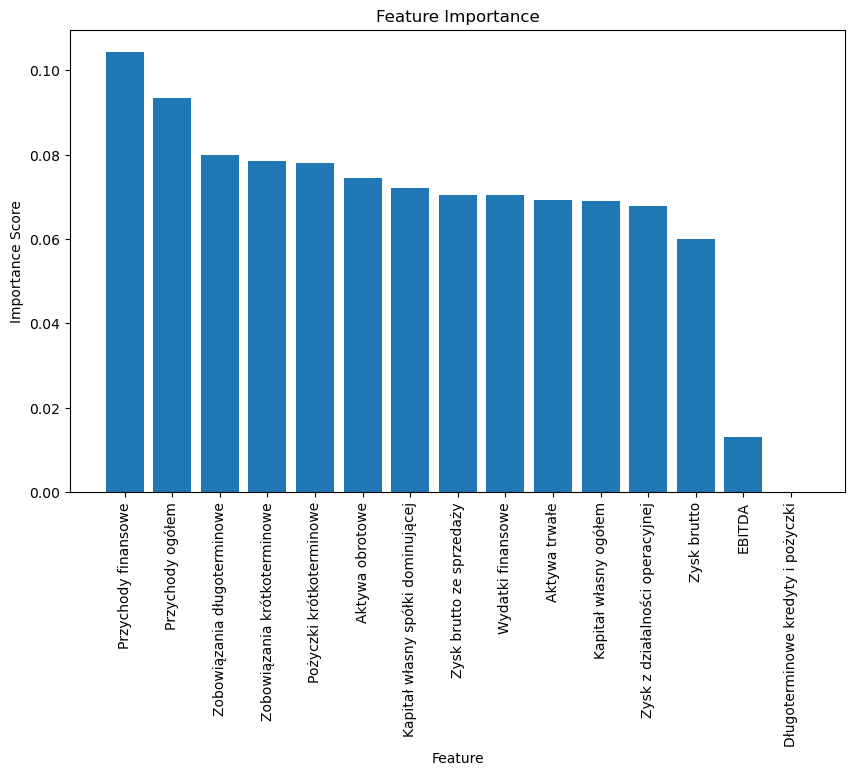

MAPE Pożyczki krótkoterminowe:  1303.3 %


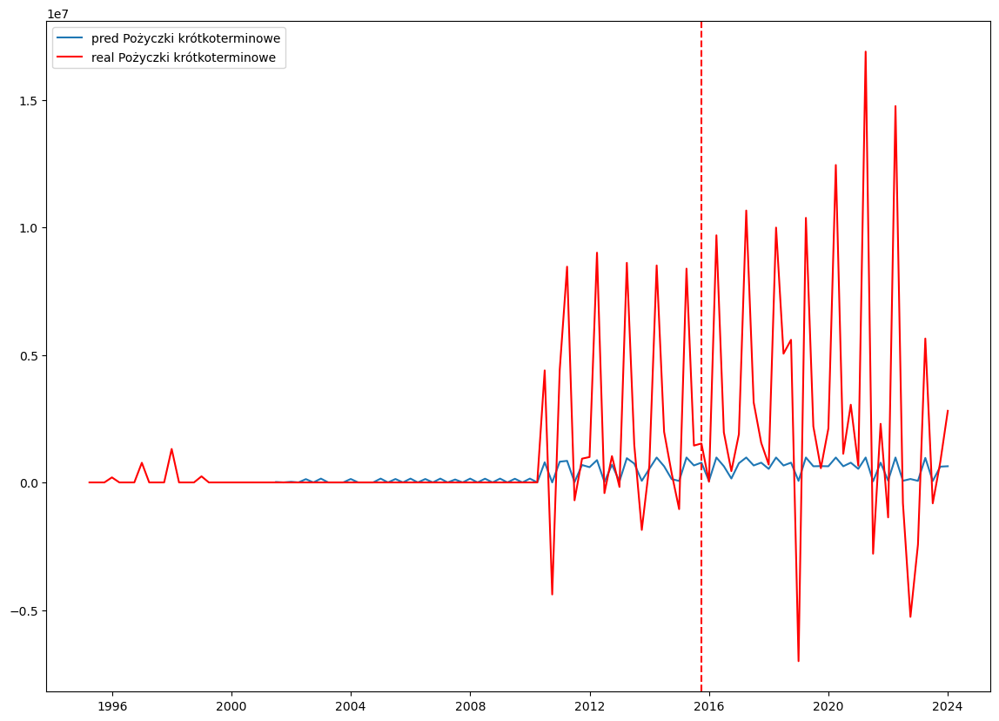

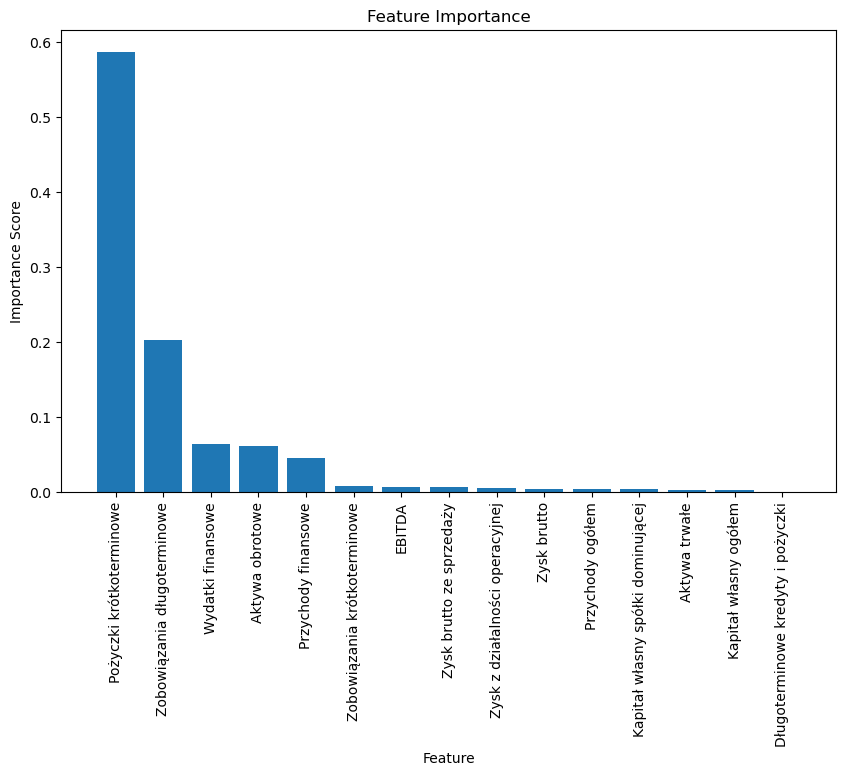

In [66]:
from sklearn.ensemble import RandomForestRegressor
from datetime import datetime

def mean_absolute_percentage_error(y_true, y_pred):
    """
    Oblicza średnią bezwzględną błędu procentowego (MAPE).

    Parametry:
    y_true : array-like
        Rzeczywiste wartości.
    y_pred : array-like
        Prognozowane wartości.

    Zwraca:
    mape : float
        Wartość MAPE.
    """

    df = pd.DataFrame(data={"y_true":y_true[0],"y_pred":y_pred[0]}, index=y_true.index)
    df_filtered = df[df['y_true'] != 0]
    y_true, y_pred = np.array(df_filtered['y_true']), np.array(df_filtered['y_pred'])
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

rf = RandomForestRegressor(n_estimators=1000, random_state=42)
best = list(random_forest_mol.columns)

for i in best:
    labels = np.array(random_forest_mol[f"{i}"])
        
    # Extracting features
    features = random_forest_mol
    features_np = np.array(features)
    
    
                                
    train_l = labels[:24]
    test_l = labels[25:]
        
    train_f = features_np[:24]
    test_f = features_np[25:]
    
    rf.fit(train_f, train_l)
    predictions = rf.predict(test_f)
    predictions = pd.DataFrame(predictions, index=features[25:].index)
    test_l = pd.DataFrame(test_l, random_forest_mol[f"{i}"][25:].index)
    f_list = list(features.columns)
    fig = plt.figure(figsize=(14,10))
    plt.plot(predictions, label=f"pred {i}")
    plt.plot(random_forest_mol[f"{i}"], c='r', label=f"real {i}")

    target_date = '2015-09-30'
    target_x = datetime.strptime(target_date, '%Y-%m-%d')


    plt.axvline(x=target_x, color='r', linestyle='--')
    plt.legend()
    
    mape = mean_absolute_percentage_error(test_l[:-1], predictions[:-1])
    #print("test_l:", test_l[0])
    #print("predictions:", predictions[0])
    print(f"MAPE {i}: ", round(mape,2),"%")

    feature_importances = rf.feature_importances_

    import matplotlib.pyplot as plt
    
    # Sort feature importances in descending order
    sorted_indices = np.argsort(feature_importances)[::-1]
    sorted_feature_importances = feature_importances[sorted_indices]
    
    # Get the names of the features in the original order
    sorted_feature_names = np.array(f_list)[sorted_indices]
    
    # Plot feature importances
    plt.figure(figsize=(10, 6))
    plt.bar(range(len(sorted_feature_importances)), sorted_feature_importances, align='center')
    plt.xticks(range(len(sorted_feature_importances)), sorted_feature_names, rotation=90)
    plt.xlabel('Feature')
    plt.ylabel('Importance Score')
    plt.title('Feature Importance')
    plt.show()

In [62]:
columns_to_drop = list(random_forest_mol.columns)
for i in columns_to_drop:
    if i.endswith("_"):
        random_forest_mol = random_forest_mol.drop(columns=i)

#random_forest_mol = random_forest_mol.drop(columns=["Rok", "Q"])

In [65]:
random_forest_mol

,Przychody ogółem,Zysk z działalności operacyjnej,EBITDA,Przychody finansowe,Wydatki finansowe,Zysk brutto,Aktywa trwałe,Aktywa obrotowe,Kapitał własny ogółem,Kapitał własny spółki dominującej,Zobowiązania długoterminowe,Zobowiązania krótkoterminowe,Pożyczki krótkoterminowe
Date,,,,,,,,,,,,,
2011-03-31,7405123,1580370,2239445,0,-9277,1571093,44162539,7922450,38945337,38325164,7706020,5433632,1241806
2011-06-30,6796779,1251540,1917931,0,-48622,1202918,-1010303,1324090,-294126,-286406,-504693,1112606,-549543
2011-09-30,-14201902,-2831910,-4157376,0,57899,-2774011,-43152236,-9246540,-38651211,-38038758,-7201327,-6546238,-692263
2011-12-31,28909711,4264667,6961259,2304397,-457856,6111208,44444933,14317698,41113610,40699616,7275616,10373405,697661
2012-03-31,0,0,0,0,0,0,0,0,0,0,0,0,0
2012-06-30,15326610,3107149,4537915,301751,-179212,3229688,44723014,15265999,40222348,39890161,7230454,12536211,417626
2012-09-30,-15326610,-3107149,-4537915,-301751,179212,-3229688,-44723014,-15265999,-40222348,-39890161,-7230454,-12536211,-417626
2012-12-31,31000043,5868754,9767722,395170,-246164,4610035,45406698,11296906,41011286,40716929,8474881,7217437,811447
2013-03-31,7923278,1547521,2274309,78322,-97622,1528221,45393840,14129302,42351378,42049826,8562435,8609329,548421


Best Parameters Przychody ogółem: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 1, 'max_depth': 4, 'subsample': 0.5}
Best MSE Przychody ogółem: 3985022.281192676


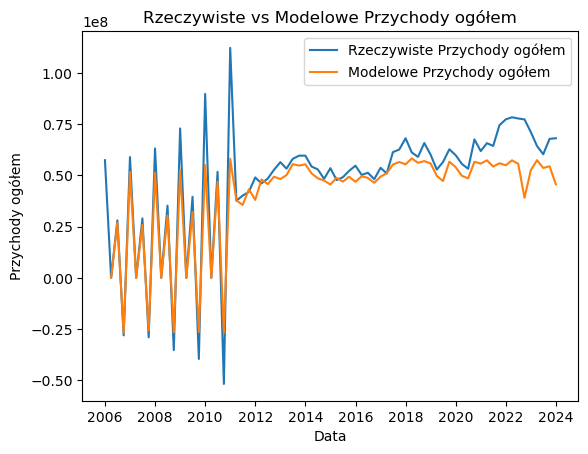

Best Parameters Zysk brutto ze sprzedaży: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 1, 'max_depth': 3, 'subsample': 0.5}
Best MSE Zysk brutto ze sprzedaży: 1237321.6936125285


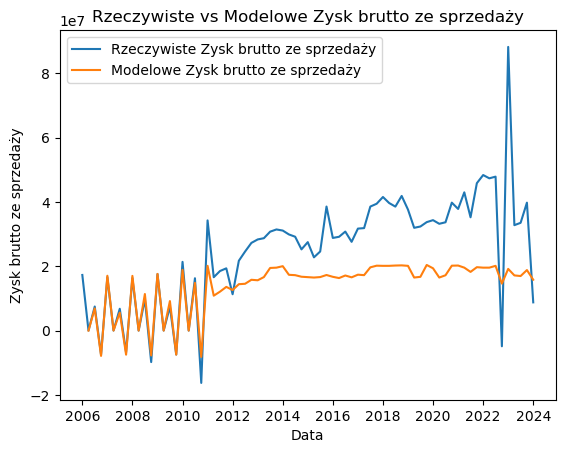

Best Parameters Zysk z działalności operacyjnej: {'colsample_bytree': 1.0, 'eta': 0.2, 'lambda': 0, 'max_depth': 7, 'subsample': 0.5}
Best MSE Zysk z działalności operacyjnej: 788114.4589480202


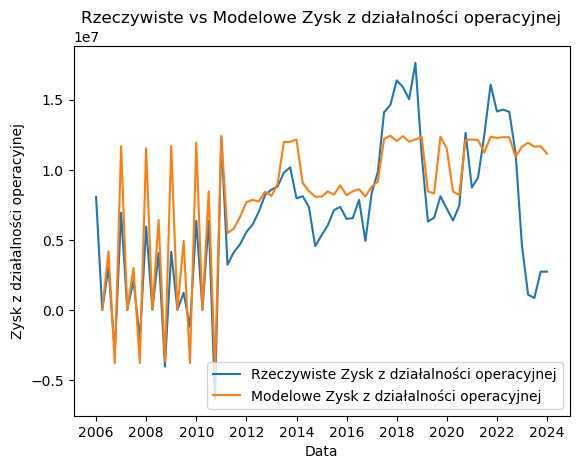

Best Parameters EBITDA: {'colsample_bytree': 1.0, 'eta': 0.2, 'lambda': 1, 'max_depth': 5, 'subsample': 0.7}
Best MSE EBITDA: 1090701.1495044832


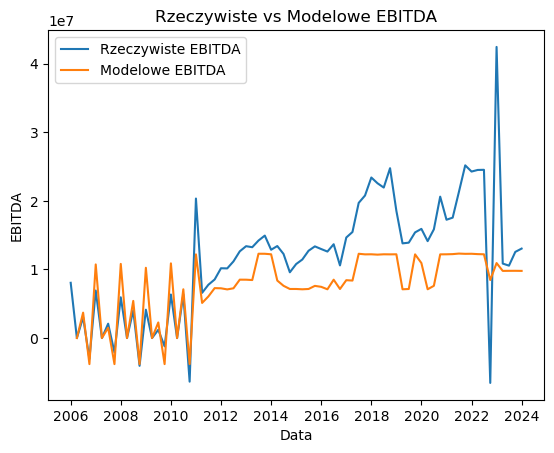

Best Parameters Przychody finansowe: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 5, 'max_depth': 3, 'subsample': 0.6}
Best MSE Przychody finansowe: 35639.28732583597


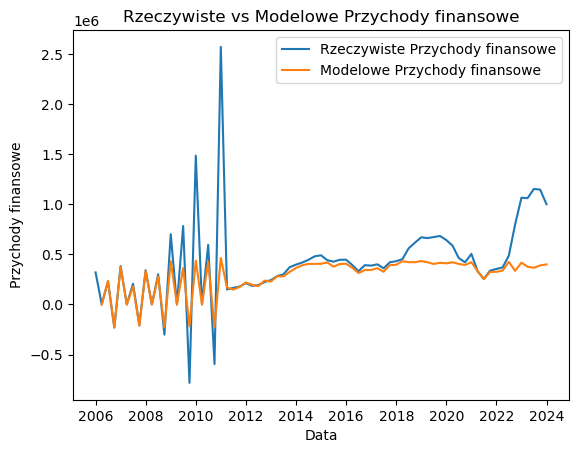

Best Parameters Wydatki finansowe: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 1, 'max_depth': 8, 'subsample': 0.8}
Best MSE Wydatki finansowe: 88640.01958623985


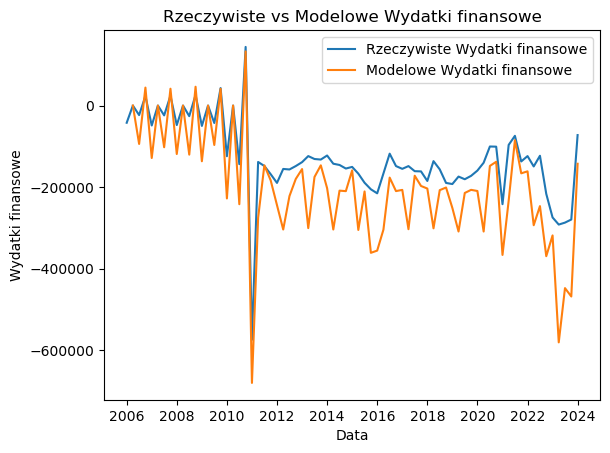

Best Parameters Zysk brutto: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 5, 'max_depth': 3, 'subsample': 0.6}
Best MSE Zysk brutto: 951349.9101820107


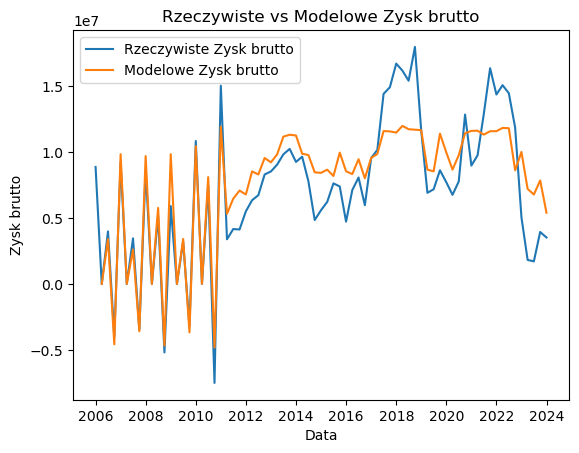

Best Parameters Aktywa trwałe: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 5, 'max_depth': 4, 'subsample': 0.5}
Best MSE Aktywa trwałe: 3923795.499971541


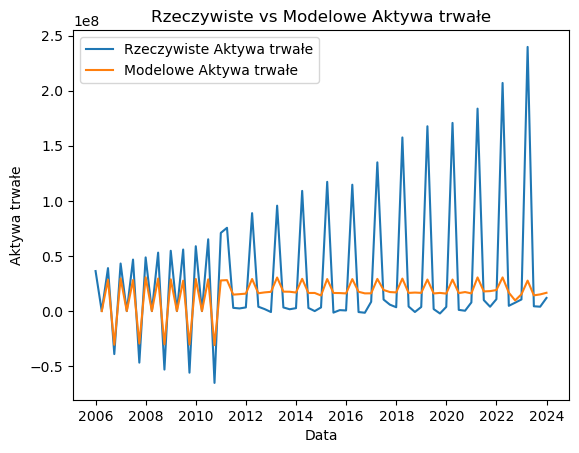

Best Parameters Aktywa obrotowe: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 3, 'max_depth': 6, 'subsample': 0.8}
Best MSE Aktywa obrotowe: 1438773.4845970792


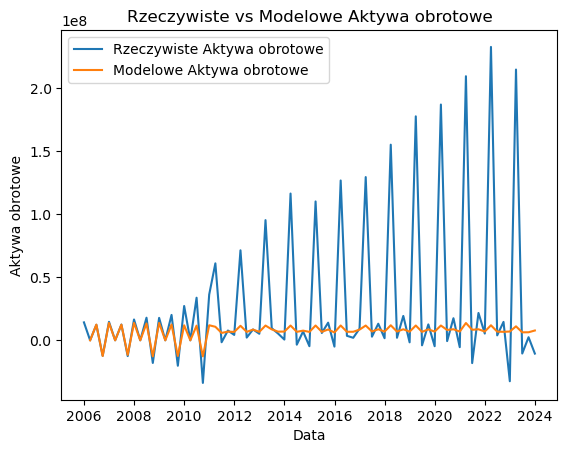

Best Parameters Kapitał własny ogółem: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 5, 'max_depth': 8, 'subsample': 0.5}
Best MSE Kapitał własny ogółem: 5114197.258592103


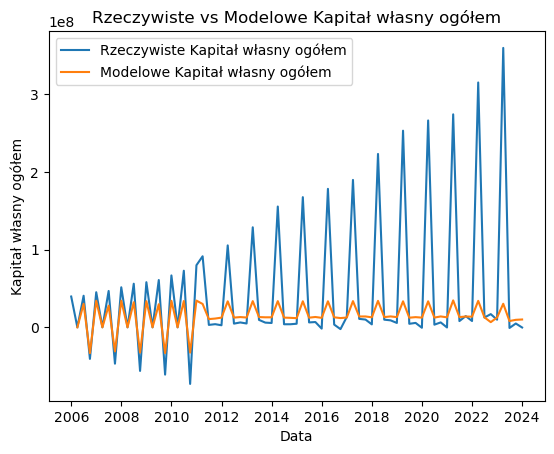

Best Parameters Kapitał własny spółki dominującej: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 5, 'max_depth': 8, 'subsample': 0.5}
Best MSE Kapitał własny spółki dominującej: 5114197.258592103


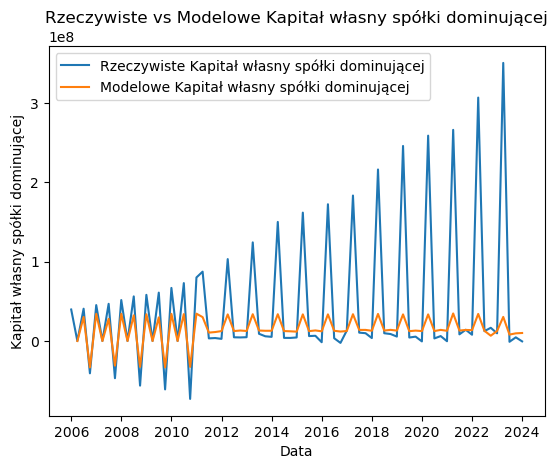

Best Parameters Zobowiązania długoterminowe: {'colsample_bytree': 1.0, 'eta': 0.2, 'lambda': 1, 'max_depth': 7, 'subsample': 0.8}
Best MSE Zobowiązania długoterminowe: 951882.3323575063


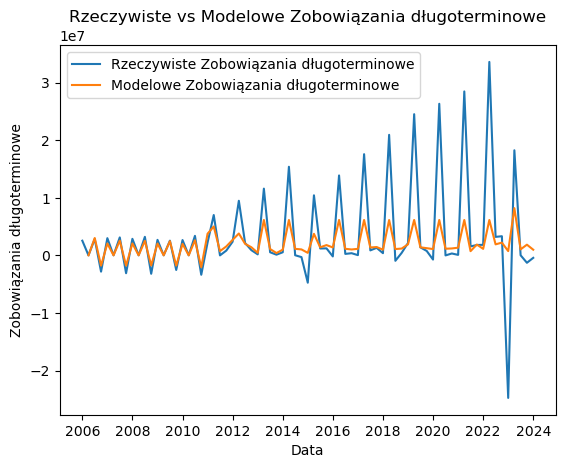

Best Parameters Długoterminowe kredyty i pożyczki: {'colsample_bytree': 1.0, 'eta': 0.01, 'lambda': 5, 'max_depth': 3, 'subsample': 0.8}
Best MSE Długoterminowe kredyty i pożyczki: 36.991848935373966


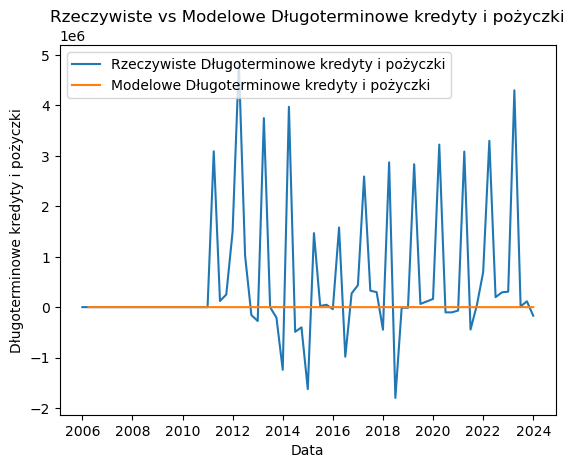

Best Parameters Zobowiązania krótkoterminowe: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 0, 'max_depth': 5, 'subsample': 0.8}
Best MSE Zobowiązania krótkoterminowe: 685164.8011525609


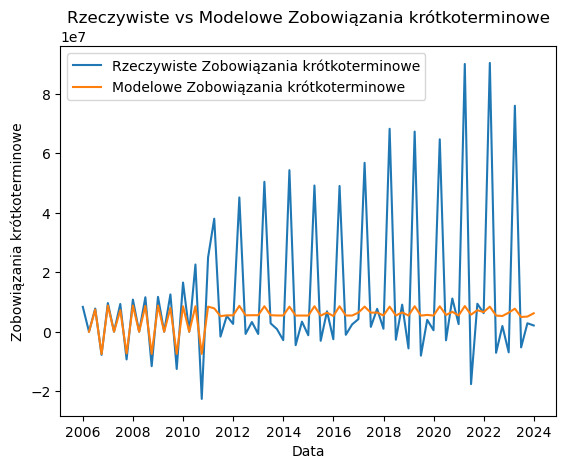

Best Parameters Pożyczki krótkoterminowe: {'colsample_bytree': 0.8, 'eta': 0.2, 'lambda': 0, 'max_depth': 10, 'subsample': 0.8}
Best MSE Pożyczki krótkoterminowe: 122649.95302928216


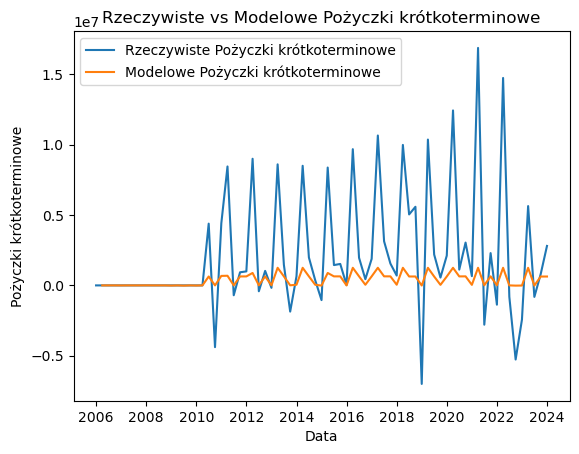

In [67]:
#eXtreme Gradient Boost

#Wydzielam dane na zbiory testowe i treningowe
#W nastepnym kroku stosuje metode krzyzowej walidacji, aby ustalić dla jakich parametrów model ma najlepsze dopasowanie
#za parametr oceny stosuje ujemny pierwiastek ze średniego błędu kwadratowego


import xgboost as xgb
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt

#random_forest_mol = random_forest_mol.drop(columns=["Rok", "Q"], axis=1)
for i in list(random_forest_mol.columns):
    labels = random_forest_mol[f"{i}"]
        
    features = random_forest_mol
    train_l = labels[:43]
    test_l = labels[44:]
        
    train_f = features[:43]
    test_f = features[44:]
        
    
    dtrain = xgb.DMatrix(train_f, label=train_l.to_numpy().reshape(-1,1))
    dtest = xgb.DMatrix(test_f, label=test_l.to_numpy().reshape(-1,1))
    
    param_grid = {
        'max_depth': [3,4,5,6,7,8,9,10],
        'eta': [0.01, 0.2],
        'subsample': [0.5,0.6,0.7,0.8,],
        'colsample_bytree': [0.8, 1.0],
        'lambda' : [0, 1, 3, 5]
    }
    
    xgb_regressor = xgb.XGBRegressor(objective='reg:squarederror')
    
    grid_search = GridSearchCV(estimator=xgb_regressor, param_grid=param_grid, scoring='neg_root_mean_squared_error', cv=5)
    grid_search.fit(train_f, train_l)
    
    best_params = grid_search.best_params_
    
    print(f"Best Parameters {i}:", grid_search.best_params_)
    print(f"Best MSE {i}:", -grid_search.best_score_)

    num_rounds = 100
    model = xgb.train(best_params, dtrain, num_rounds)


    predictions_train = model.predict(dtrain)
    forecast_train = pd.DataFrame(predictions_train, columns=[f"{i}"])
    forecast_train.index = features[:43].index
    
    predictions_test = model.predict(dtest)
    forecast_test = pd.DataFrame(predictions_test, columns=[f"{i}"])
    forecast_test.index = features[44:].index

    actual_values = labels[43:]

    plt.plot(actual_values, label=f'Rzeczywiste {i}')
    plt.plot(forecast_test, label=f'Modelowe {i}')
        
    plt.xlabel('Data')
    plt.ylabel(f'{i}')
    plt.title(f'Rzeczywiste vs Modelowe {i}')
    plt.legend()    
    plt.show()


#Zgodnie z metodą wychodzi, że powinnienem ustawić model na anstępujące parametry:
#- colsample_bytree: 1
#- eta: 0.2
#- lambda: 0.1
#- max_depth: 4
#- subsample: 0.6
#Dla podanych parametrów dopasowany model osiąga średni błąd kwadratowy 437309727.4168719


Przychody ogółem
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 287ms/step - loss: 214520244994048.0000 - mae: 8634704.0000 - val_loss: 2394087785234432.0000 - val_mae: 45533420.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 221481699115008.0000 - mae: 9073792.0000 - val_loss: 1901679985295360.0000 - val_mae: 40340188.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 162642710757376.0000 - mae: 7656233.5000 - val_loss: 1537271471800320.0000 - val_mae: 35253368.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 138912236306432.0000 - mae: 6894711.0000 - val_loss: 1289803777703936.0000 - val_mae: 30744942.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 107840454787072.0000 - mae: 5957676.5000 - val_loss: 1160358026805248.0000 - val_mae: 29142914.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 81372903374848.0000 - mae: 4937653.5000 - val_loss: 1137088833519616.0000 - val_mae: 29321842.0000
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 48

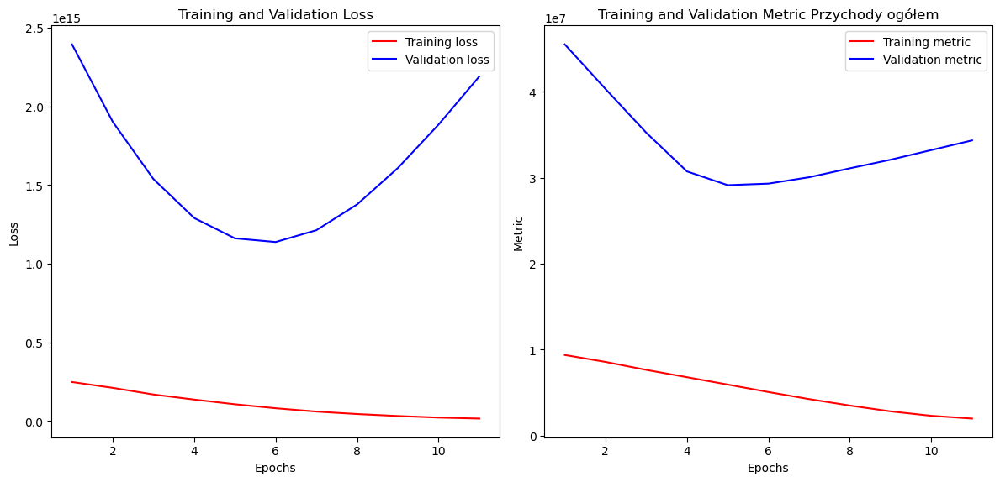

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 56454547505152.0000 - mae: 4271457.0000 
Test accuracy: 4394136.5
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


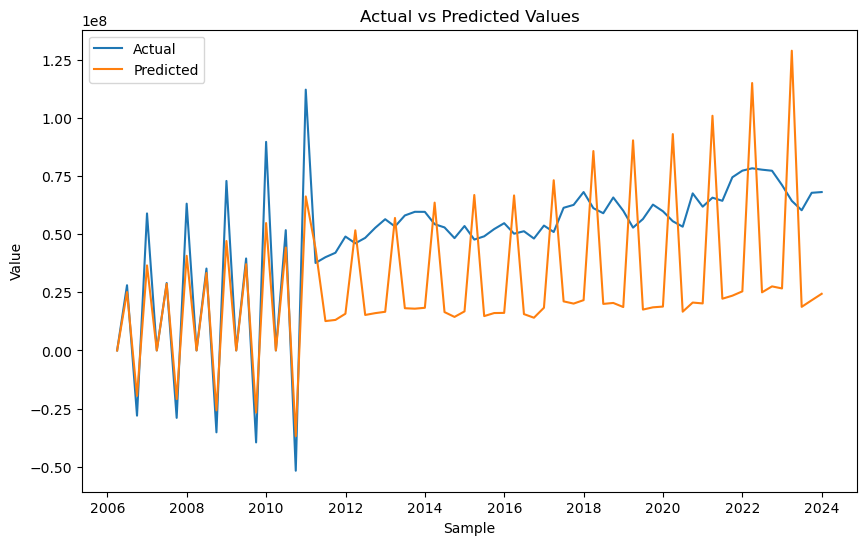

MAPE Przychody ogółem:  inf %
Zysk brutto ze sprzedaży
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 275ms/step - loss: 69926647758848.0000 - mae: 4735800.5000 - val_loss: 1088305789665280.0000 - val_mae: 28965874.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 55576558043136.0000 - mae: 4353178.5000 - val_loss: 837302465069056.0000 - val_mae: 24204526.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 40557464256512.0000 - mae: 3499181.5000 - val_loss: 693389922140160.0000 - val_mae: 20617336.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 25392461119488.0000 - mae: 2612537.5000 - val_loss: 648061642604544.0000 - val_mae: 20457400.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 17832735670272.0000 - mae: 2244446.2500 - val_loss: 679181432127488.0000 - val_mae: 21445856.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 9906807635968.0000 - mae: 1613135.2500 - val_loss: 759085003702272.0000 - val_mae: 22564686.0000
Epoch 7/50
2/2

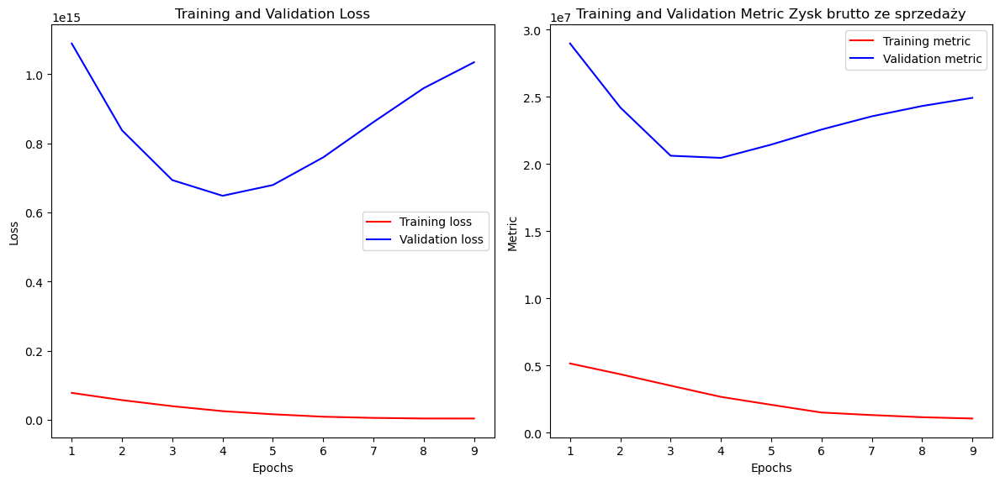

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 14695229554688.0000 - mae: 1974388.6250 
Test accuracy: 2073446.0
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


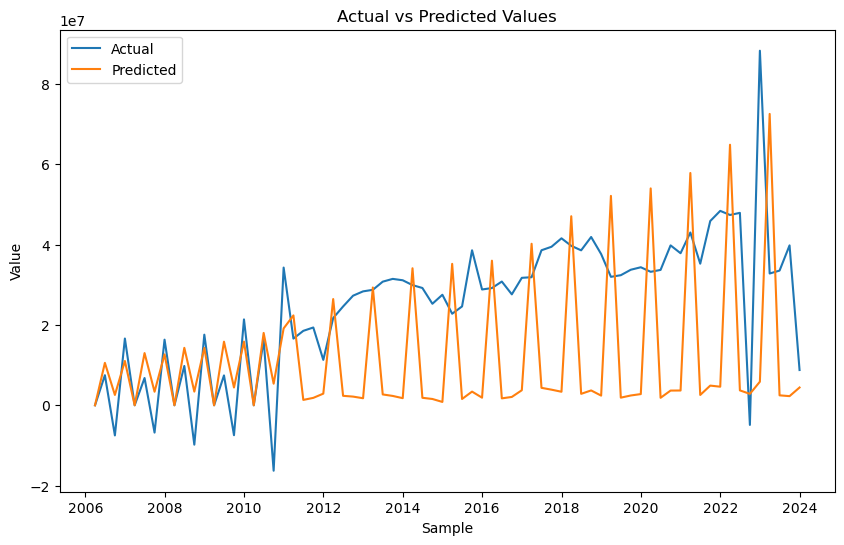

MAPE Zysk brutto ze sprzedaży:  inf %
Zysk z działalności operacyjnej
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 260ms/step - loss: 24006486917120.0000 - mae: 2898159.5000 - val_loss: 88757822816256.0000 - val_mae: 8093285.5000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 9820069429248.0000 - mae: 1814069.5000 - val_loss: 30061956694016.0000 - val_mae: 4330528.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 5320894578688.0000 - mae: 1255299.1250 - val_loss: 72305371774976.0000 - val_mae: 5343457.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 1032112504832.0000 - mae: 554368.1250 - val_loss: 181580177866752.0000 - val_mae: 7406746.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 595577077760.0000 - mae: 427538.0938 - val_loss: 316729209126912.0000 - val_mae: 9514928.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 1595677474816.0000 - mae: 745670.2500 - val_loss: 432559947251712.0000 - val_mae: 11209913.0000
Epoch 7/50
2/2 ━

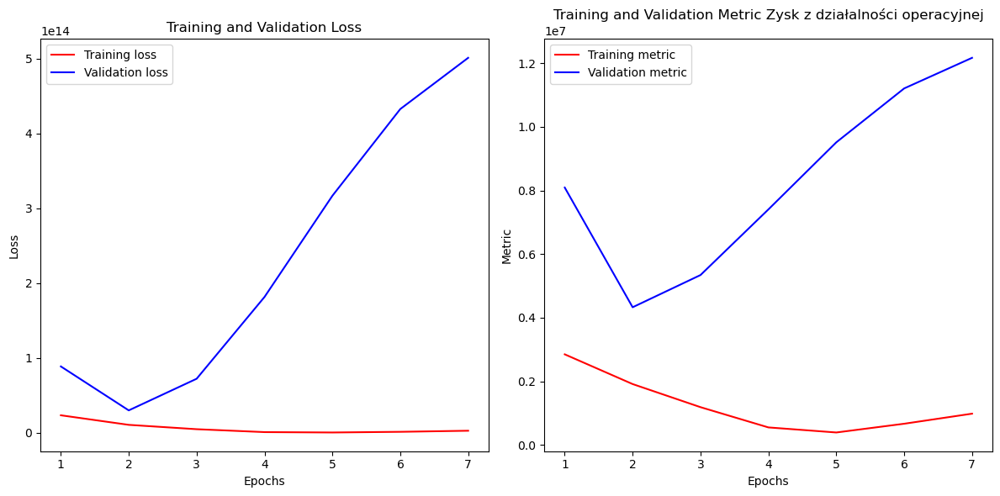

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 4838168461312.0000 - mae: 1232375.6250 
Test accuracy: 1272812.875
1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/stepWARNING:tensorflow:6 out of the last 9 calls to <function TensorFlowTrainer.make_predict_function.<locals>.one_step_on_data_distributed at 0x000001B3E72A6DE0> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


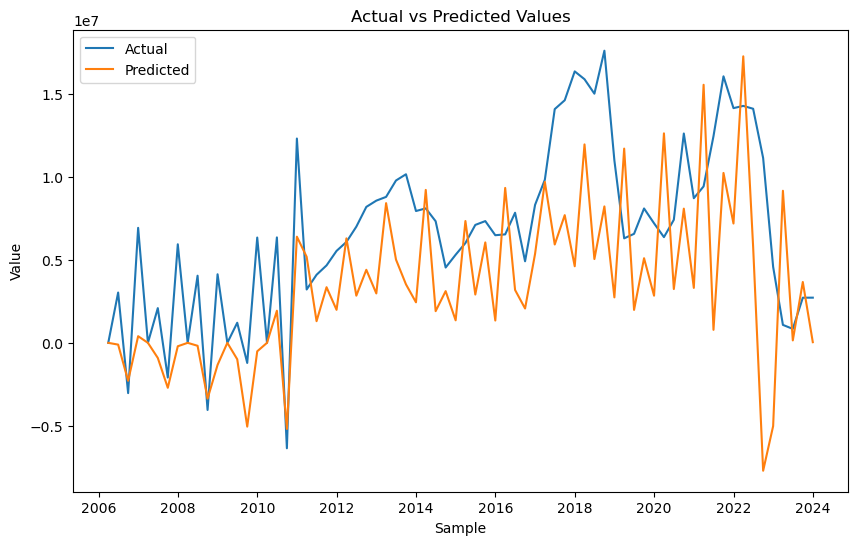

MAPE Zysk z działalności operacyjnej:  inf %
EBITDA
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 267ms/step - loss: 13328678125568.0000 - mae: 1922738.2500 - val_loss: 81764466819072.0000 - val_mae: 6816313.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - loss: 6166548578304.0000 - mae: 1141659.5000 - val_loss: 93668883038208.0000 - val_mae: 7184358.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 2569738387456.0000 - mae: 726800.6875 - val_loss: 155210638950400.0000 - val_mae: 8120219.5000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 1800888647680.0000 - mae: 737074.3750 - val_loss: 203029361983488.0000 - val_mae: 8650528.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 2802873794560.0000 - mae: 906701.1875 - val_loss: 205868654133248.0000 - val_mae: 8684036.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 3173561139200.0000 - mae: 981096.5625 - val_loss: 173686665510912.0000 - val_mae: 8114834.5000
Epoch 6: early stopping
Restoring 

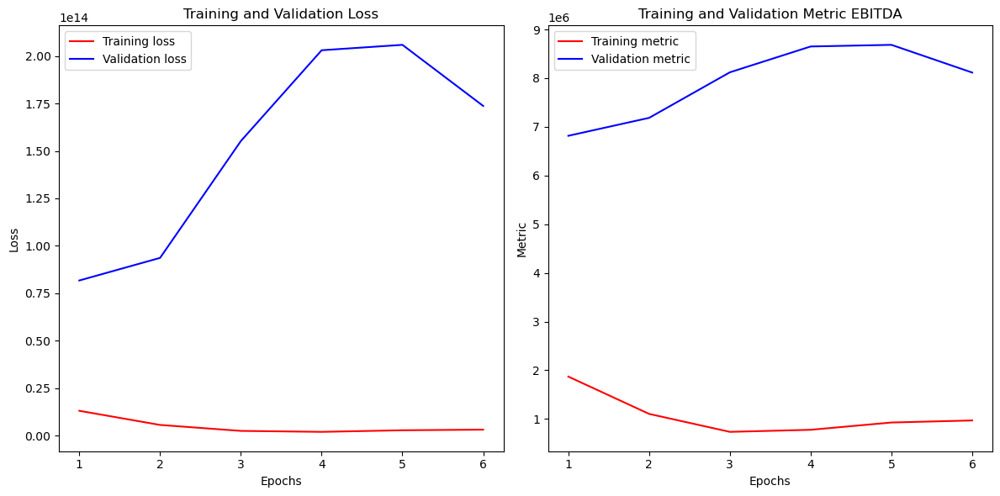

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 5071736143872.0000 - mae: 1099590.2500
Test accuracy: 1214570.75
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


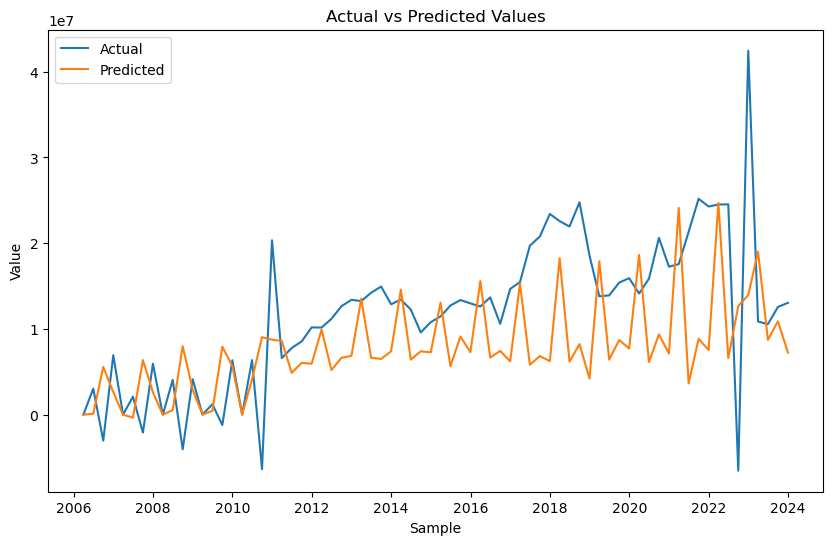

MAPE EBITDA:  inf %
Przychody finansowe
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 265ms/step - loss: 14919840825344.0000 - mae: 2270032.2500 - val_loss: 110325764456448.0000 - val_mae: 9130887.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 5864681897984.0000 - mae: 1353246.6250 - val_loss: 147011009511424.0000 - val_mae: 8862043.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 1018965196800.0000 - mae: 549664.3750 - val_loss: 229661145563136.0000 - val_mae: 9243744.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 255214010368.0000 - mae: 237708.6719 - val_loss: 333463207018496.0000 - val_mae: 10138268.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 1128086896640.0000 - mae: 535150.8750 - val_loss: 409978351386624.0000 - val_mae: 10629511.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 2209371914240.0000 - mae: 807652.1875 - val_loss: 427747570614272.0000 - val_mae: 10701794.0000
Epoch 6: early stopping
Restoring model we

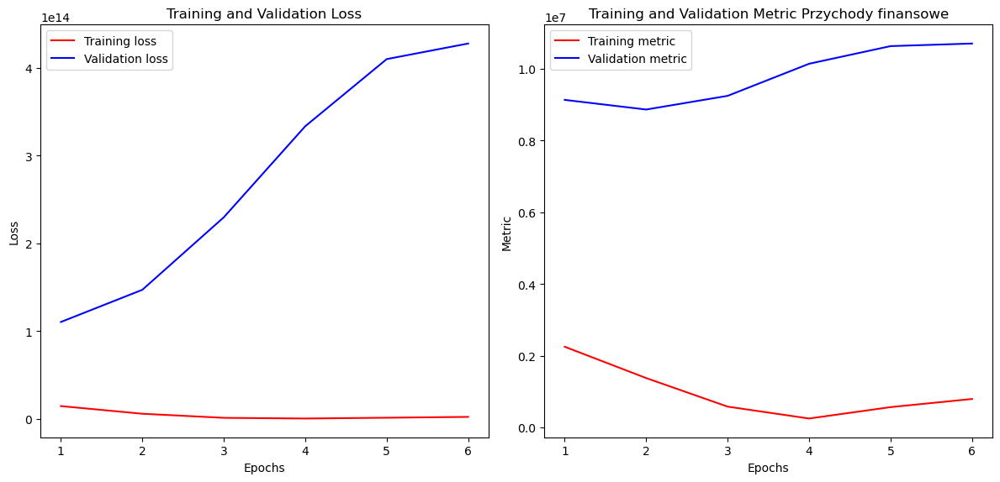

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 6164408958976.0000 - mae: 1484234.7500 
Test accuracy: 1520638.875
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


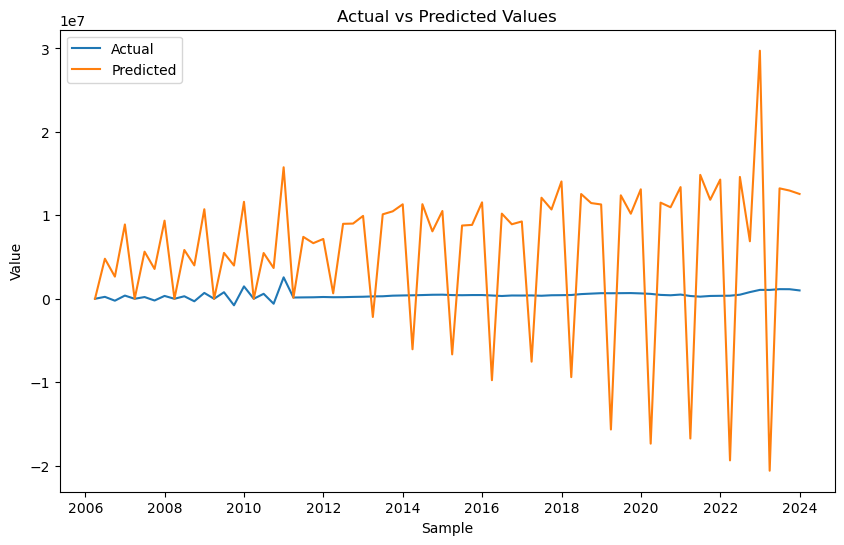

MAPE Przychody finansowe:  inf %
Wydatki finansowe
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 307ms/step - loss: 3472785670144.0000 - mae: 1017265.8750 - val_loss: 134130855575552.0000 - val_mae: 9005481.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 505773326336.0000 - mae: 332341.1250 - val_loss: 80222565171200.0000 - val_mae: 7680831.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 1463630561280.0000 - mae: 644636.1250 - val_loss: 72731345289216.0000 - val_mae: 7201223.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 1389733609472.0000 - mae: 632300.0625 - val_loss: 72016694607872.0000 - val_mae: 7157593.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 815525855232.0000 - mae: 429432.8125 - val_loss: 89704569503744.0000 - val_mae: 7705098.5000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 392579547136.0000 - mae: 344470.9688 - val_loss: 109923304210432.0000 - val_mae: 8113457.0000
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 47m

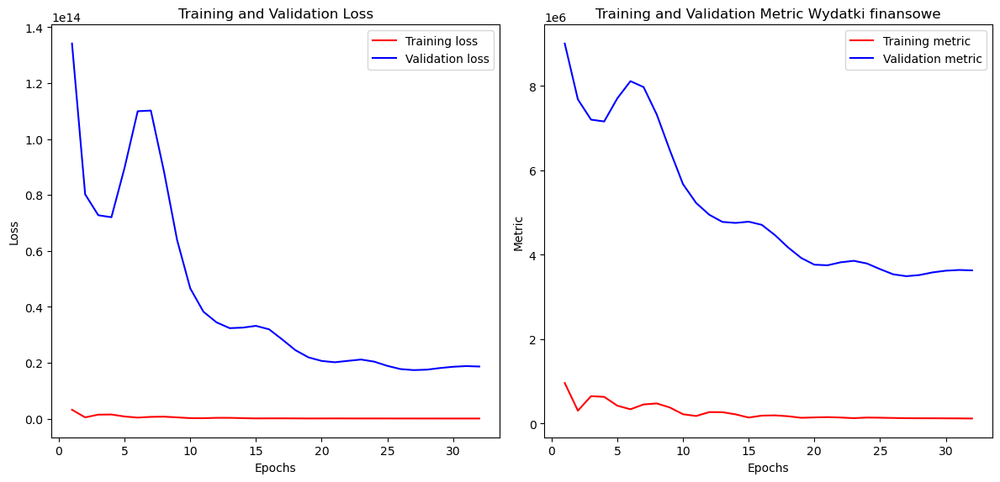

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 54069608448.0000 - mae: 126106.6641 
Test accuracy: 122583.2109375
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


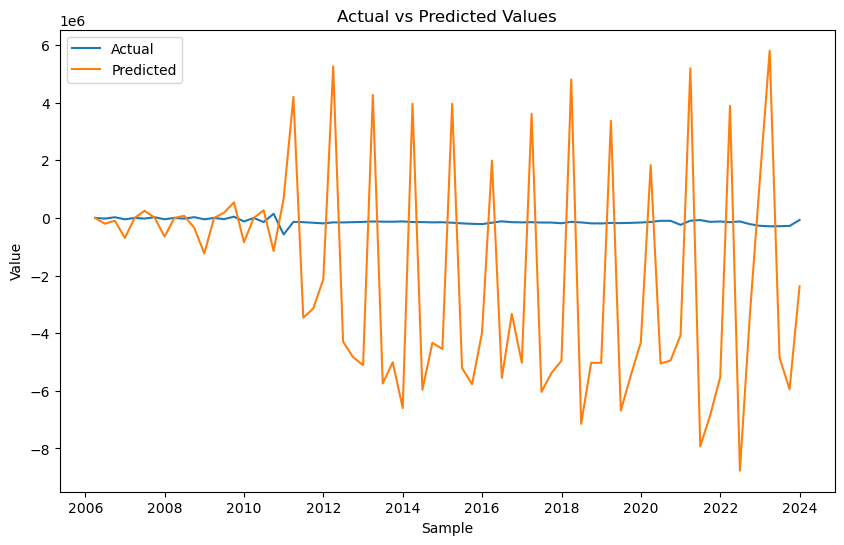

MAPE Wydatki finansowe:  inf %
Zysk brutto
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 280ms/step - loss: 29137215422464.0000 - mae: 2729883.7500 - val_loss: 167993350815744.0000 - val_mae: 11076152.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 10826304978944.0000 - mae: 1592899.5000 - val_loss: 78325456306176.0000 - val_mae: 7025358.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 8856066326528.0000 - mae: 1413231.8750 - val_loss: 90073961857024.0000 - val_mae: 7600850.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 4767151554560.0000 - mae: 1072741.0000 - val_loss: 166264777474048.0000 - val_mae: 9229286.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 4149583544320.0000 - mae: 1064082.3750 - val_loss: 256406779330560.0000 - val_mae: 10402053.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 4641531101184.0000 - mae: 1168576.8750 - val_loss: 317332249378816.0000 - val_mae: 10964041.0000
Epoch 7/50
2/2 ━━━━━━━━━━━━━━━━━━━━

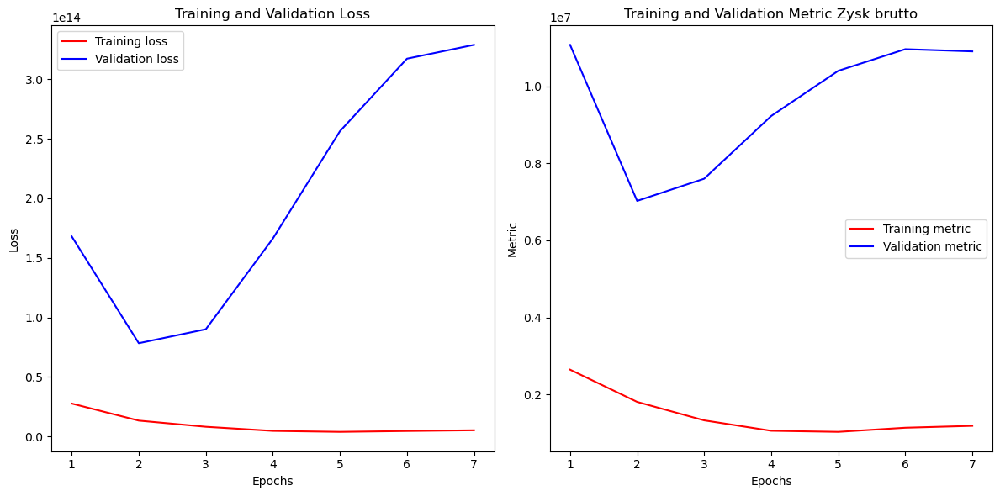

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 7570281988096.0000 - mae: 1353950.5000 
Test accuracy: 1413890.5
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


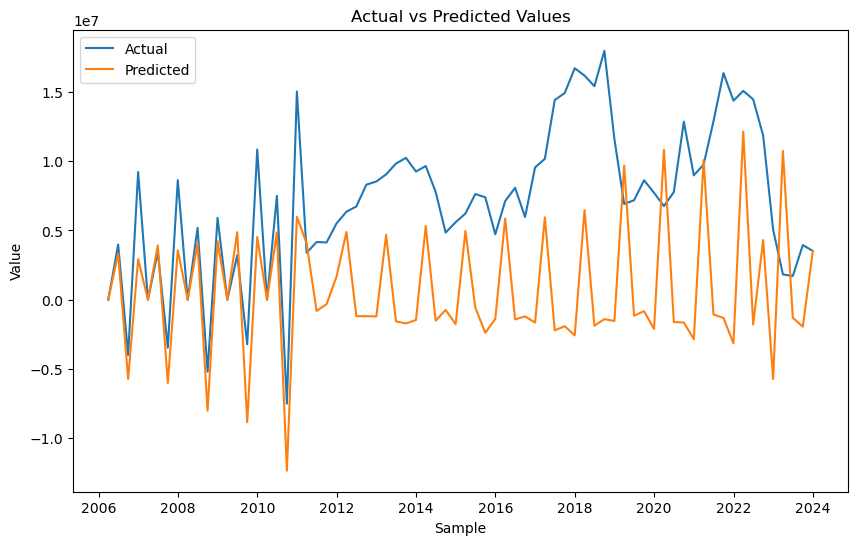

MAPE Zysk brutto:  inf %
Aktywa trwałe
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 535ms/step - loss: 178537998843904.0000 - mae: 8046802.0000 - val_loss: 2718119176962048.0000 - val_mae: 31155414.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 126331933163520.0000 - mae: 6786520.5000 - val_loss: 2042699867750400.0000 - val_mae: 28407570.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 109248910458880.0000 - mae: 6114504.5000 - val_loss: 1478321837703168.0000 - val_mae: 25893234.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 82499350822912.0000 - mae: 5165522.5000 - val_loss: 1039222702080000.0000 - val_mae: 23527842.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 72166741639168.0000 - mae: 4904212.0000 - val_loss: 712250063060992.0000 - val_mae: 21221292.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 54276105699328.0000 - mae: 4004101.2500 - val_loss: 496770949840896.0000 - val_mae: 19074254.0000
Epoch 7/50
2/2 ━━━━━━━━

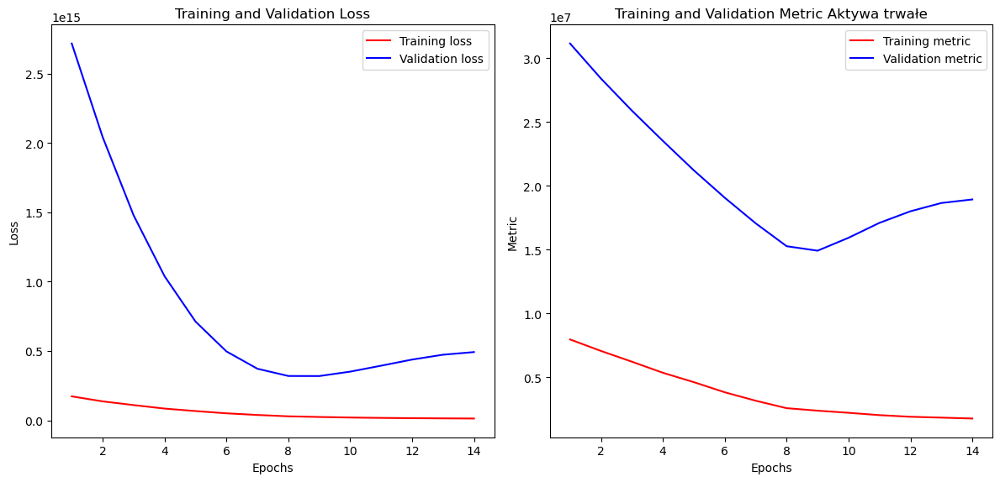

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 18307746889728.0000 - mae: 2158518.5000 
Test accuracy: 2237673.5
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


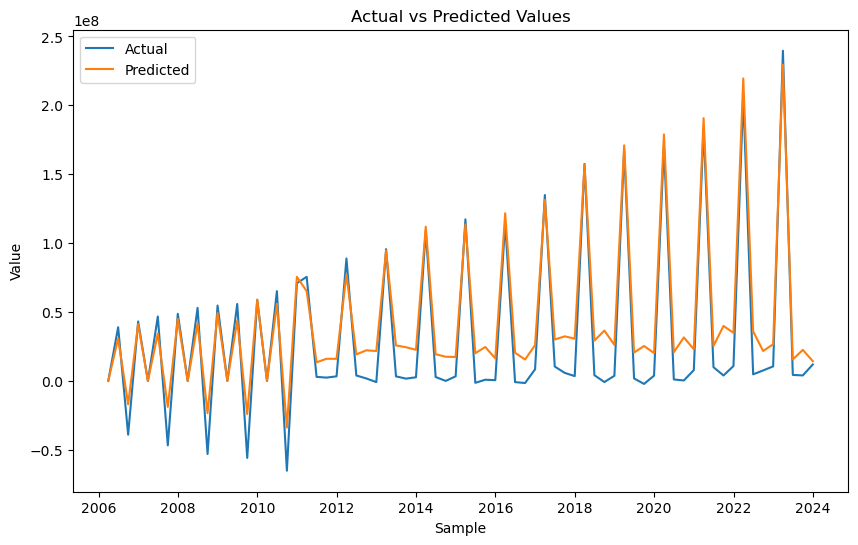

MAPE Aktywa trwałe:  inf %
Aktywa obrotowe
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 310ms/step - loss: 27899277082624.0000 - mae: 2460446.2500 - val_loss: 1194006948085760.0000 - val_mae: 20503160.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 18240849838080.0000 - mae: 1772196.7500 - val_loss: 855756865798144.0000 - val_mae: 18736182.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 13984875937792.0000 - mae: 1765906.2500 - val_loss: 745982803312640.0000 - val_mae: 18096652.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 10694798868480.0000 - mae: 1672562.3750 - val_loss: 768224559890432.0000 - val_mae: 17941712.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 6643012599808.0000 - mae: 1370361.5000 - val_loss: 849888464076800.0000 - val_mae: 17989718.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 3933786079232.0000 - mae: 1040113.6875 - val_loss: 964923593064448.0000 - val_mae: 18197880.0000
Epoch 7/50
2/2 ━━━━━━━━━━━━

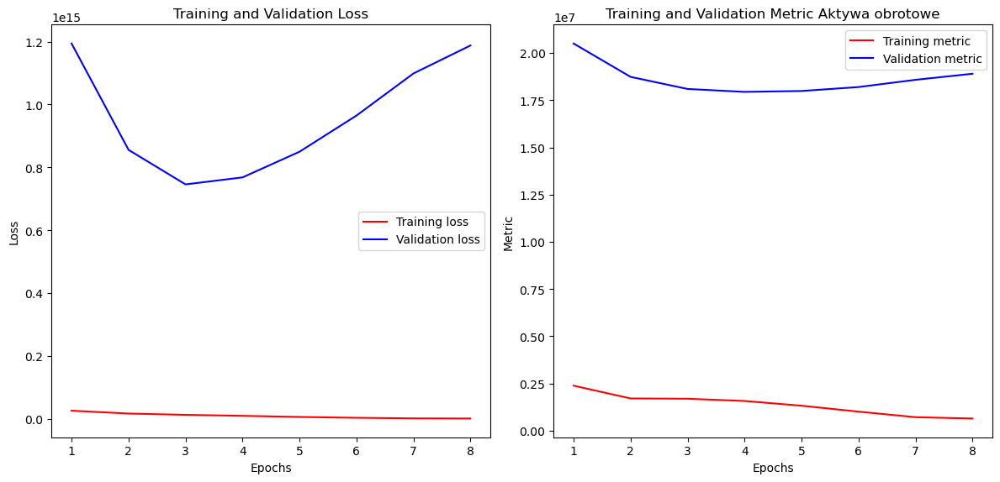

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 8928553336832.0000 - mae: 1507731.8750 
Test accuracy: 1593478.125
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


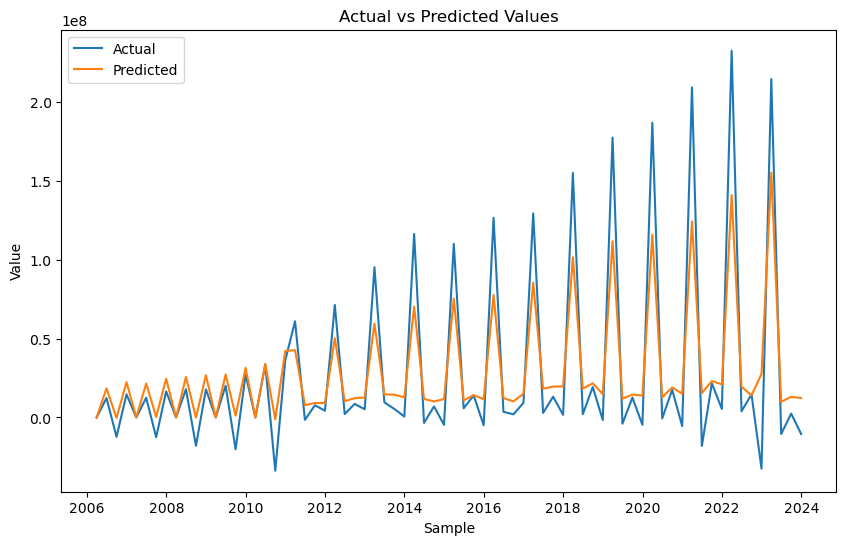

MAPE Aktywa obrotowe:  inf %
Kapitał własny ogółem
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 252ms/step - loss: 197792085573632.0000 - mae: 7981836.0000 - val_loss: 8535895313481728.0000 - val_mae: 50263964.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 160252108472320.0000 - mae: 6914873.5000 - val_loss: 7193584352624640.0000 - val_mae: 47460140.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 126251511578624.0000 - mae: 5803441.0000 - val_loss: 5992151540301824.0000 - val_mae: 44712100.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 79937436385280.0000 - mae: 4438287.5000 - val_loss: 4941475838164992.0000 - val_mae: 42029072.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 63172820074496.0000 - mae: 3898903.7500 - val_loss: 4016874874470400.0000 - val_mae: 39346884.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 55051947081728.0000 - mae: 3643237.7500 - val_loss: 3236038008897536.0000 - val_mae: 36758244.0000
Epoch 7/5

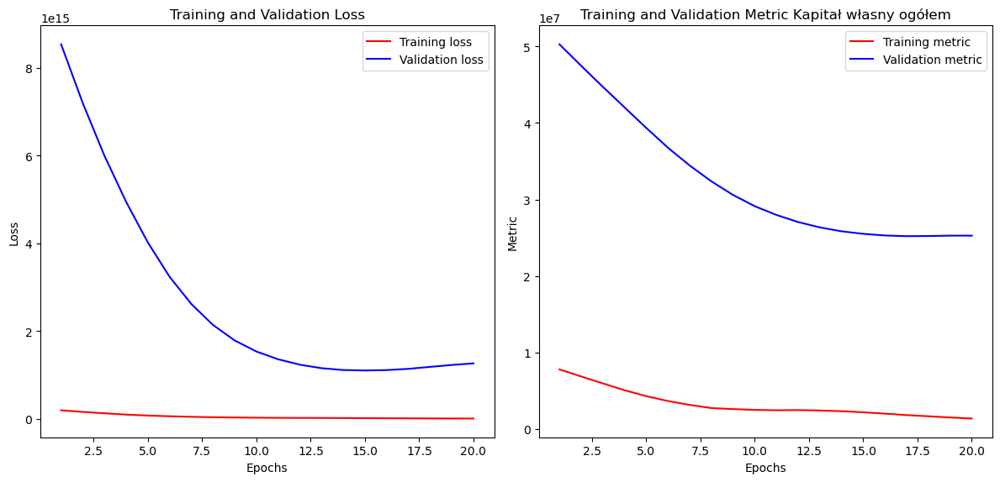

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 12157220552704.0000 - mae: 1971567.2500
Test accuracy: 2050337.5
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


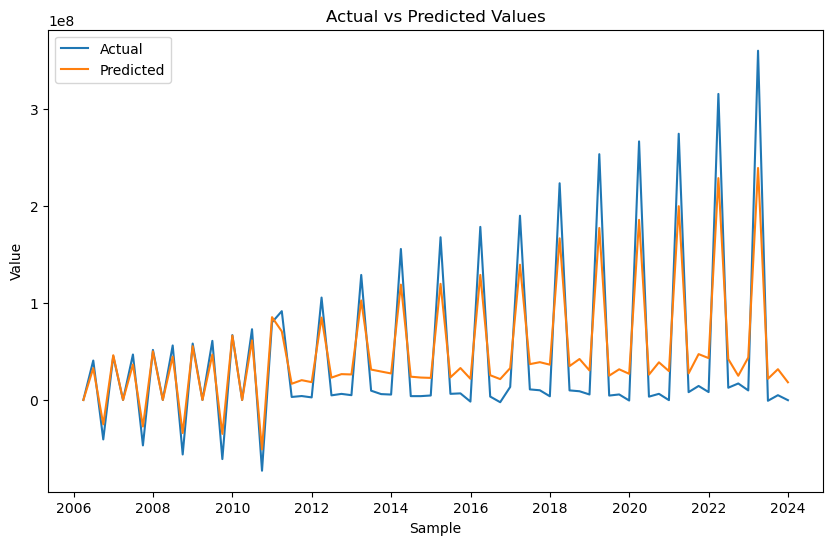

MAPE Kapitał własny ogółem:  inf %
Kapitał własny spółki dominującej
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 281ms/step - loss: 399903532515328.0000 - mae: 12073134.0000 - val_loss: 12454794199302144.0000 - val_mae: 66841160.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 289727253053440.0000 - mae: 9882106.0000 - val_loss: 10967992485543936.0000 - val_mae: 61922240.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 264385821933568.0000 - mae: 9539107.0000 - val_loss: 9573747317014528.0000 - val_mae: 56984540.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 222577016438784.0000 - mae: 9011841.0000 - val_loss: 8318636003426304.0000 - val_mae: 52215700.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 161273908035584.0000 - mae: 7334357.5000 - val_loss: 7167676573024256.0000 - val_mae: 47508464.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 162904603099136.0000 - mae: 7692376.0000 - val_loss: 6102980487020544.0000 - val_mae:

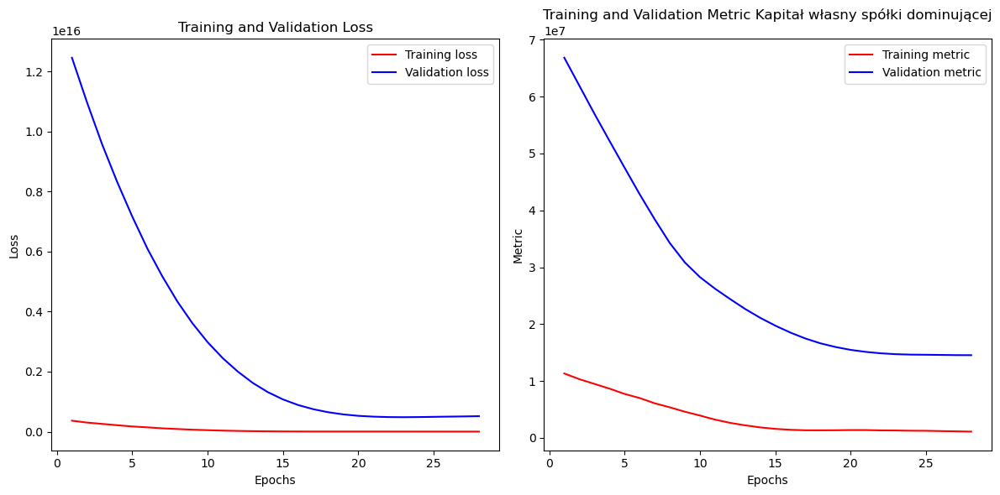

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 5182600511488.0000 - mae: 1255639.0000 
Test accuracy: 1264508.75
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


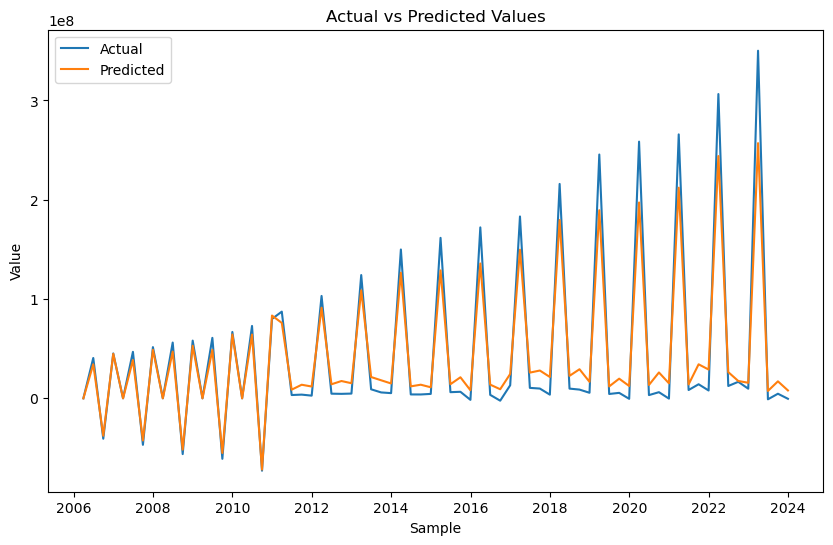

MAPE Kapitał własny spółki dominującej:  inf %
Zobowiązania długoterminowe
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 276ms/step - loss: 27028057227264.0000 - mae: 3135536.5000 - val_loss: 42853665341440.0000 - val_mae: 4050091.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 16937838968832.0000 - mae: 2299592.7500 - val_loss: 38444482953216.0000 - val_mae: 3339118.7500
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 7234903867392.0000 - mae: 1147304.1250 - val_loss: 120392303771648.0000 - val_mae: 7016948.5000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 7087142207488.0000 - mae: 1227945.1250 - val_loss: 241422728953856.0000 - val_mae: 10402607.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 7974724042752.0000 - mae: 1457963.6250 - val_loss: 326106632683520.0000 - val_mae: 12275715.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 9437229088768.0000 - mae: 1670356.8750 - val_loss: 354326446866432.0000 - val_mae: 12920223.0000
Epo

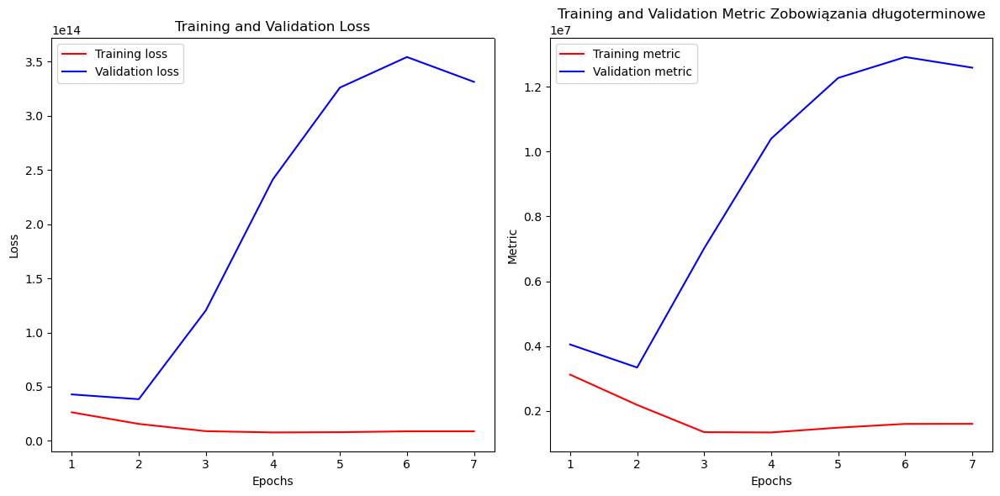

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 11071705317376.0000 - mae: 1599215.2500 
Test accuracy: 1454865.875
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


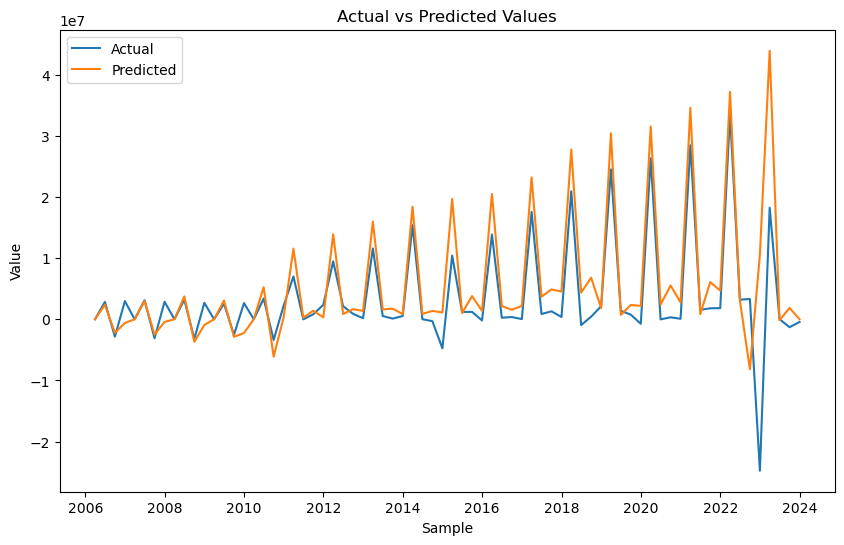

MAPE Zobowiązania długoterminowe:  inf %
Długoterminowe kredyty i pożyczki
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 334ms/step - loss: 1081323749376.0000 - mae: 590427.6875 - val_loss: 13625903284224.0000 - val_mae: 2328654.5000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 319991218176.0000 - mae: 307356.0000 - val_loss: 9083289600000.0000 - val_mae: 2069139.5000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 435461423104.0000 - mae: 342543.1562 - val_loss: 19656920268800.0000 - val_mae: 2504713.5000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 107065032704.0000 - mae: 172015.5156 - val_loss: 51304277737472.0000 - val_mae: 3880393.7500
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 284173107200.0000 - mae: 278964.8125 - val_loss: 58442941202432.0000 - val_mae: 4143529.7500
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 286317314048.0000 - mae: 270930.7812 - val_loss: 34089449029632.0000 - val_mae: 3179309.0000
Epoch 7/50
2/2 ━━━━━━━━━

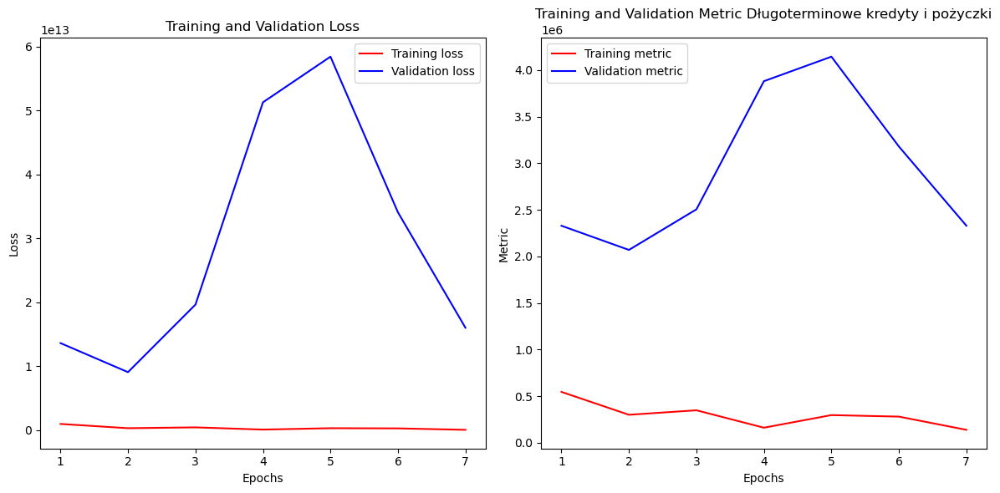

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 471179853824.0000 - mae: 353571.4688 
Test accuracy: 365335.125
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


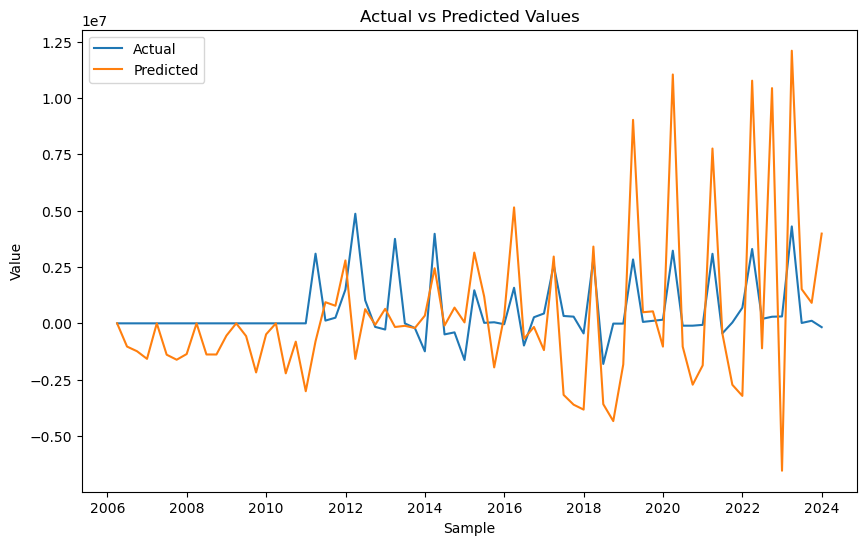

MAPE Długoterminowe kredyty i pożyczki:  inf %
Zobowiązania krótkoterminowe
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 267ms/step - loss: 15199082905600.0000 - mae: 1731879.3750 - val_loss: 65265471586304.0000 - val_mae: 6152222.0000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 10168106483712.0000 - mae: 1404487.5000 - val_loss: 54059813830656.0000 - val_mae: 5777119.5000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 5376087949312.0000 - mae: 1039806.4375 - val_loss: 48196826955776.0000 - val_mae: 5492173.0000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 3487106596864.0000 - mae: 910839.1250 - val_loss: 46341698879488.0000 - val_mae: 5290043.0000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 1781625126912.0000 - mae: 650688.2500 - val_loss: 44826460422144.0000 - val_mae: 5322758.0000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 998069501952.0000 - mae: 550523.5625 - val_loss: 45890534375424.0000 - val_mae: 5368767.0000
Epoch 7/50
2/

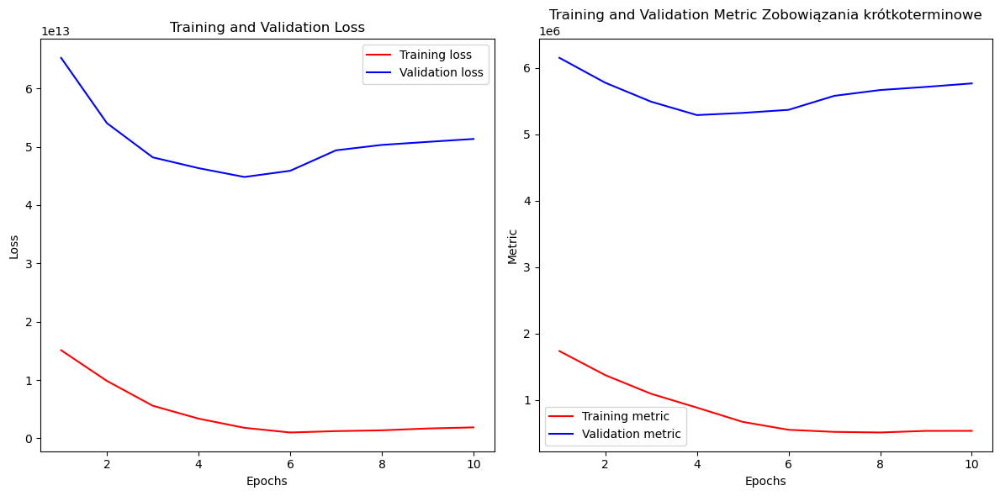

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1122613723136.0000 - mae: 575249.1250 
Test accuracy: 575224.4375
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


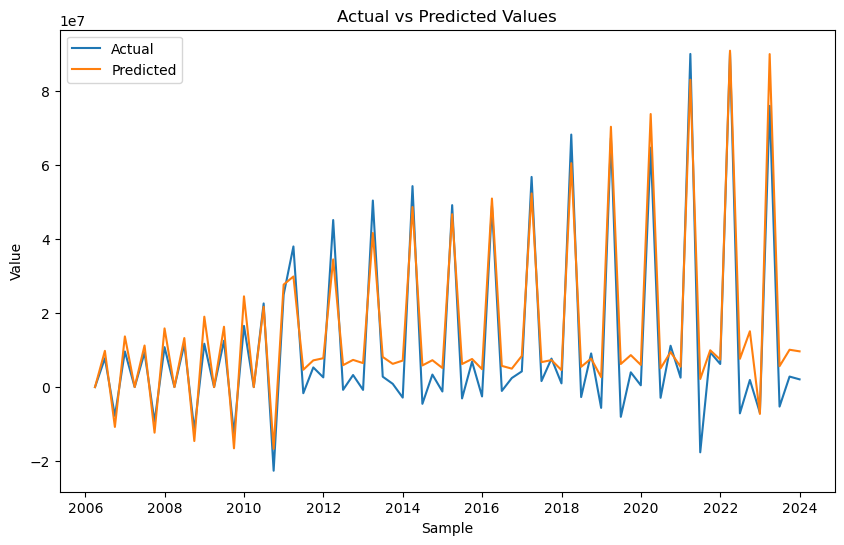

MAPE Zobowiązania krótkoterminowe:  inf %
Pożyczki krótkoterminowe
Epoch 1/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 420ms/step - loss: 1321315729408.0000 - mae: 531784.2500 - val_loss: 116315348008960.0000 - val_mae: 6556773.5000
Epoch 2/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 1393699454976.0000 - mae: 641325.0625 - val_loss: 106476098027520.0000 - val_mae: 5968584.0000
Epoch 3/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 705814003712.0000 - mae: 489527.9375 - val_loss: 88248558813184.0000 - val_mae: 5099053.5000
Epoch 4/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 454145179648.0000 - mae: 368988.0938 - val_loss: 75664153640960.0000 - val_mae: 4414564.5000
Epoch 5/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 271188934656.0000 - mae: 239551.5781 - val_loss: 58058071867392.0000 - val_mae: 3839728.5000
Epoch 6/50
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 330326507520.0000 - mae: 303510.1875 - val_loss: 30536537997312.0000 - val_mae: 2953514.7500
Epoch 7/50
2/2 ━━━━━━━━━━━━━

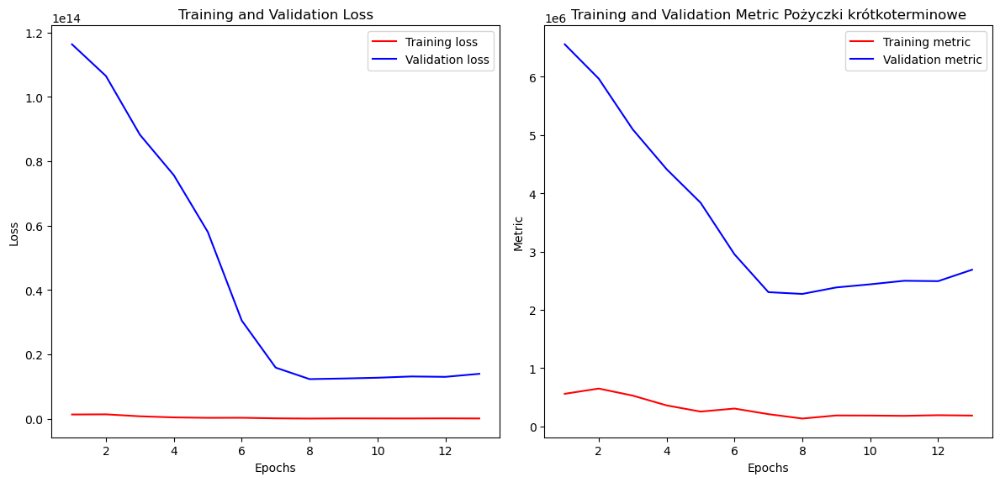

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 116319789056.0000 - mae: 175830.2344
Test accuracy: 181802.796875
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


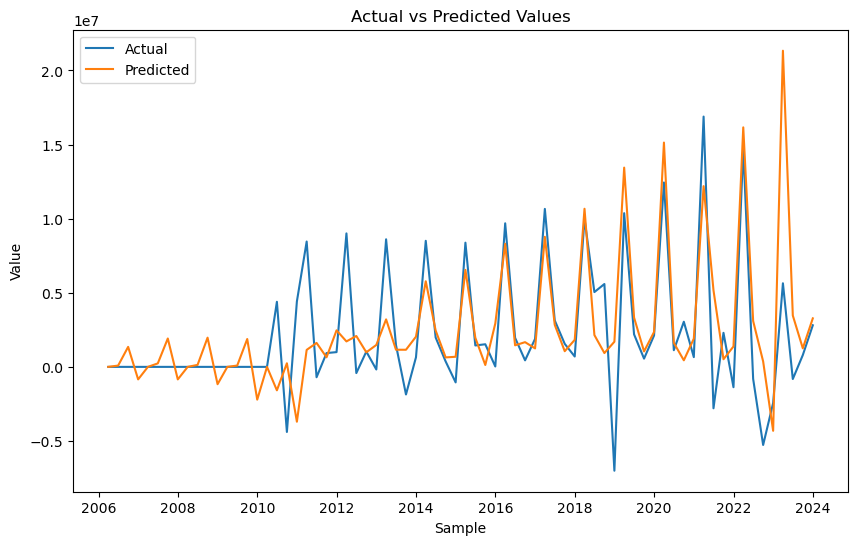

MAPE Pożyczki krótkoterminowe:  inf %


In [9]:
#Sieć neuronowa
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping



for i in list(random_forest_mol.columns):
    print(f"{i}")
    labels = random_forest_mol[f"{i}"]
            
    features = random_forest_mol
    train_l = labels[:43]
    test_l = labels[44:]
            
    train_f = features[:43]
    test_f = features[44:]
    
    
    early_stopping = EarlyStopping(monitor='val_loss', # Metryka monitorowana (wartość funkcji straty na zbiorze walidacyjnym)
                                   patience=5, # Liczba epok bez poprawy, po których trenowanie zostanie zatrzymane
                                   verbose=1, # Poziom szczegółowości komunikatów
                                   restore_best_weights=True)
    
    model = keras.Sequential([
        keras.layers.Dense(128, activation='relu', input_shape=(features.shape[1],)), # Warstwa ukryta z 128 neuronami
        keras.layers.Dense(1) ])
    
    
    model.compile(optimizer='adam',
                  loss='mean_squared_error',
                  metrics=['mae'])
    
    
    
    history = model.fit(train_f, train_l, epochs=50, callbacks=[early_stopping], validation_data=(test_f, test_l))
    
    def plot_learning_curves(history):
        # Pobranie wartości funkcji straty dla zbioru treningowego i walidacyjnego
        train_loss = history.history['loss']
        val_loss = history.history['val_loss']
        
        # Pobranie wartości metryki (np. dokładności) dla zbioru treningowego i walidacyjnego (jeśli dostępne)
        if 'accuracy' in history.history:
            train_metric = history.history['accuracy']
            val_metric = history.history['val_accuracy']
        elif 'mae' in history.history:
            train_metric = history.history['mae']
            val_metric = history.history['val_mae']
        else:
            print("Nie można znaleźć metryki. Sprawdź, czy model jest skonfigurowany do monitorowania odpowiednich metryk.")
            return
        
        # Wygenerowanie krzywych uczenia się
        epochs = range(1, len(train_loss) + 1)
        plt.figure(figsize=(12, 6))
        
        # Wykres funkcji straty
        plt.subplot(1, 2, 1)
        plt.plot(epochs, train_loss, 'r-', label='Training loss')
        plt.plot(epochs, val_loss, 'b-', label='Validation loss')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        
        # Wykres metryki
        plt.subplot(1, 2, 2)
        plt.plot(epochs, train_metric, 'r-', label='Training metric')
        plt.plot(epochs, val_metric, 'b-', label='Validation metric')
        plt.title(f'Training and Validation Metric {i}')
        plt.xlabel('Epochs')
        plt.ylabel('Metric')
        plt.legend()
        
        plt.tight_layout()
        plt.show()
        
    plot_learning_curves(history)
    
    
    # Ocena modelu
    test_loss, test_acc = model.evaluate(train_f, train_l)
    print('Test accuracy:', test_acc)
    actual_values = test_l
    # Przewidywane wartości
    predictions = model.predict(test_f)
    predictions = pd.DataFrame(predictions, index=actual_values.index)
    
    # Rzeczywiste wartości
    
    
    # Wykres prognoz vs rzeczywistość
    plt.figure(figsize=(10, 6))
    plt.plot(actual_values, label='Actual')
    plt.plot(predictions, label='Predicted')
    plt.xlabel('Sample')
    plt.ylabel('Value')
    plt.title('Actual vs Predicted Values')
    plt.legend()
    plt.show()

    def mean_absolute_percentage_error(y_true, y_pred):
        """
        Oblicza średnią bezwzględną błędu procentowego (MAPE).
    
        Parametry:
        y_true : array-like
            Rzeczywiste wartości.
        y_pred : array-like
            Prognozowane wartości.
    
        Zwraca:
        mape : float
            Wartość MAPE.
        """
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    
    mape = mean_absolute_percentage_error(actual_values[:-1], predictions[:-1])
    print(f"MAPE {i}: ", round(mape,2),"%")


In [75]:
test_f

,Przychody ogółem,Zysk brutto ze sprzedaży,Zysk z działalności operacyjnej,EBITDA,Przychody finansowe,Wydatki finansowe,Zysk brutto,Aktywa trwałe,Aktywa obrotowe,Kapitał własny ogółem,Kapitał własny spółki dominującej,Zobowiązania długoterminowe,Długoterminowe kredyty i pożyczki,Zobowiązania krótkoterminowe,Pożyczki krótkoterminowe,Wynik finansowy (zysk / strata)
Date,,,,,,,,,,,,,,,,
2016-12-31,-60161908,-24985548.0,-8438316,-2395209.0,772085,297011,-5187769,-41226999,2133098,-10237734,-8195135,-26249560,0.000000e+00,-2606607,0.000000e+00,0.00
2017-03-31,55110837,22297181.0,8515332,11349068.0,1227046,-2513000,7311678,236837933,48703245,131307550,114426510,106936799,7.555520e+05,47296829,4.424681e+05,-611364.25
2017-06-30,-48622498,-22376520.0,-5583202,-8288372.0,248496,1776023,-3513324,16741454,-6393863,3577827,2438901,-1559136,0.000000e+00,8328900,0.000000e+00,0.00
2017-09-30,-51812273,-22518885.0,-2933248,-6379714.0,-2660039,2539592,-3087524,-9099182,1113665,-7704100,-7105266,2946070,0.000000e+00,-3227487,0.000000e+00,0.00
2017-12-31,-52665392,-24493414.0,18610782,26357154.0,2751589,1980385,21012526,-824339,-1673557,-5276177,-3476125,16176865,0.000000e+00,-13398584,0.000000e+00,0.00
2018-03-31,49818699,21916688.0,5870032,8628274.0,413675,-2486343,3737205,220561584,55197464,128945613,112407974,87099681,7.555520e+05,59713754,4.424681e+05,-611364.25
2018-06-30,-52141668,-22950913.0,-6284707,-9191195.0,-92594,1473260,-4854463,-3953669,-1753468,-3883142,-3371311,-11996212,0.000000e+00,10172217,0.000000e+00,0.00
2018-09-30,-28928049,-15282830.0,-4933882,-6603487.0,-363499,1747062,-3499153,24597768,-21935264,1710065,589683,3420240,0.000000e+00,-2467801,0.000000e+00,0.00
2018-12-31,-51623584,-33189569.0,-7476379,-10287044.0,-134232,1861335,-5099179,-6379515,21396196,-631310,-9754398,9162653,0.000000e+00,6485338,0.000000e+00,0.00


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


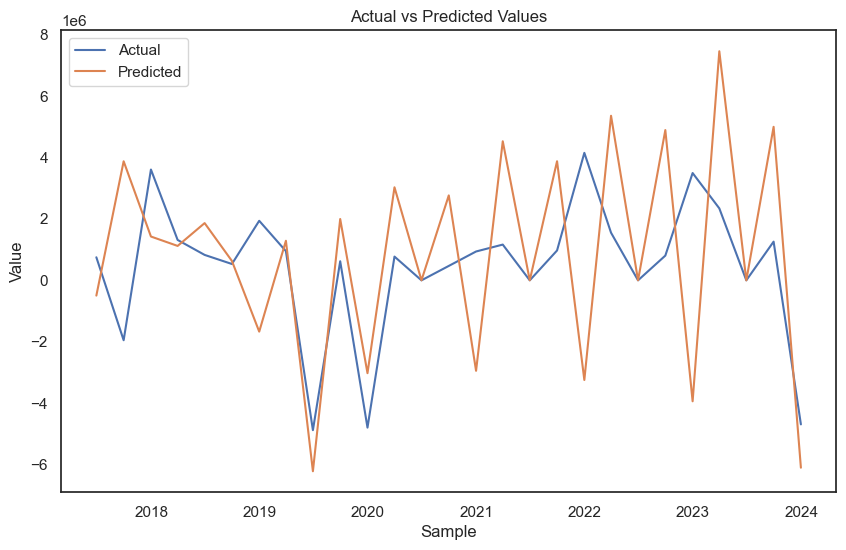

In [52]:
import matplotlib.pyplot as plt

# Przewidywane wartości
predictions = model.predict(test_f[-43:])
predictions = pd.DataFrame(predictions, index=actual_values.index)

# Rzeczywiste wartości
actual_values = test_l[:44]

# Wykres prognoz vs rzeczywistość
plt.figure(figsize=(10, 6))
plt.plot(actual_values, label='Actual')
plt.plot(predictions, label='Predicted')
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('Actual vs Predicted Values')
plt.legend()
plt.show()

In [ ]:
def mean_absolute_percentage_error(y_true, y_pred):
    """
    Oblicza średnią bezwzględną błędu procentowego (MAPE).

    Parametry:
    y_true : array-like
        Rzeczywiste wartości.
    y_pred : array-like
        Prognozowane wartości.

    Zwraca:
    mape : float
        Wartość MAPE.
    """

    df = pd.DataFrame(data={"y_true":y_true[0],"y_pred":y_pred[0]}, index=y_true.index)
    df_filtered = df[df['y_true'] != 0]
    y_true, y_pred = np.array(df_filtered['y_true']), np.array(df_filtered['y_pred'])
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

mape = mean_absolute_percentage_error(actual_values[:-1], predictions[:-1])
print(f"MAPE {i}: ", round(mape,2),"%")